<table class="table table-bordered">
    <tr>
        <th style="text-align:center;"><h1>Data Wrangling</h1><h2>Assignment 2 </h2><h3>Diploma in Data Science</h3></th>
    </tr>
</table>

## Tables of Content <a id="top"></a>

### 1. [Step 1](#step1)

- [1.1 Load & Explore the Data](#step1.1)

- [1.2 Changing Column Name](#step1.2)

- [1.3 Merge Dataframes](#step1.3)

### 2. [Step 2](#step2)

- [2.1 Quantifying Missing Data](#step2.1)

- [2.2 Dropping Uneccessary Columns](#step2.2)

- [2.3 Data Information](#step2.3)

- [2.4 Replace NaN (Not a Number) with '?'](#step2.4)

- [2.5 Changng Data Type](#step2.5)

- [2.6 Elapsed time between 2 variables](#step2.6)

- [2.7 Subset Creation](#step2.7)
        
### 3. [Step 3](#step3)

- [3.1 Winsorisation](#step3.1)

- [3.2 Logarithm Transformation](#step3.2)

- [3.3 Box-Cox Transformation](#step3.3)

- [3.4 Yeo-Johnson Transformation](#step3.4)

- [3.5 Power Transformation](#step3.5)

### 4. [Step 4](#step4)

- [4.1 Train Test Split](#step4.1)

- [4.2 Missing Imputation](#step4.2)

- [4.3 Grouping Rare Categories](#step4.3)

- [4.4 Target Mean Encoding with Feature-Engine](#step4.4)

- [4.5 Variable Discretization/Binning](#step4.5)

- [4.6 Standardization](#step4.6)


### 5. [Step 5](#step5)


### 6. [Report](#step6)

# Identify the ranking of the teams through a prediction model to find out features highly affecting the winning team?

In [1]:
# import the pacakges
import numpy as np
import pandas as pd

# sklearn preprocess
from feature_engine.outliers import Winsorizer
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import KBinsDiscretizer

# feature engine
import feature_engine.imputation as mdi
from feature_engine.variable_handling import check_numerical_variables
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from feature_engine.encoding import OneHotEncoder, MeanEncoder, OrdinalEncoder, RareLabelEncoder
from feature_engine.discretisation import EqualWidthDiscretiser, EqualFrequencyDiscretiser
from sklearn.preprocessing import FunctionTransformer, MinMaxScaler, StandardScaler, RobustScaler
from feature_engine.transformation import LogTransformer
from sklearn.preprocessing import KBinsDiscretizer
from feature_engine.discretisation import EqualWidthDiscretiser

# Visual
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Step 1: Load and Explore the Data <a id="step1.1"></a>

[back to top](#top)

In [3]:
# Dictionary to hold the dataframes
dataframes = {}

### Team

In [4]:
dataframes['team'] = pd.read_csv("./Datasets/files/team.csv")

print(f"Team shape: {dataframes['team'].shape}")
dataframes['team'].head()

Team shape: (2805, 48)


,year,league_id,team_id,franchise_id,div_id,rank,g,ghome,w,l,div_win,wc_win,lg_win,ws_win,r,ab,h,double,triple,hr,bb,so,sb,cs,hbp,sf,ra,er,era,cg,sho,sv,ipouts,ha,hra,bba,soa,e,dp,fp,name,park,attendance,bpf,ppf,team_id_br,team_id_lahman45,team_id_retro
0,1871,NaN,BS1,BNA,NaN,3,31,NaN,20,10,NaN,NaN,N,NaN,401,1372,426,70,37,3,60,19.0,73.0,NaN,NaN,NaN,303,109,3.55,22,1,3,828,367,2,42,23,225,NaN,0.83,Boston Red Stockings,South End Grounds I,NaN,103,98,BOS,BS1,BS1
1,1871,NaN,CH1,CNA,NaN,2,28,NaN,19,9,NaN,NaN,N,NaN,302,1196,323,52,21,10,60,22.0,69.0,NaN,NaN,NaN,241,77,2.76,25,0,1,753,308,6,28,22,218,NaN,0.82,Chicago White Stockings,Union Base-Ball Grounds,NaN,104,102,CHI,CH1,CH1
2,1871,NaN,CL1,CFC,NaN,8,29,NaN,10,19,NaN,NaN,N,NaN,249,1186,328,35,40,7,26,25.0,18.0,NaN,NaN,NaN,341,116,4.11,23,0,0,762,346,13,53,34,223,NaN,0.81,Cleveland Forest Citys,National Association Grounds,NaN,96,100,CLE,CL1,CL1
3,1871,NaN,FW1,KEK,NaN,7,19,NaN,7,12,NaN,NaN,N,NaN,137,746,178,19,8,2,33,9.0,16.0,NaN,NaN,NaN,243,97,5.17,19,1,0,507,261,5,21,17,163,NaN,0.80,Fort Wayne Kekiongas,Hamilton Field,NaN,101,107,KEK,FW1,FW1
4,1871,NaN,NY2,NNA,NaN,5,33,NaN,16,17,NaN,NaN,N,NaN,302,1404,403,43,21,1,33,15.0,46.0,NaN,NaN,NaN,313,121,3.72,32,1,0,879,373,7,42,22,227,NaN,0.83,New York Mutuals,Union Grounds (Brooklyn),NaN,90,88,NYU,NY2,NY2


In [5]:
dataframes['team'] = dataframes['team'].drop(columns = ['franchise_id', 
                                                        'div_id', 
                                                        'ghome',
                                                        'ab',
                                                        'name', 
                                                        'park', 
                                                        'attendance', 
                                                        'fp',
                                                        'hr',
                                                        'hbp',
                                                        'so',
                                                        'bb',
                                                        'cg',
                                                        'ab',
                                                        'h',
                                                        'team_id_br', 
                                                        'team_id_lahman45', 
                                                        'team_id_retro'], axis=1)

### Fielding

In [6]:
dataframes['fielding'] = pd.read_csv("./Datasets/files/fielding.csv")

print(f"Fielding shape: {dataframes['fielding'].shape}")
dataframes['fielding'].head()

Fielding shape: (170526, 18)


,player_id,year,stint,team_id,league_id,pos,g,gs,inn_outs,po,a,e,dp,pb,wp,sb,cs,zr
0,abercda01,1871,1,TRO,NaN,SS,1,NaN,NaN,1.0,3.0,2.0,0.0,NaN,NaN,NaN,NaN,NaN
1,addybo01,1871,1,RC1,NaN,2B,22,NaN,NaN,67.0,72.0,42.0,5.0,NaN,NaN,NaN,NaN,NaN
2,addybo01,1871,1,RC1,NaN,SS,3,NaN,NaN,8.0,14.0,7.0,0.0,NaN,NaN,NaN,NaN,NaN
3,allisar01,1871,1,CL1,NaN,2B,2,NaN,NaN,1.0,4.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
4,allisar01,1871,1,CL1,NaN,OF,29,NaN,NaN,51.0,3.0,7.0,1.0,NaN,NaN,NaN,NaN,NaN


In [7]:
dataframes['fielding'] = dataframes['fielding'].drop(columns = ['player_id','stint','e','inn_outs'], axis=1)

### Batting

In [8]:
dataframes['batting'] = pd.read_csv("./Datasets/files/batting.csv")

print(f"Batting shape: {dataframes['batting'].shape}")
dataframes['batting'].head()

Batting shape: (101332, 22)


,player_id,year,stint,team_id,league_id,g,ab,r,h,double,triple,hr,rbi,sb,cs,bb,so,ibb,hbp,sh,sf,g_idp
0,abercda01,1871,1,TRO,NaN,1,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1,addybo01,1871,1,RC1,NaN,25,118.0,30.0,32.0,6.0,0.0,0.0,13.0,8.0,1.0,4.0,0.0,NaN,NaN,NaN,NaN,NaN
2,allisar01,1871,1,CL1,NaN,29,137.0,28.0,40.0,4.0,5.0,0.0,19.0,3.0,1.0,2.0,5.0,NaN,NaN,NaN,NaN,NaN
3,allisdo01,1871,1,WS3,NaN,27,133.0,28.0,44.0,10.0,2.0,2.0,27.0,1.0,1.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN
4,ansonca01,1871,1,RC1,NaN,25,120.0,29.0,39.0,11.0,3.0,0.0,16.0,6.0,2.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN


In [9]:
dataframes['batting'] = dataframes['batting'].drop(columns = ['player_id', 'stint','sb','cs','double','triple'], axis=1)

### Home Game

In [10]:
dataframes['home_game'] = pd.read_csv("./Datasets/files/home_game.csv")

print(f"Home Game shape: {dataframes['home_game'].shape}")
dataframes['home_game'].head()

Home Game shape: (2944, 9)


,year,league_id,team_id,park_id,span_first,span_last,games,openings,attendance
0,1871,NaN,BS1,BOS01,1871-05-16,1871-10-07,16,16,32600
1,1871,NaN,BS1,NYC01,1871-05-27,1871-05-27,1,1,3000
2,1871,NaN,CH1,CHI01,1871-05-08,1871-09-29,16,15,85500
3,1871,NaN,CH1,NYC01,1871-10-30,1871-10-30,1,1,600
4,1871,NaN,CL1,CIN01,1871-05-13,1871-07-22,2,2,2200


In [11]:
dataframes['home_game'] = dataframes['home_game'].drop(columns = ['park_id'], axis=1)

### Changing Column Name <a id="step1.2"></a>

This is to avoid any confusion of duplicated column names despite the values referring to different statistic.

[back to top](#top)

In [12]:
fielding_map={
    'year': 'year',
    'team_id': 'team_id',
    'league_id': 'league_id',
    'pos': 'f_pos',
    'g': 'f_g',
    'gs': 'f_gs',
    'po': 'f_po',
    'a': 'f_a',
    'dp': 'f_dp',
    'pb': 'f_pb',
    'wp': 'f_wp',
    'sb': 'f_sb',
    'cs': 'f_cs',
    'zr': 'f_zr'
}

batting_map = {
    'year': 'year',
    'team_id': 'team_id',
    'league_id': 'league_id',
    'g': 'b_g',
    'ab': 'b_ab',
    'r': 'b_r',
    'h': 'b_h',
    'hr': 'b_hr',
    'rbi': 'b_rbi',
    'bb': 'b_bb',
    'so': 'b_so',
    'ibb': 'b_ibb',
    'hbp': 'b_hbp',
    'sh': 'b_sh',
    'sf': 'b_sf',
    'g_idp': 'b_g_idp'
}


dataframes['batting'] = dataframes['batting'].rename(columns = batting_map)
dataframes['fielding'] = dataframes['fielding'].rename(columns = fielding_map)


### Merge Dataframes <a id="step1.3"></a>

[back to top](#top)

In [13]:
data = dataframes['team'].merge(dataframes['fielding'], on = ['team_id', 'year', 'league_id'], how = 'inner')

data = data.merge(dataframes['batting'], on = ['team_id', 'year', 'league_id'], how = 'inner')

final_data = data.merge(dataframes['home_game'], on = ['team_id', 'year','league_id'], how = 'inner')

In [14]:
final_data.head()

,year,league_id,team_id,rank,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,sf,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,f_pb,f_wp,f_sb,f_cs,f_zr,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,span_first,span_last,games,openings,attendance
0,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,NaN,NaN,NaN,NaN,NaN,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16,32600
1,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,NaN,NaN,NaN,NaN,NaN,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,1871-05-27,1871-05-27,1,1,3000
2,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,NaN,NaN,NaN,NaN,NaN,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16,32600
3,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,NaN,NaN,NaN,NaN,NaN,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1871-05-27,1871-05-27,1,1,3000
4,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,NaN,NaN,NaN,NaN,NaN,29,152.0,51.0,46.0,0.0,24.0,4.0,4.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16,32600


In [15]:
final_data.tail()

,year,league_id,team_id,rank,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,sf,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,f_pb,f_wp,f_sb,f_cs,f_zr,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,span_first,span_last,games,openings,attendance
6730018,2014,NL,WAS,1,162,96,66,Y,N,N,N,686,265,27,101.0,23.0,41.0,555,495,3.03,19,45,4412,1351,110,352,1288,100,139.0,104,102,OF,30,NaN,48.0,2.0,0.0,NaN,NaN,NaN,NaN,NaN,15,12.0,0.0,1.0,0.0,0.0,1.0,8.0,0.0,0.0,2.0,0.0,0.0,2014-04-04,2014-09-28,81,81,2579389
6730019,2014,NL,WAS,1,162,96,66,Y,N,N,N,686,265,27,101.0,23.0,41.0,555,495,3.03,19,45,4412,1351,110,352,1288,100,139.0,104,102,OF,30,NaN,48.0,2.0,0.0,NaN,NaN,NaN,NaN,NaN,32,39.0,7.0,8.0,3.0,5.0,4.0,16.0,0.0,0.0,0.0,0.0,0.0,2014-04-04,2014-09-28,81,81,2579389
6730020,2014,NL,WAS,1,162,96,66,Y,N,N,N,686,265,27,101.0,23.0,41.0,555,495,3.03,19,45,4412,1351,110,352,1288,100,139.0,104,102,OF,30,NaN,48.0,2.0,0.0,NaN,NaN,NaN,NaN,NaN,147,534.0,85.0,156.0,16.0,82.0,83.0,113.0,3.0,9.0,0.0,3.0,9.0,2014-04-04,2014-09-28,81,81,2579389
6730021,2014,NL,WAS,1,162,96,66,Y,N,N,N,686,265,27,101.0,23.0,41.0,555,495,3.03,19,45,4412,1351,110,352,1288,100,139.0,104,102,OF,30,NaN,48.0,2.0,0.0,NaN,NaN,NaN,NaN,NaN,32,55.0,3.0,10.0,0.0,1.0,2.0,21.0,0.0,0.0,9.0,1.0,0.0,2014-04-04,2014-09-28,81,81,2579389
6730022,2014,NL,WAS,1,162,96,66,Y,N,N,N,686,265,27,101.0,23.0,41.0,555,495,3.03,19,45,4412,1351,110,352,1288,100,139.0,104,102,OF,30,NaN,48.0,2.0,0.0,NaN,NaN,NaN,NaN,NaN,61,214.0,26.0,60.0,5.0,38.0,22.0,37.0,0.0,0.0,0.0,4.0,6.0,2014-04-04,2014-09-28,81,81,2579389


### Step 2: Data Wrangling on multiple tables <a id="step2"></a>

[back to top](#top)

### Quantifying Missing Data <a id="step2.1"></a>

[back to top](#top)

In [16]:
missing = final_data.isnull().mean().sort_values()

if missing.any():
    print(missing[missing > 0])

league_id    0.005415
lg_win       0.010564
sb           0.021306
dp           0.059009
ws_win       0.064390
b_bb         0.065286
b_hr         0.065286
b_h          0.065286
b_r          0.065286
b_ab         0.065286
b_rbi        0.070337
b_hbp        0.086269
f_po         0.090724
f_dp         0.090726
f_a          0.090726
b_sh         0.117211
b_so         0.128195
cs           0.175060
b_g_idp      0.252000
b_sf         0.319308
b_ibb        0.324009
div_win      0.376621
f_gs         0.544871
wc_win       0.661647
sf           0.746159
f_pb         0.937556
f_cs         0.962774
f_sb         0.962774
f_zr         0.974978
f_wp         0.974978
dtype: float64


In [17]:
final_data = final_data.drop(columns = ['sf', 'f_pb', 'f_cs', 'f_sb', 'f_zr', 'f_wp','attendance'], axis = 1)

I removed the columns with a null percentage of 70% and above as it would affect the reliability of the dataset during the missing imputation. 

### Dropping unecessary columns <a id="step2.2"></a>

[back to top](#top)

In [18]:
final_data = final_data.drop_duplicates()

In [19]:
final_data.head()

,year,league_id,team_id,rank,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,span_first,span_last,games,openings
0,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16
1,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,1871-05-27,1871-05-27,1,1
2,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16
3,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1871-05-27,1871-05-27,1,1
4,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,29,152.0,51.0,46.0,0.0,24.0,4.0,4.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16


### Data Information <a id="step2.3"></a>

[back to top](#top)

In [20]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6368345 entries, 0 to 6730022
Data columns (total 53 columns):
 #   Column      Dtype  
---  ------      -----  
 0   year        int64  
 1   league_id   object 
 2   team_id     object 
 3   rank        int64  
 4   g           int64  
 5   w           int64  
 6   l           int64  
 7   div_win     object 
 8   wc_win      object 
 9   lg_win      object 
 10  ws_win      object 
 11  r           int64  
 12  double      int64  
 13  triple      int64  
 14  sb          float64
 15  cs          float64
 16  ra          int64  
 17  er          int64  
 18  era         float64
 19  sho         int64  
 20  sv          int64  
 21  ipouts      int64  
 22  ha          int64  
 23  hra         int64  
 24  bba         int64  
 25  soa         int64  
 26  e           int64  
 27  dp          float64
 28  bpf         int64  
 29  ppf         int64  
 30  f_pos       object 
 31  f_g         int64  
 32  f_gs        float64
 33  f_po        

In [21]:
final_data.describe()

,year,rank,g,w,l,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,games,openings
count,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.234312e+06,5.229991e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,6.368345e+06,5.989424e+06,6.368345e+06,6.368345e+06,6.368345e+06,2.955826e+06,5.897668e+06,5.897651e+06,5.897651e+06,6.368345e+06,6.019217e+06,6.019217e+06,6.019217e+06,6.019217e+06,5.989550e+06,6.019217e+06,5.611975e+06,4.322562e+06,5.887480e+06,5.687665e+06,4.353873e+06,4.800846e+06,6.368345e+06,6.368345e+06
mean,1.970211e+03,4.076153e+00,1.555735e+02,7.603295e+01,7.897570e+01,6.918066e+02,2.406181e+02,4.140765e+01,1.059897e+02,4.796875e+01,7.068731e+02,6.124697e+02,3.966872e+00,9.553235e+00,2.901145e+01,4.164386e+03,1.391905e+03,1.211970e+02,5.067660e+02,8.317493e+02,1.593922e+02,1.449107e+02,1.000220e+02,1.001942e+02,3.432687e+01,2.692248e+01,7.891717e+01,3.019069e+01,6.369407e+00,5.189864e+01,1.483906e+02,1.950775e+01,3.866668e+01,3.178341e+00,1.780454e+01,1.384197e+01,2.287285e+01,1.228627e+00,1.120672e+00,2.195000e+00,1.175870e+00,3.240210e+00,7.487414e+01,6.128961e+01
std,3.645944e+01,2.248063e+00,1.533504e+01,1.532924e+01,1.452942e+01,1.156220e+02,5.225447e+01,1.910800e+01,5.831194e+01,1.935088e+01,1.190619e+02,1.231547e+02,6.970553e-01,4.738768e+00,1.507620e+01,4.227557e+02,1.606887e+02,5.353319e+01,1.033065e+02,2.677944e+02,9.110749e+01,2.439308e+01,4.774718e+00,4.731795e+00,4.109566e+01,4.066147e+01,1.747659e+02,7.407133e+01,1.847249e+01,4.693670e+01,1.857107e+02,2.818932e+01,5.275040e+01,6.685123e+00,2.664386e+01,2.109768e+01,2.971354e+01,2.897945e+00,2.321894e+00,3.910512e+00,2.038114e+00,4.834284e+00,1.579646e+01,2.841230e+01
min,1.871000e+03,1.000000e+00,6.000000e+00,0.000000e+00,4.000000e+00,2.600000e+01,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.400000e+01,2.600000e+01,1.220000e+00,0.000000e+00,0.000000e+00,1.620000e+02,4.900000e+01,0.000000e+00,0.000000e+00,0.000000e+00,5.300000e+01,1.800000e+01,6.000000e+01,6.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00
25%,1.950000e+03,2.000000e+00,1.550000e+02,6.700000e+01,7.000000e+01,6.260000e+02,2.070000e+02,2.800000e+01,6.600000e+01,3.500000e+01,6.350000e+02,5.470000e+02,3.520000e+00,6.000000e+00,1.700000e+01,4.143000e+03,1.332000e+03,8.900000e+01,4.620000e+02,6.330000e+02,1.090000e+02,1.320000e+02,9.700000e+01,9.700000e+01,5.000000e+00,1.000000e+00,2.000000e+00,1.000000e+00,0.000000e+00,1.300000e+01,7.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,7.700000e+01,5.900000e+01
50%,1.980000e+03,4.000000e+00,1.620000e+02,7.700000e+01,7.900000e+01,6.940000e+02,2.440000e+02,3.700000e+01,9.500000e+01,4.600000e+01,7.040000e+02,6.190000e+02,3.950000e+00,9.000000e+00,3.200000e+01,4.308000e+03,1.410000e+03,1.300000e+02,5.150000e+02,8.770000e+02,1.310000e+02,1.470000e+02,1.000000e+02,1.000000e+02,1.700000e+01,7.000000e+00,1.000000e+01,5.000000e+00,1.000000e+00,3.500000e+01,5.600000e+01,5.000000e+00,1.000000e+01,0.000000e+00,4.000000e+00,3.000000e+00,1.100000e+01,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,8.100000e+01,7.600000e+01
75%,1.999000e+03,5.000000e+00,1.620000e+02,8.700000e+01,8.900000e+01,7.610000e+02,2.780000e+02,5.000000e+01,1.320000e+02,5.700000e+01,7.770000e+02,6.910000e+02,4.410000e+00,1.200000e+01,4.100000e+01,4.356000e+03,1.484000e+03,1.600000e+02,5.700000e+02,1.032000e+03,1.660000e+02,1.610000e+02,1.030000e+02,1.030000e+02,4.600000e+01,3.200000e+01,7.

In [22]:
data.nunique(dropna = True)

year          145
league_id       6
team_id       149
rank           13
g             122
w             112
l             113
div_win         2
wc_win          2
lg_win          2
ws_win          2
r             612
double        312
triple        122
sb            323
cs            138
sf             46
ra            608
er            630
era           385
sho            32
sv             66
ipouts        638
ha            743
hra           232
bba           566
soa          1050
e             446
dp            167
bpf            43
ppf            42
f_pos          11
f_g           166
f_gs          165
f_po         1552
f_a           582
f_dp          170
f_pb           89
f_wp           62
f_sb          133
f_cs           71
f_zr           13
b_g           166
b_ab          699
b_r           167
b_h           250
b_hr           67
b_rbi         175
b_bb          155
b_so          203
b_ibb          45
b_hbp          41
b_sh           54
b_sf           20
b_g_idp        35
dtype: int

### Replace NaN (Not a Number) with '?' <a id="step2.4"></a>

[back to top](#top)

In [23]:
final_data = final_data.replace('?', np.nan)
final_data.head()

,year,league_id,team_id,rank,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,span_first,span_last,games,openings
0,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16
1,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,1871-05-27,1871-05-27,1,1
2,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16
3,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1871-05-27,1871-05-27,1,1
4,1871,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,29,152.0,51.0,46.0,0.0,24.0,4.0,4.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16


### Changing Data Type <a id="step2.5"></a>

[back to top](#top)

In [24]:
final_data.dtypes

year            int64
league_id      object
team_id        object
rank            int64
g               int64
w               int64
l               int64
div_win        object
wc_win         object
lg_win         object
ws_win         object
r               int64
double          int64
triple          int64
sb            float64
cs            float64
ra              int64
er              int64
era           float64
sho             int64
sv              int64
ipouts          int64
ha              int64
hra             int64
bba             int64
soa             int64
e               int64
dp            float64
bpf             int64
ppf             int64
f_pos          object
f_g             int64
f_gs          float64
f_po          float64
f_a           float64
f_dp          float64
b_g             int64
b_ab          float64
b_r           float64
b_h           float64
b_hr          float64
b_rbi         float64
b_bb          float64
b_so          float64
b_ibb         float64
b_hbp     

In [25]:
final_data['year'] = final_data['year'].astype('datetime64[ns]').dt.year
final_data['span_first'] = final_data['span_first'].astype('datetime64[ns]')
final_data['span_last'] = final_data['span_last'].astype('datetime64[ns]')

In this code, I have changed the data type of year, f_inn_outs, span_first and span_last from int64, float64 and object to datetime64. As year is suppose to represent the year of when the data was retrieved and the times played during the games.

The other columns are not allowed to be changed into int64 as the columns contain missing values and pandas will set default to float64 in case the missing values contain decimals. 

In [26]:
final_data.dtypes

year                   int32
league_id             object
team_id               object
rank                   int64
g                      int64
w                      int64
l                      int64
div_win               object
wc_win                object
lg_win                object
ws_win                object
r                      int64
double                 int64
triple                 int64
sb                   float64
cs                   float64
ra                     int64
er                     int64
era                  float64
sho                    int64
sv                     int64
ipouts                 int64
ha                     int64
hra                    int64
bba                    int64
soa                    int64
e                      int64
dp                   float64
bpf                    int64
ppf                    int64
f_pos                 object
f_g                    int64
f_gs                 float64
f_po                 float64
f_a           

### Elapsed time between 2 variables <a id="step2.6"></a>

[back to top](#top)

In [27]:
final_data['game_span'] = ((final_data['span_last'] - final_data['span_first'])/np.timedelta64(1,'D'))

final_data.head()

,year,league_id,team_id,rank,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,span_first,span_last,games,openings,game_span
0,1970,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16,144.0
1,1970,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,1871-05-27,1871-05-27,1,1,0.0
2,1970,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16,144.0
3,1970,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1871-05-27,1871-05-27,1,1,0.0
4,1970,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,29,152.0,51.0,46.0,0.0,24.0,4.0,4.0,NaN,NaN,NaN,NaN,NaN,1871-05-16,1871-10-07,16,16,144.0


In [28]:
final_data = final_data.drop(columns=['span_first','span_last'], axis=1)

### Subset Creation <a id="step2.7"></a>

Creating a subset based on the top 5 teams in every year

[back to top](#top)

In [29]:
subset_data = final_data[final_data["rank"].isin([1,2,3,4,5])]

In [30]:
print(subset_data.shape)

subset_data.head()

(4786180, 52)


,year,league_id,team_id,rank,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,games,openings,game_span
0,1970,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,16,16,144.0
1,1970,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,1,1,0.0
2,1970,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,16,16,144.0
3,1970,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1,1,0.0
4,1970,NaN,BS1,3,31,20,10,NaN,NaN,N,NaN,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,2B,16,NaN,42.0,61.0,10.0,29,152.0,51.0,46.0,0.0,24.0,4.0,4.0,NaN,NaN,NaN,NaN,NaN,16,16,144.0


### Categorize the columns into numerical and categorical

In [31]:
num_cols = [c for c in final_data.columns if subset_data[c].dtypes !='O']

print(num_cols)
subset_data[num_cols].head()

['year', 'rank', 'g', 'w', 'l', 'r', 'double', 'triple', 'sb', 'cs', 'ra', 'er', 'era', 'sho', 'sv', 'ipouts', 'ha', 'hra', 'bba', 'soa', 'e', 'dp', 'bpf', 'ppf', 'f_g', 'f_gs', 'f_po', 'f_a', 'f_dp', 'b_g', 'b_ab', 'b_r', 'b_h', 'b_hr', 'b_rbi', 'b_bb', 'b_so', 'b_ibb', 'b_hbp', 'b_sh', 'b_sf', 'b_g_idp', 'games', 'openings', 'game_span']


,year,rank,g,w,l,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,games,openings,game_span
0,1970,3,31,20,10,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,16,NaN,42.0,61.0,10.0,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,16,16,144.0
1,1970,3,31,20,10,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,16,NaN,42.0,61.0,10.0,31,157.0,66.0,63.0,0.0,34.0,13.0,1.0,NaN,NaN,NaN,NaN,NaN,1,1,0.0
2,1970,3,31,20,10,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,16,NaN,42.0,61.0,10.0,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,16,16,144.0
3,1970,3,31,20,10,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,16,NaN,42.0,61.0,10.0,18,86.0,13.0,13.0,0.0,11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1,1,0.0
4,1970,3,31,20,10,401,70,37,73.0,NaN,303,109,3.55,1,3,828,367,2,42,23,225,NaN,103,98,16,NaN,42.0,61.0,10.0,29,152.0,51.0,46.0,0.0,24.0,4.0,4.0,NaN,NaN,NaN,NaN,NaN,16,16,144.0


In [32]:
cat_cols = [c for c in final_data.columns if subset_data[c].dtypes =='O']

print(cat_cols)
subset_data[cat_cols].head()

['league_id', 'team_id', 'div_win', 'wc_win', 'lg_win', 'ws_win', 'f_pos']


,league_id,team_id,div_win,wc_win,lg_win,ws_win,f_pos
0,NaN,BS1,NaN,NaN,N,NaN,2B
1,NaN,BS1,NaN,NaN,N,NaN,2B
2,NaN,BS1,NaN,NaN,N,NaN,2B
3,NaN,BS1,NaN,NaN,N,NaN,2B
4,NaN,BS1,NaN,NaN,N,NaN,2B


### Identifying Correlation Relationship

In [33]:
for cols in num_cols:
    correlation = final_data[cols].corr(final_data['rank'])
    print (f'{cols}: ', correlation)

C:\Users\leong\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\leong\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


year:  nan
rank:  1.0
g:  -0.1888383675323267
w:  -0.7909355902831939
l:  0.617264014948531
r:  -0.4813702918264611
double:  -0.41457857583276714
triple:  0.14843918532463152
sb:  -0.035218822738574074
cs:  0.0416145025003591
ra:  0.34183794491246583
er:  0.11067728624150175
era:  0.275677803737388
sho:  -0.3564552782111026
sv:  -0.49687664921118724
ipouts:  -0.23563232127678407
ha:  0.0901280117288183
hra:  -0.20995421934518962
bba:  0.04191591157192558
soa:  -0.403218957366241
e:  0.4045206381660351
dp:  -0.023988920418211105
bpf:  -0.12169094038497595
ppf:  0.11334187291453043
f_g:  -0.0510652598612956
f_gs:  -0.015307799383514746
f_po:  -0.017910712775005916
f_a:  0.0015095202209251452
f_dp:  -0.01672693217527115
b_g:  -0.05383603997760444
b_ab:  -0.01838437480348458
b_r:  -0.05664378763170682
b_h:  -0.03280004082341922
b_hr:  -0.10233945934919075
b_rbi:  -0.06632392944288318
b_bb:  -0.050184289216268906
b_so:  -0.057632184427029325
b_ibb:  -0.034749394379009646
b_hbp:  -0.02935509

### Step 3: Data Cleansing and Transformation  <a id="step 3"></a>

[back to top](#top)

### Numerical Variables

In [34]:
num_cols_WO = [col for col in num_cols if col not in ["rank", "year", "games", "openings", "game_span","f_inn_outs"]]

print(num_cols_WO)

['g', 'w', 'l', 'r', 'double', 'triple', 'sb', 'cs', 'ra', 'er', 'era', 'sho', 'sv', 'ipouts', 'ha', 'hra', 'bba', 'soa', 'e', 'dp', 'bpf', 'ppf', 'f_g', 'f_gs', 'f_po', 'f_a', 'f_dp', 'b_g', 'b_ab', 'b_r', 'b_h', 'b_hr', 'b_rbi', 'b_bb', 'b_so', 'b_ibb', 'b_hbp', 'b_sh', 'b_sf', 'b_g_idp']


In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

def diagnostic_plots(df, variable):
    if variable not in df.columns:
        raise ValueError(f"Variable '{variable}' not found in DataFrame")
    
    plt.figure(figsize=(15,6))
    plt.suptitle(f"{variable}")

    plt.subplot(1, 3, 1)
    df[variable].hist(bins=30)
    plt.title("Histogram")

    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.title("QQ-Plot")

    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])  # Corrected to use 'df[variable]' directly
    plt.title("Boxplot")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


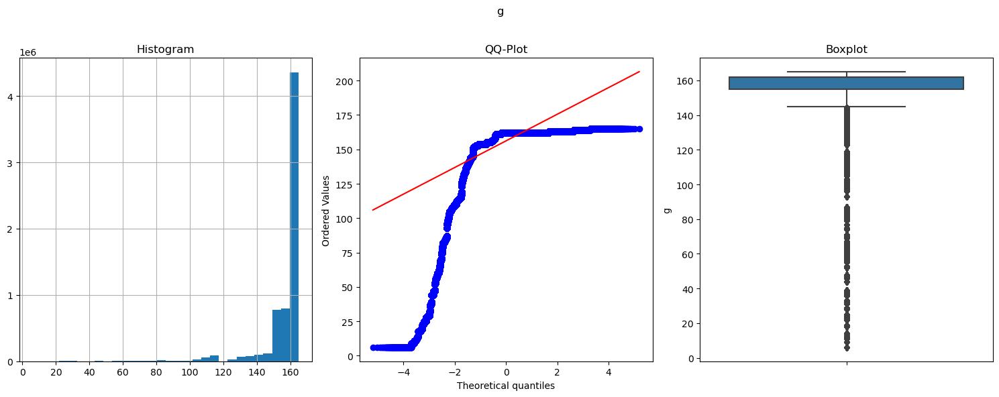

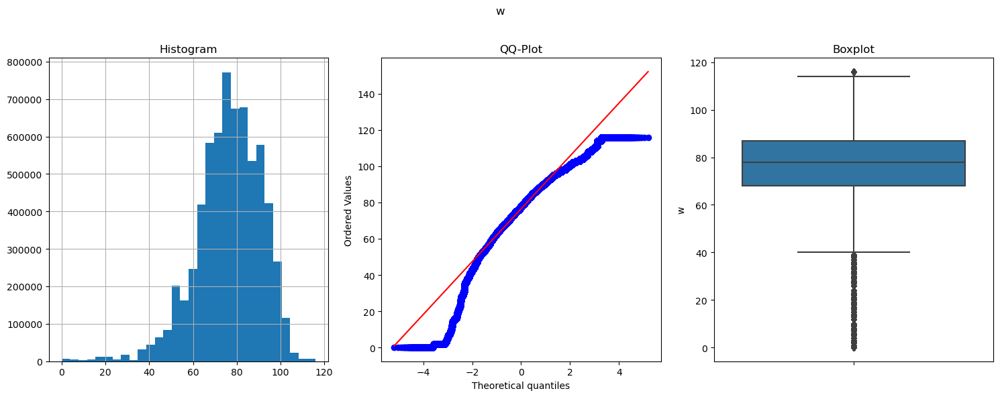

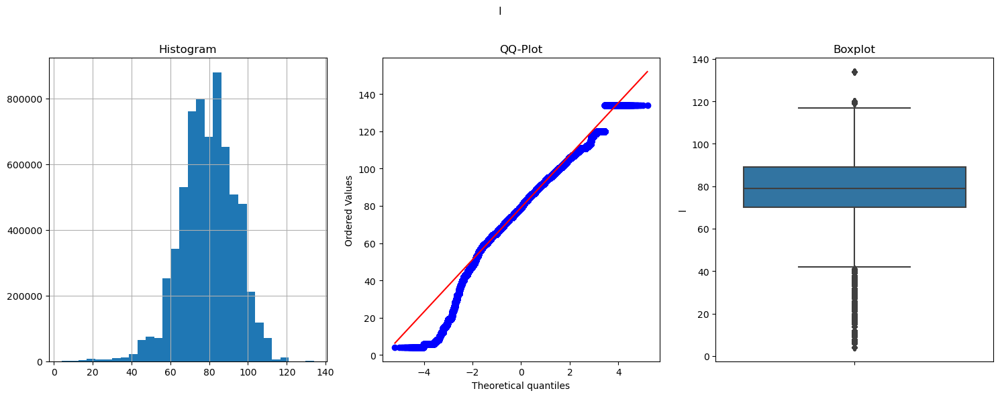

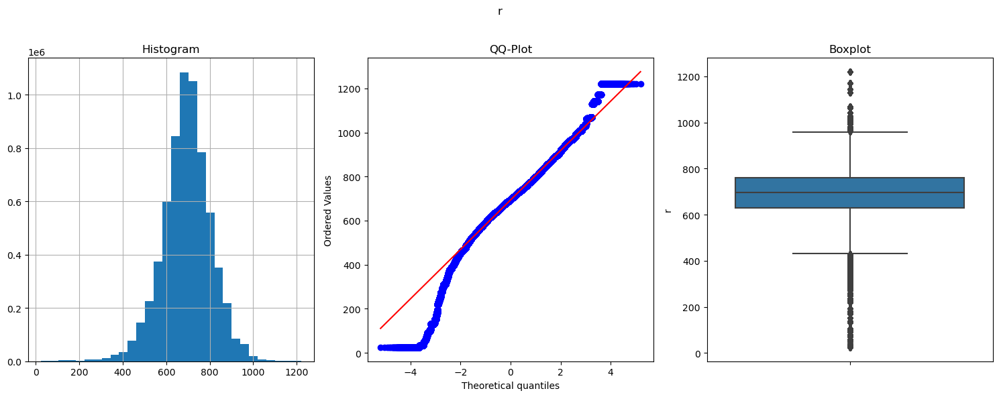

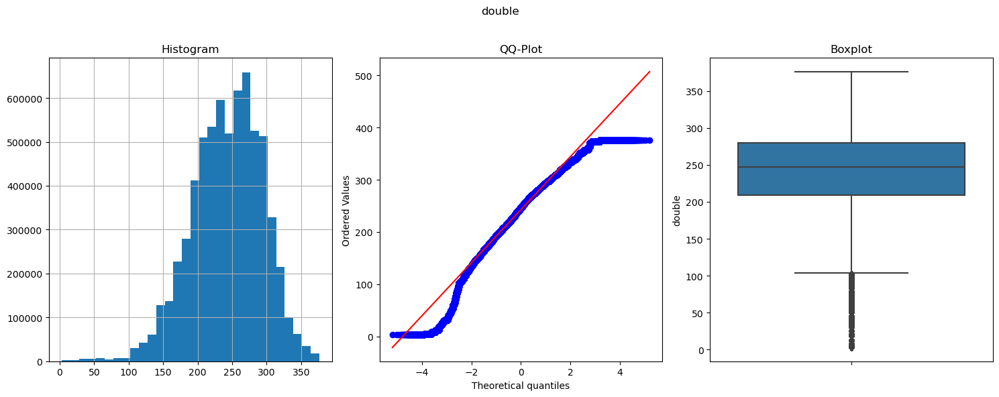

...

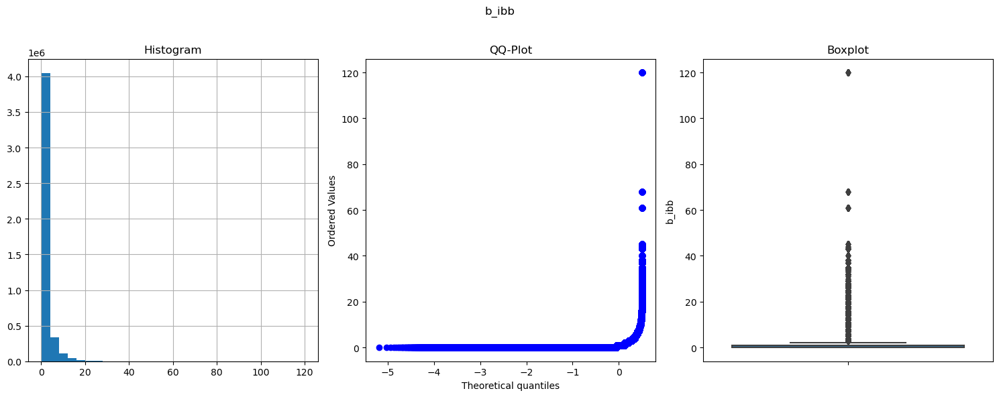

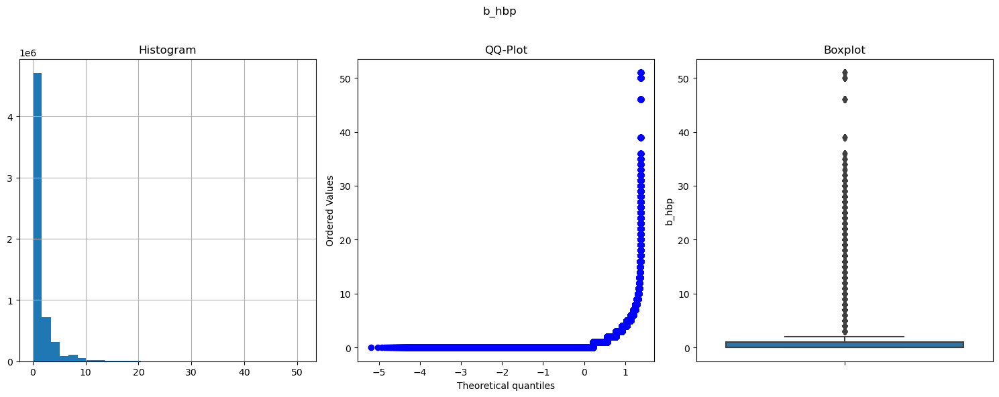

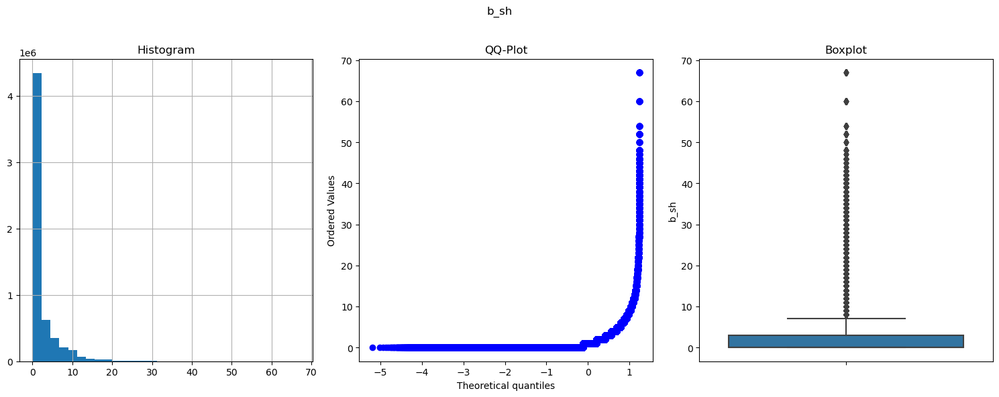

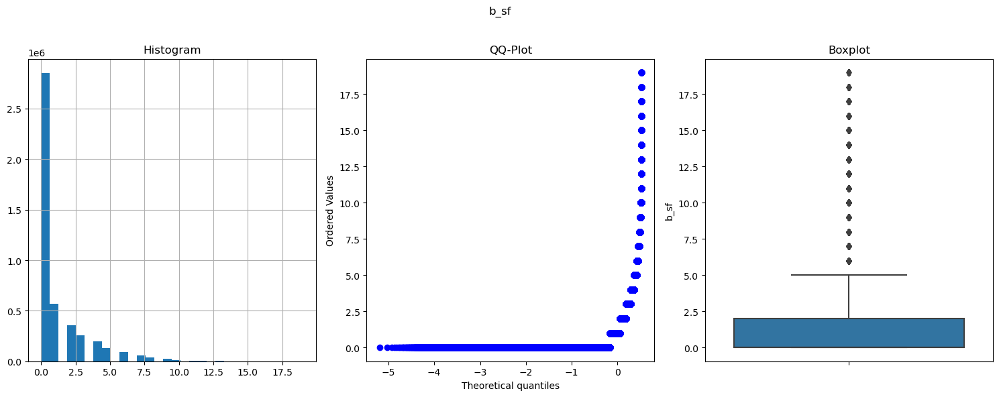

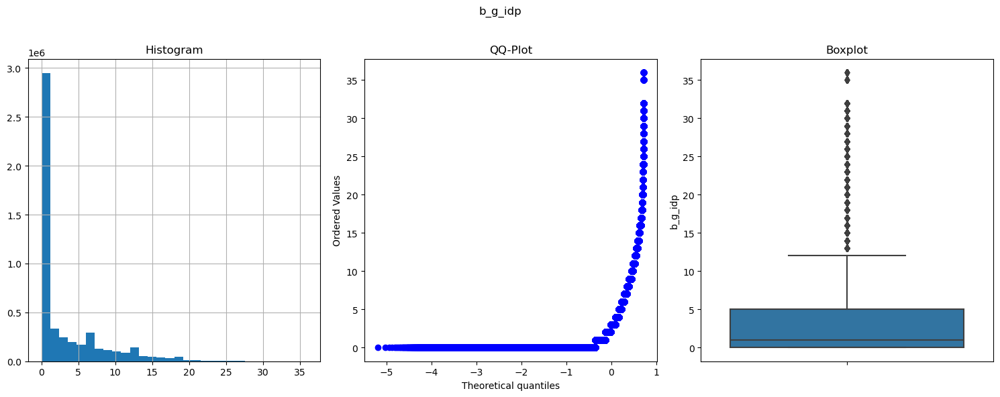

In [36]:
for cols in num_cols_WO:
    diagnostic_plots(data, cols)

### Winsorisation  <a id="step3.1"></a>

[back to top](#top)

In [37]:
def winsorise(df, variable, upper_limit, lower_limit):
    return np.where(df[variable] > upper_limit, upper_limit, 
                    np.where(df[variable] < lower_limit, lower_limit, df[variable]))

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


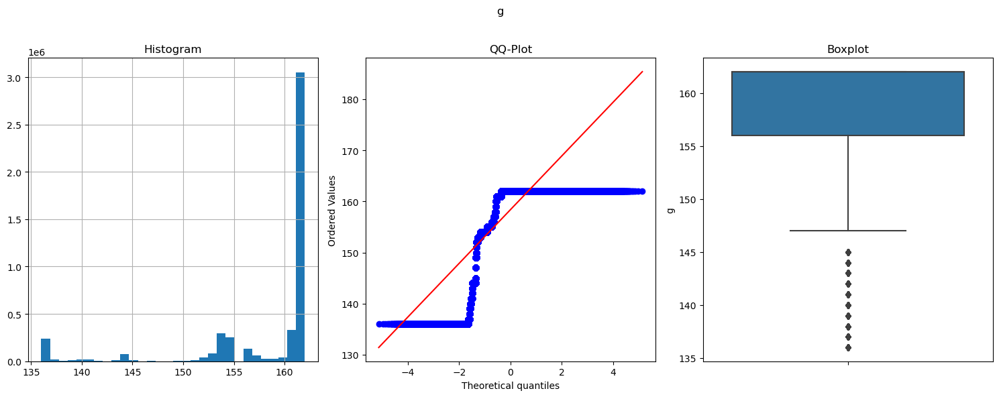

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


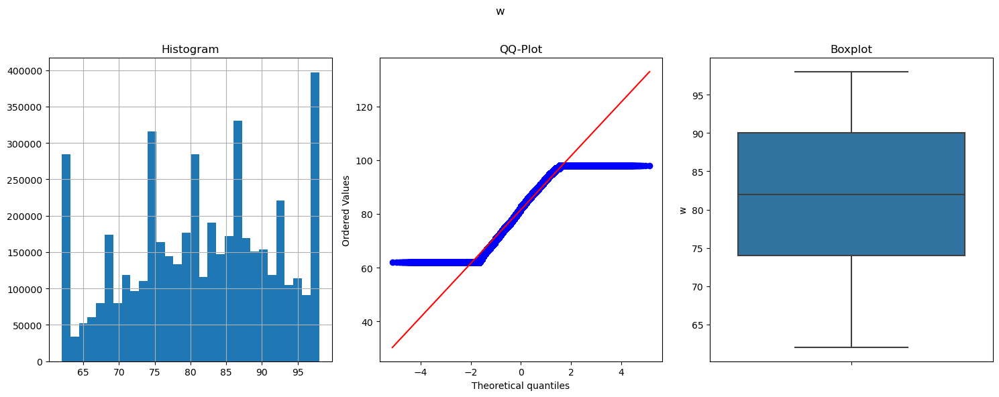

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


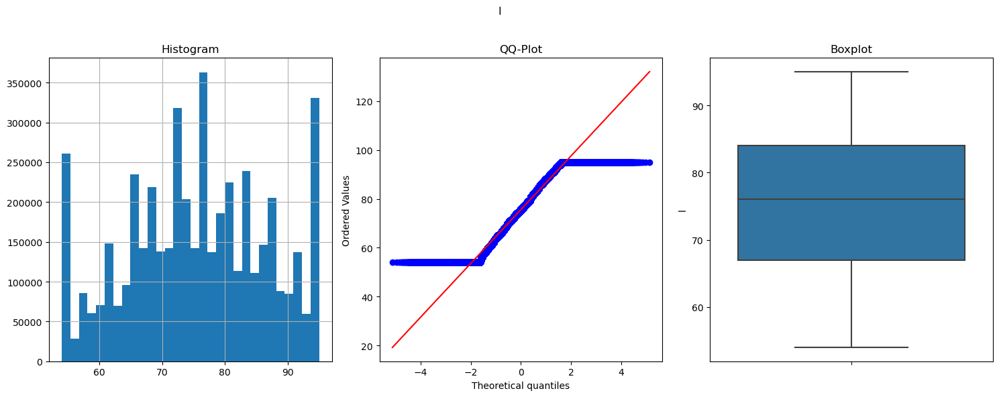

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


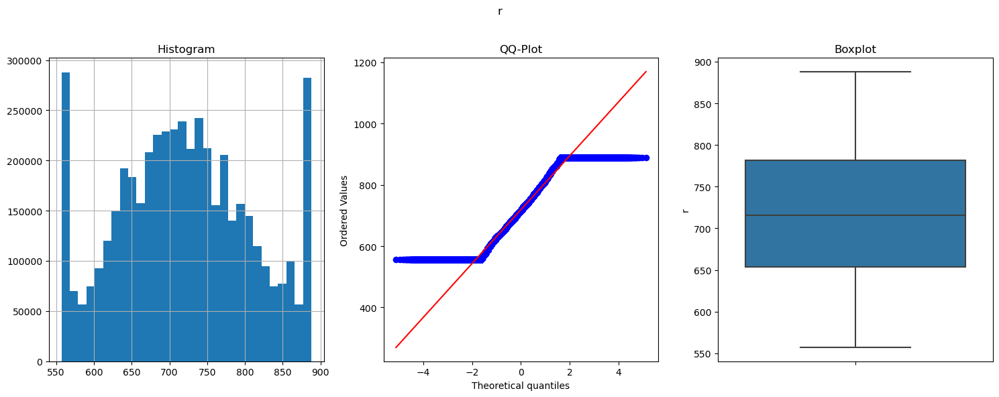

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


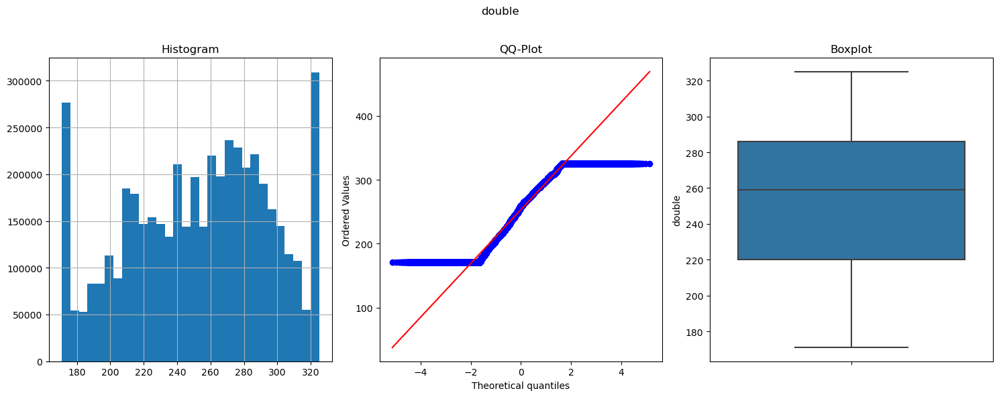

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


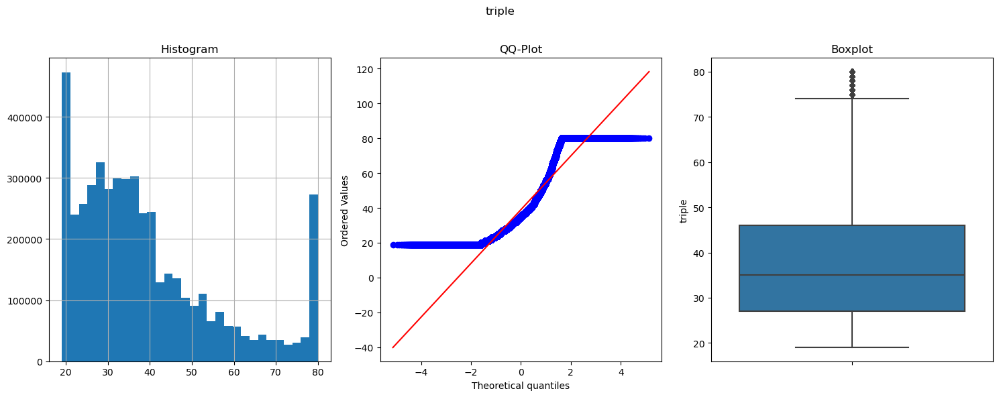

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


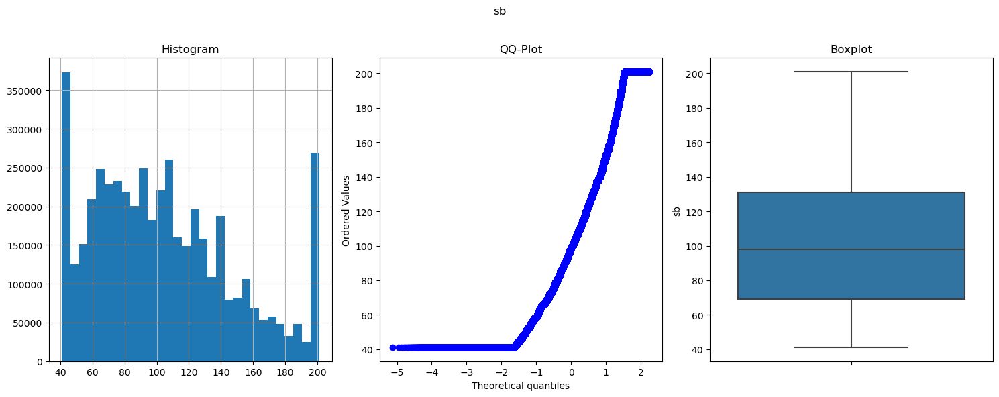

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


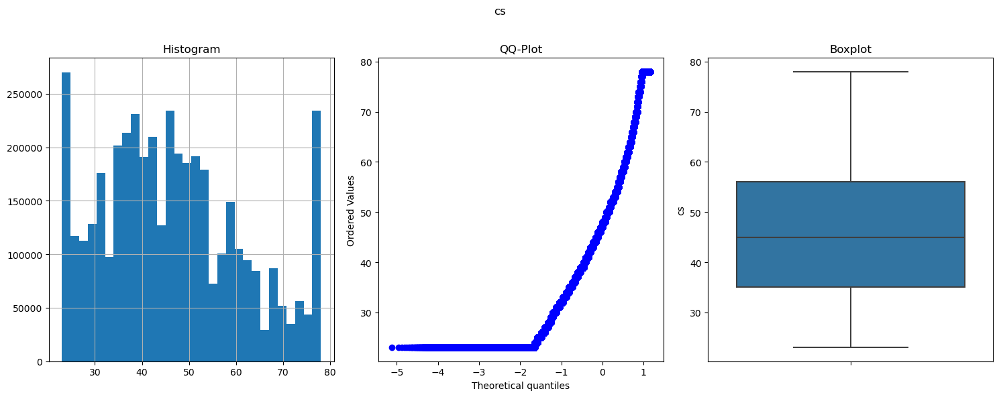

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


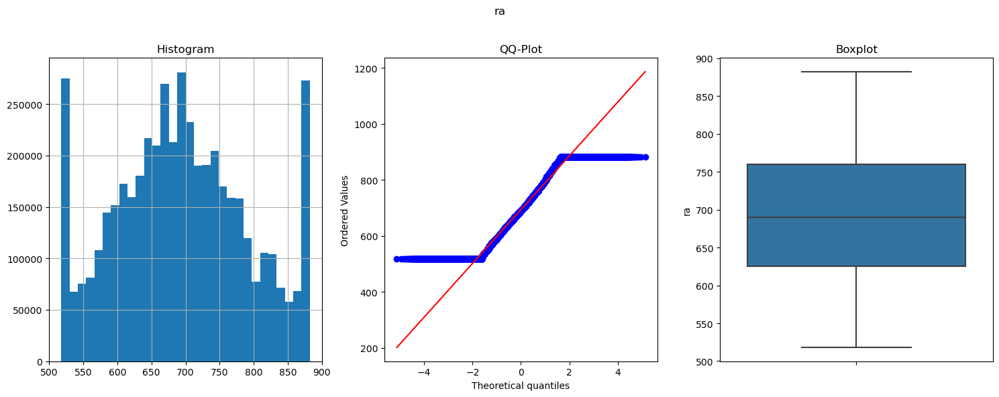

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


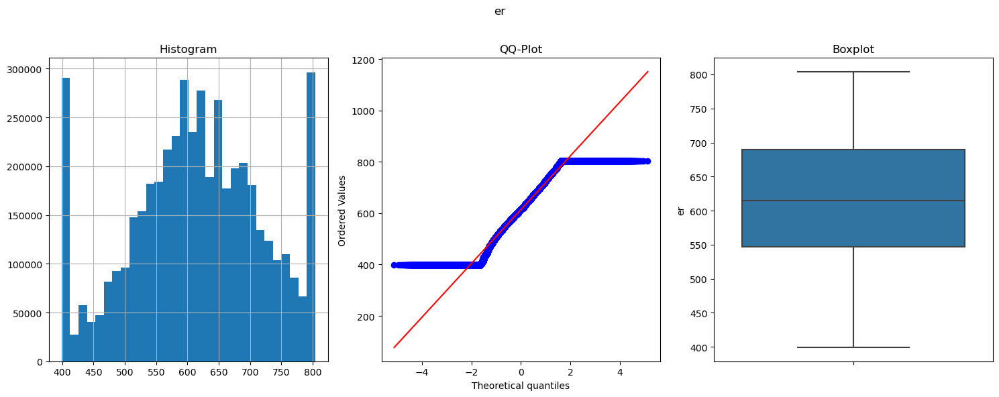

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


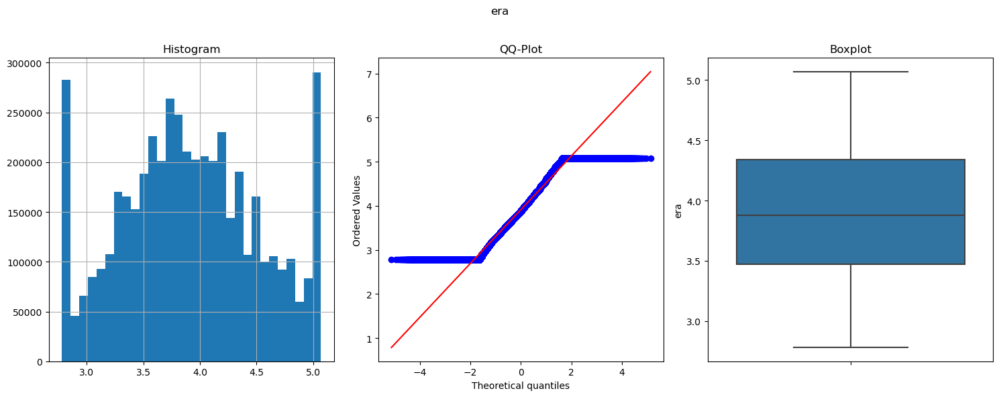

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


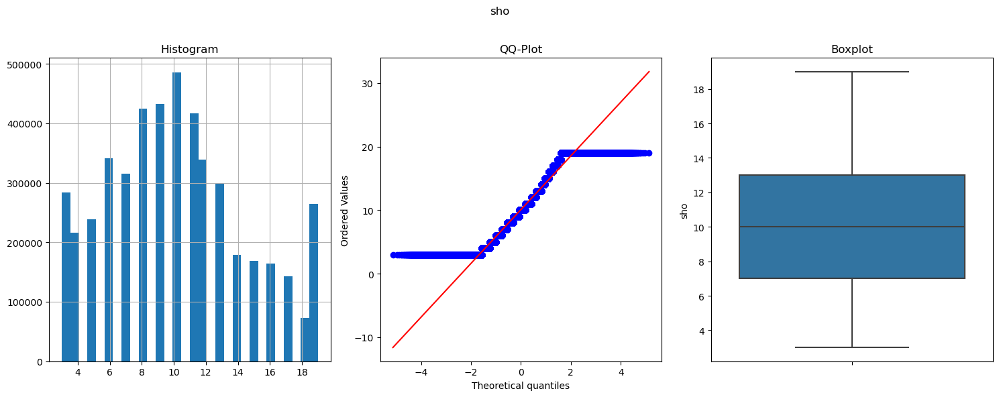

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


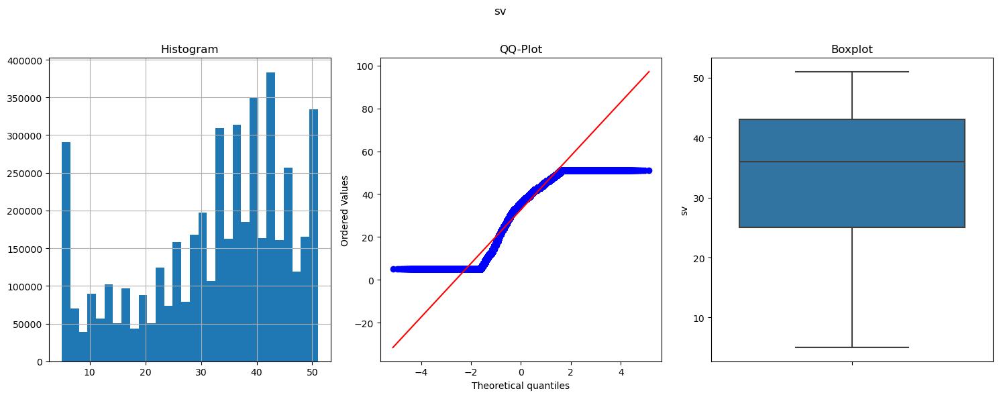

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


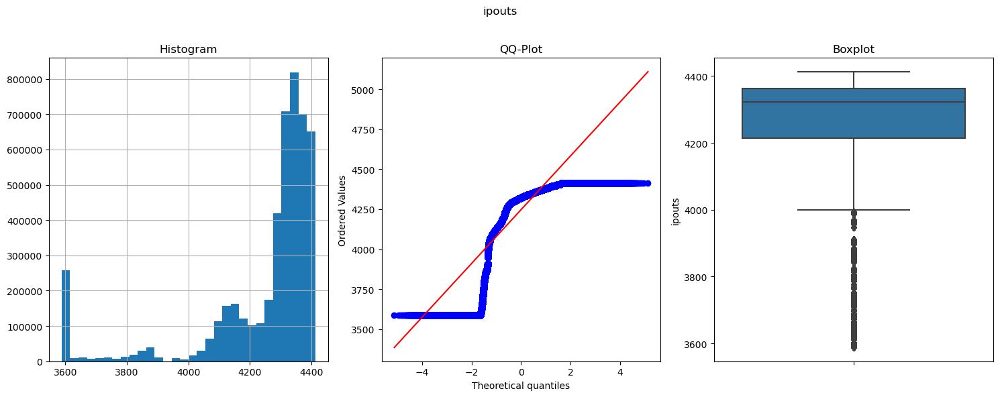

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


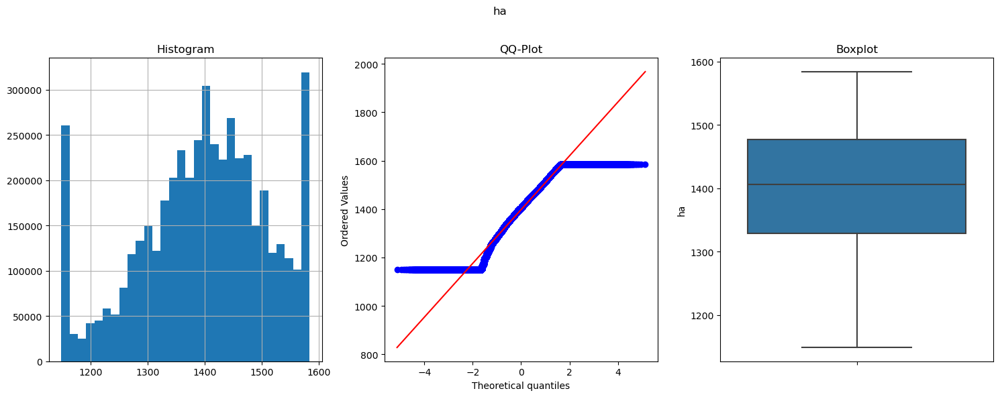

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


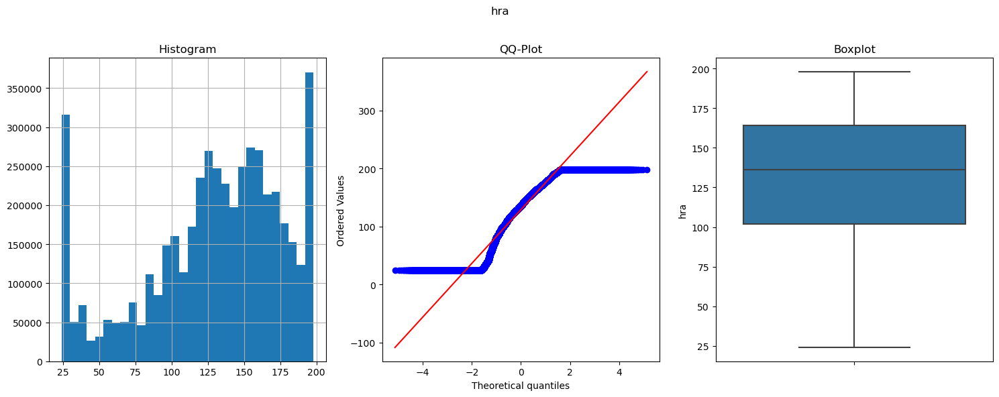

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


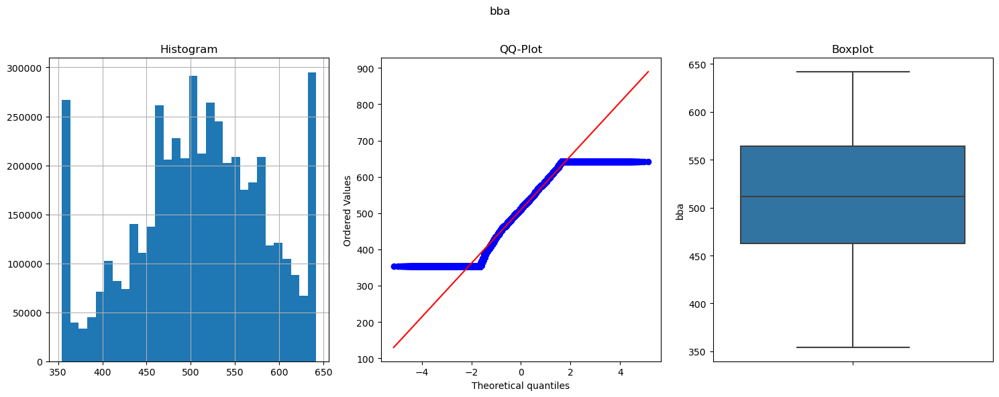

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


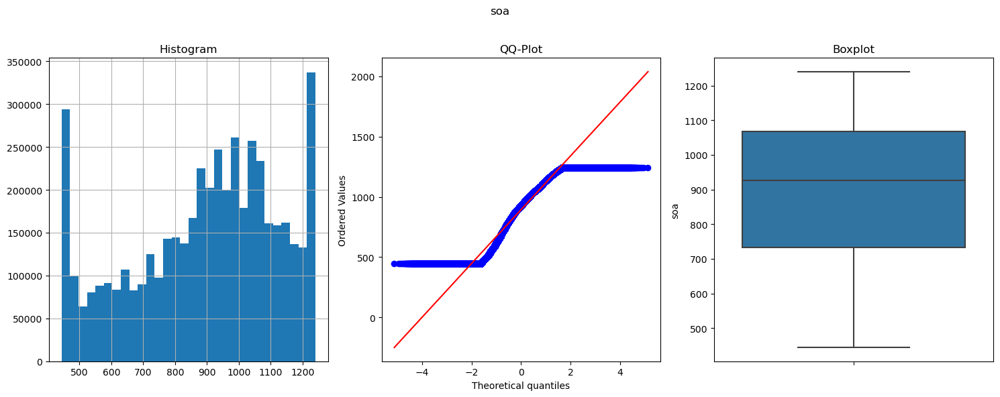

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


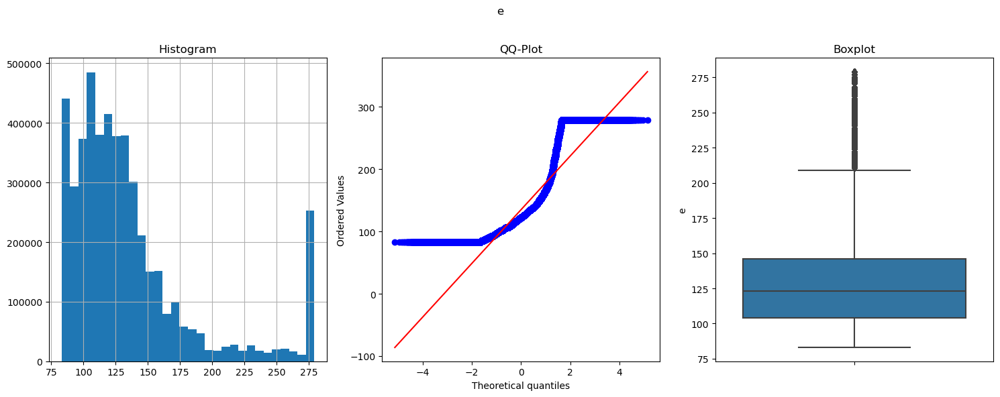

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


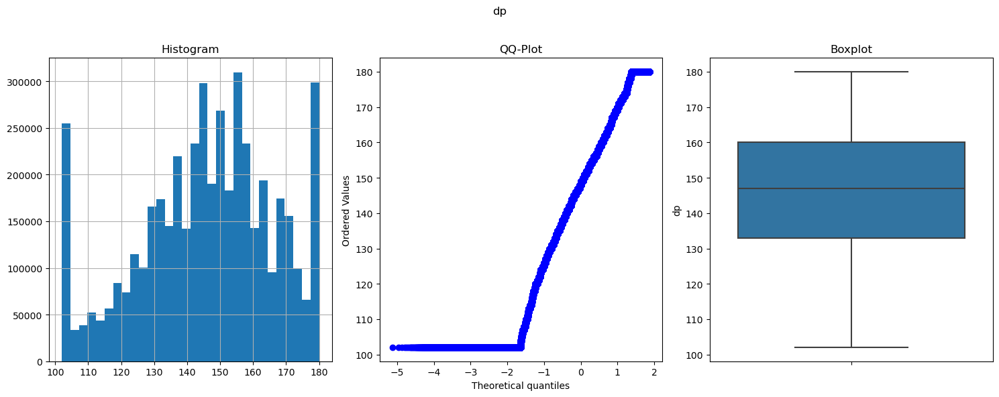

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


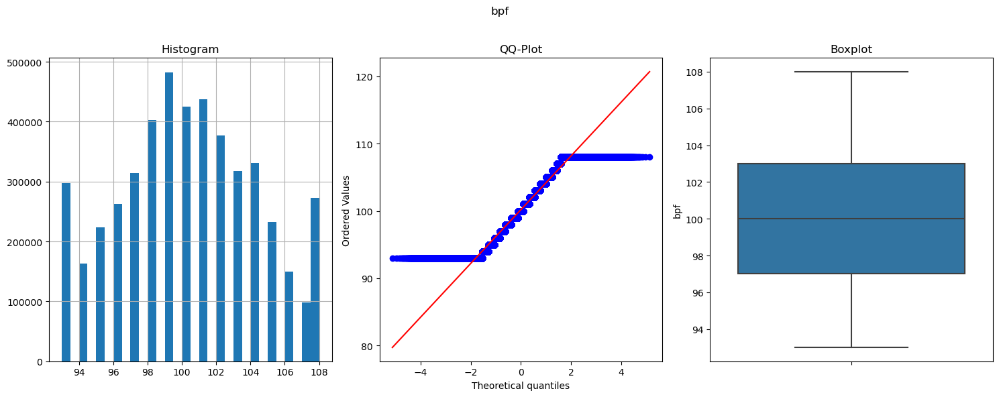

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


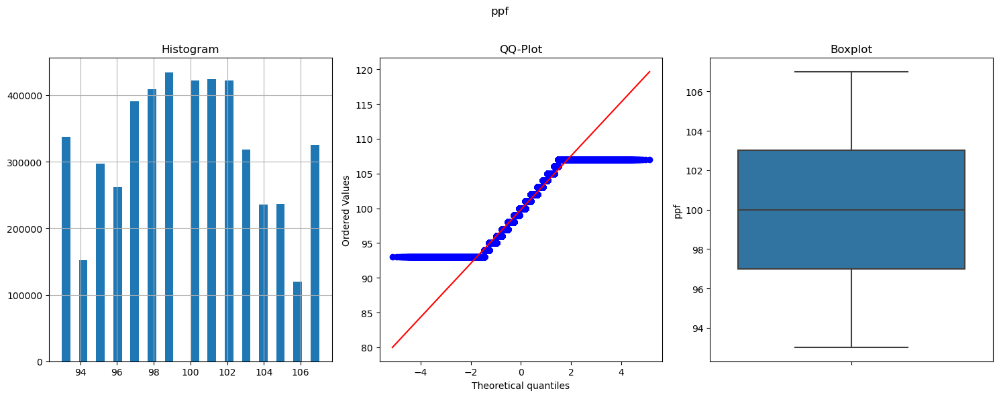

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


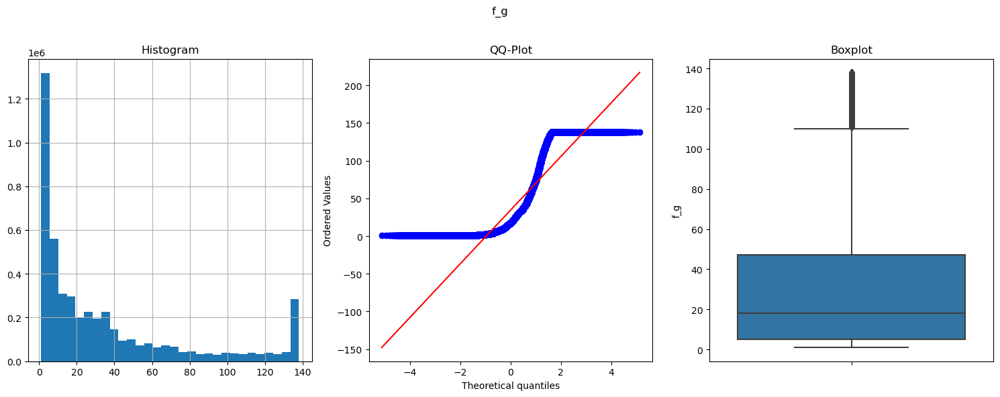

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


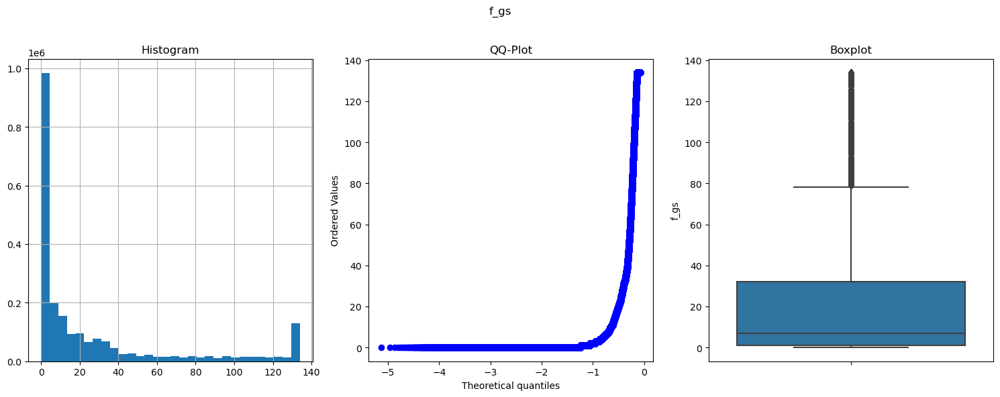

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


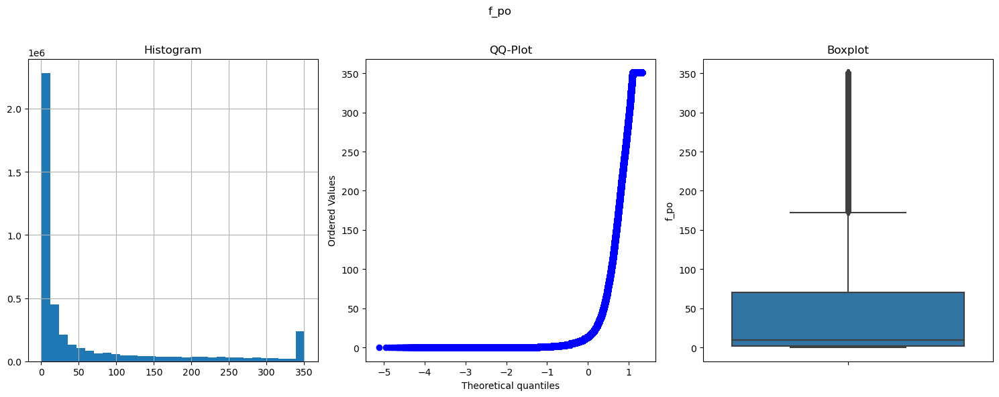

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


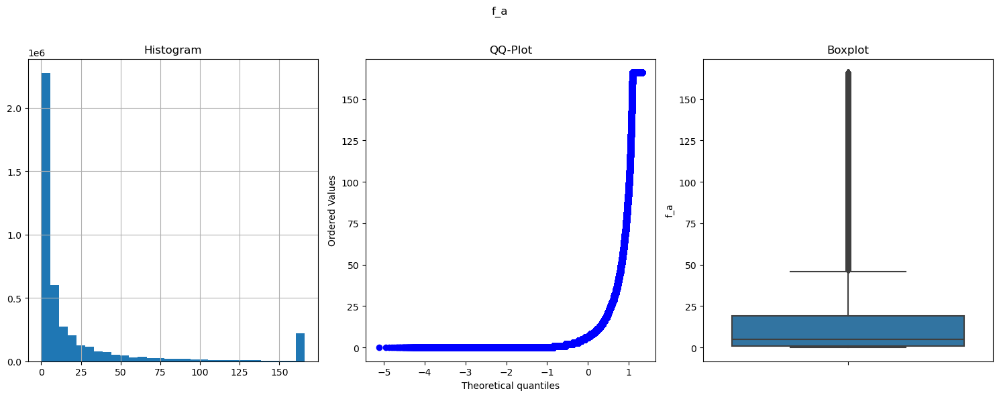

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


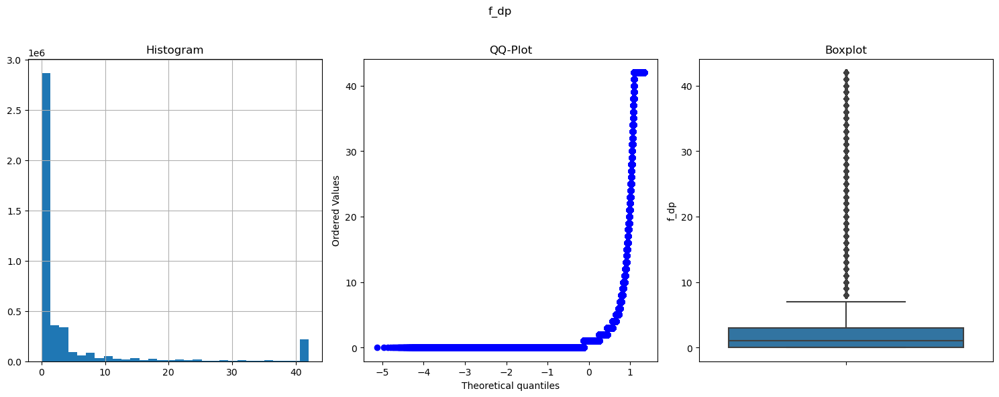

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


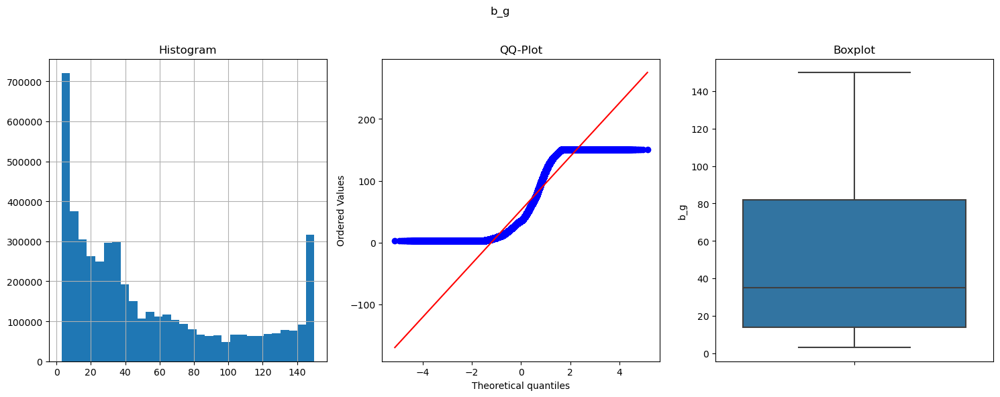

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


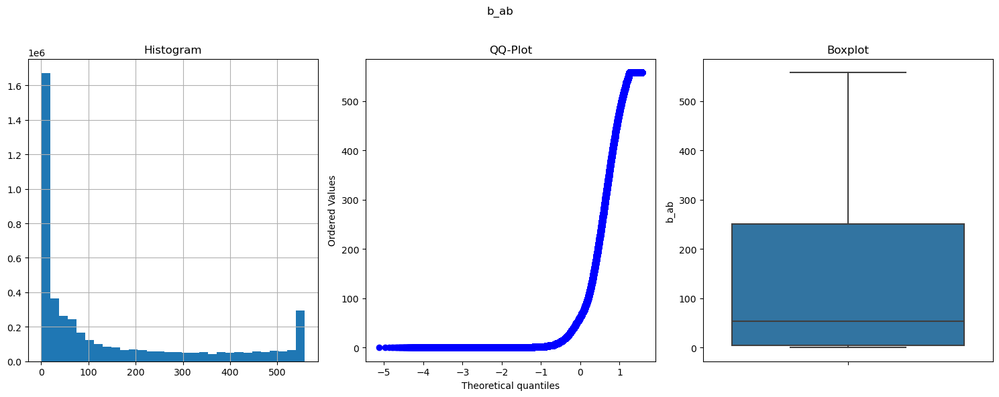

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


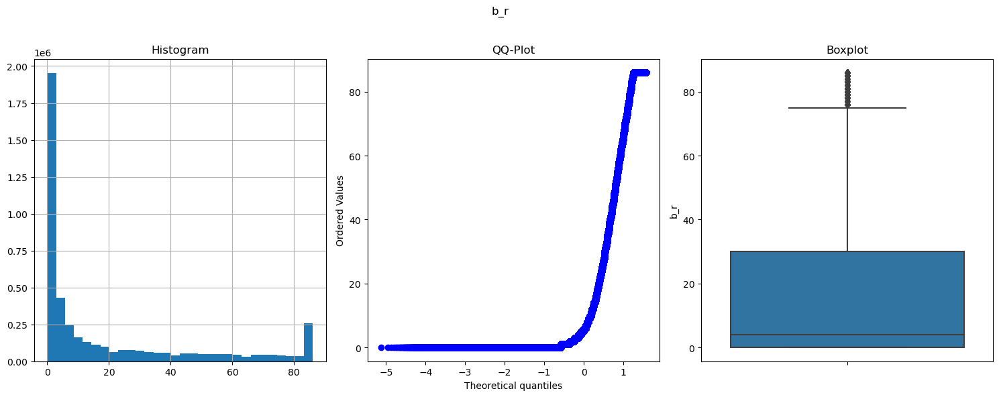

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


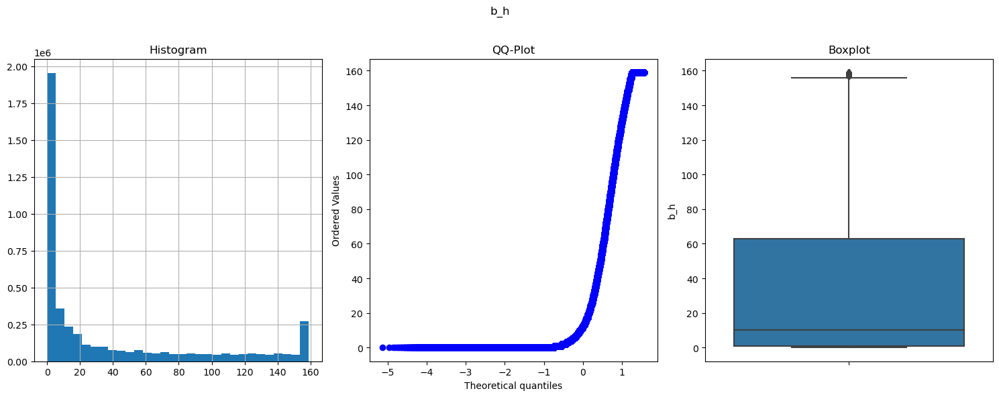

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


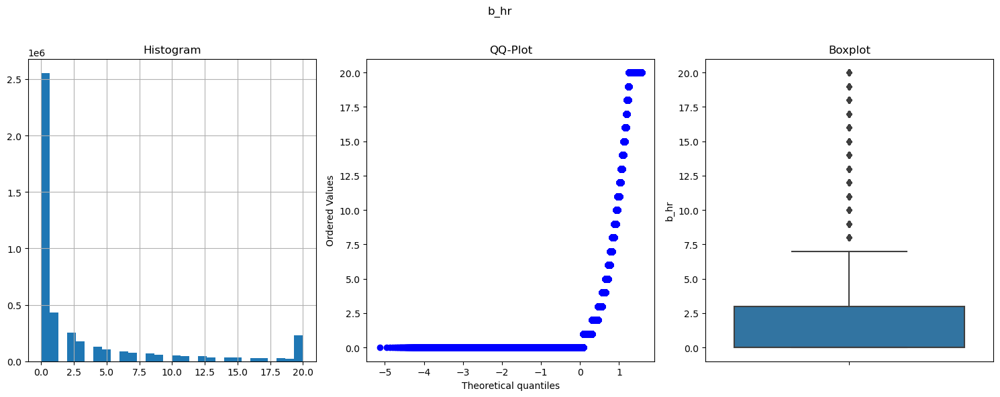

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


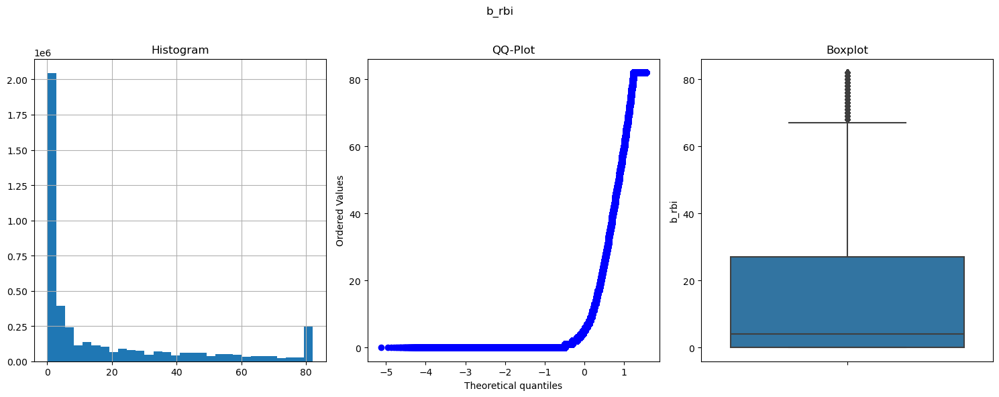

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


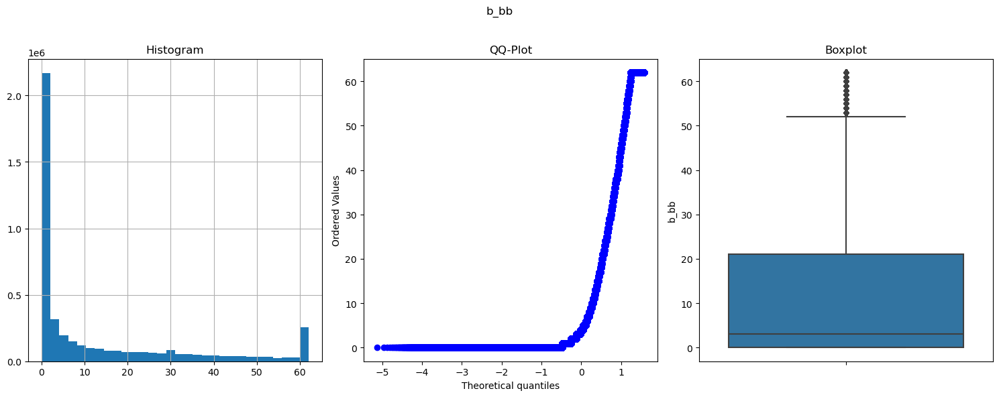

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


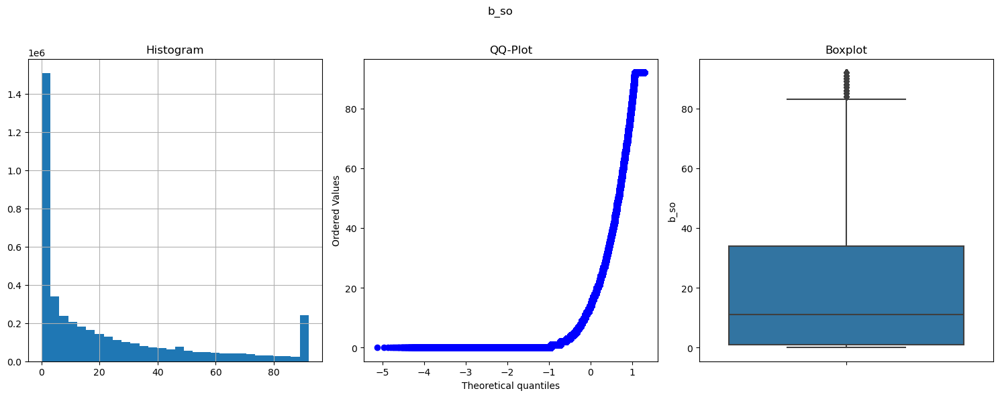

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


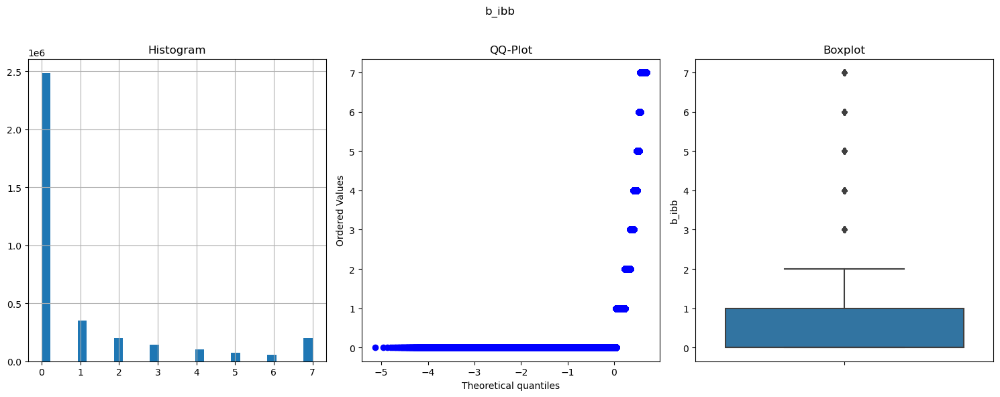

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


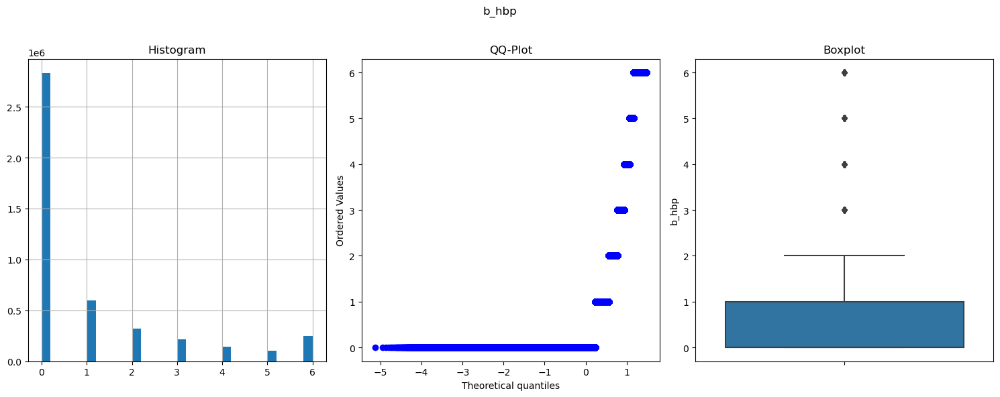

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


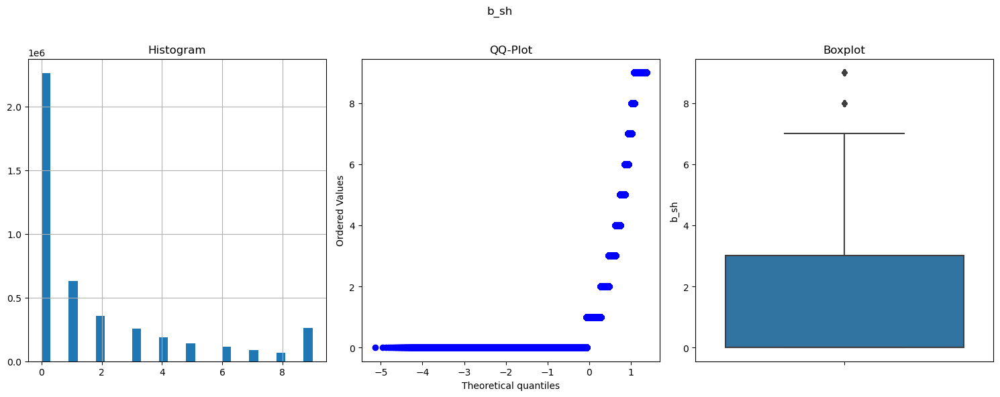

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


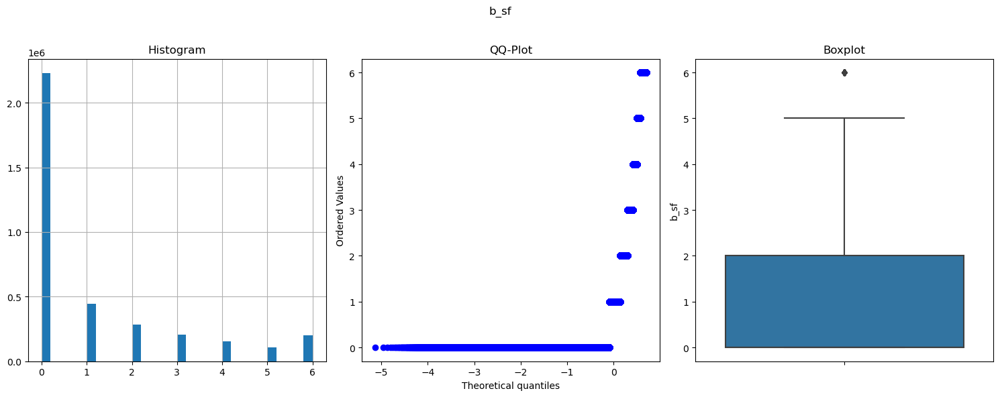

C:\Users\leong\AppData\Local\Temp\ipykernel_21132\3628018513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))


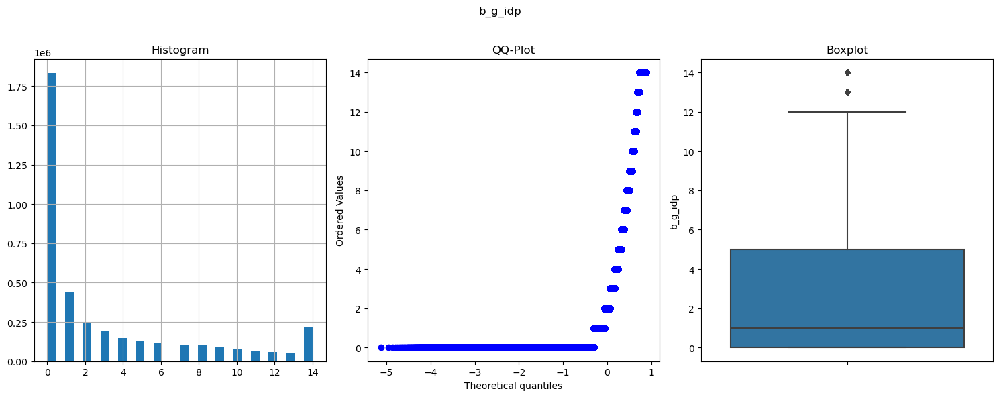

In [38]:
for cols in num_cols_WO:
    subset_data[cols] = winsorise(subset_data, cols, subset_data[cols].quantile(0.95), subset_data[cols].quantile(0.05))
    diagnostic_plots(subset_data, cols)

### Transformation of Numerical Columns

Log ‘ppf’

box cox 'g', ‘l’, ‘hra’, ‘bba’

power ‘r’, ‘triple’, ‘sb’, ‘soa’, ‘bpf’, ‘b_ab’, ‘f_gs’, ‘f_po’, ‘f_a’, ‘b_h’, ‘b_rbi’, ‘b_so’, ‘b_ibb’, ‘b_sf’
 
yj ‘double’, ‘era’, ‘sho’, ‘sv’, ipouts’, ‘ha’, ‘b_g’

no need ‘w’, ‘cs’, ‘ra’, ‘er’, ‘dp’, ‘f_dp’, ‘b_r’, ‘b_hr’, ‘b_bb’, ‘b_hbp’, ‘b_sh’, ‘b_g_idp’

In [39]:
data_copy = subset_data.copy()

### Logarithm Transformation  <a id="step3.2"></a>

[back to top](#top)

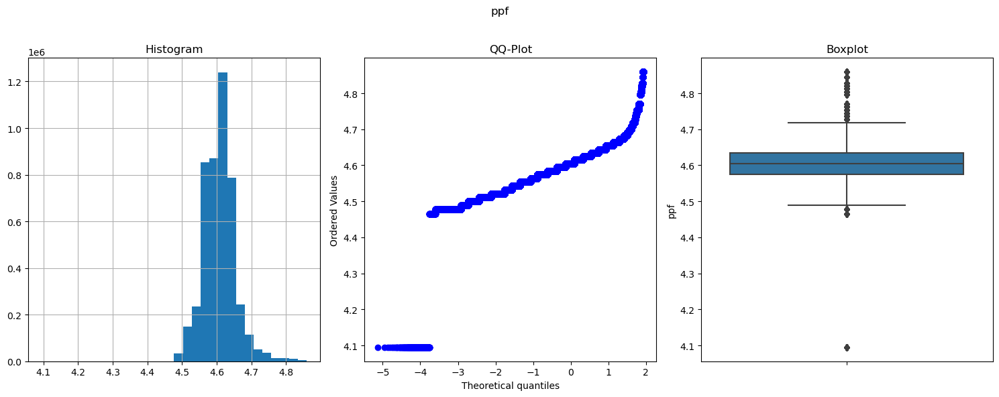

In [40]:
# apply the logarithm transformation
data_copy[['ppf']]=np.log(data[['ppf']])

diagnostic_plots(data_copy, 'ppf')

### Box-Cox Transformation  <a id="step3.3"></a>

[back to top](#top)

Optimal λ:  32.24381663053299


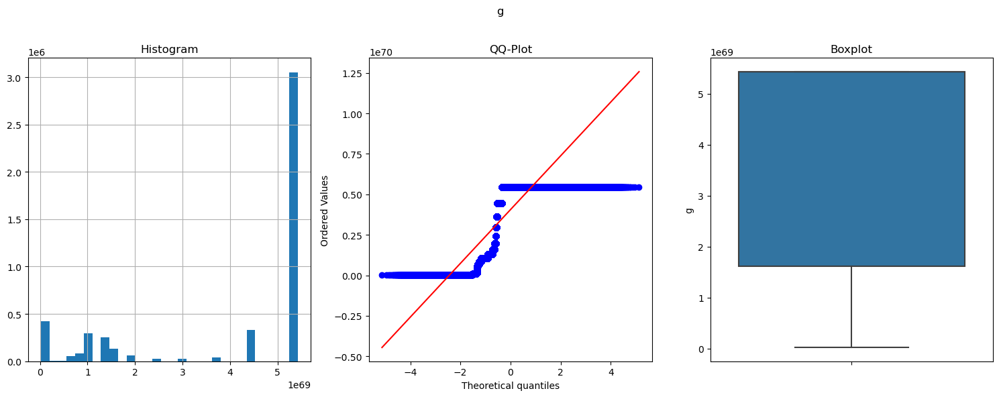

In [41]:
box_cox = ['g', 'l', 'hra', 'bba']

# apply the Box-Cox transformation
data_copy['g'], param = stats.boxcox(subset_data['g']) 

# print the optimal lambda 
print('Optimal λ: ', param)

diagnostic_plots(data_copy, 'g')

Optimal λ:  1.167866442399435


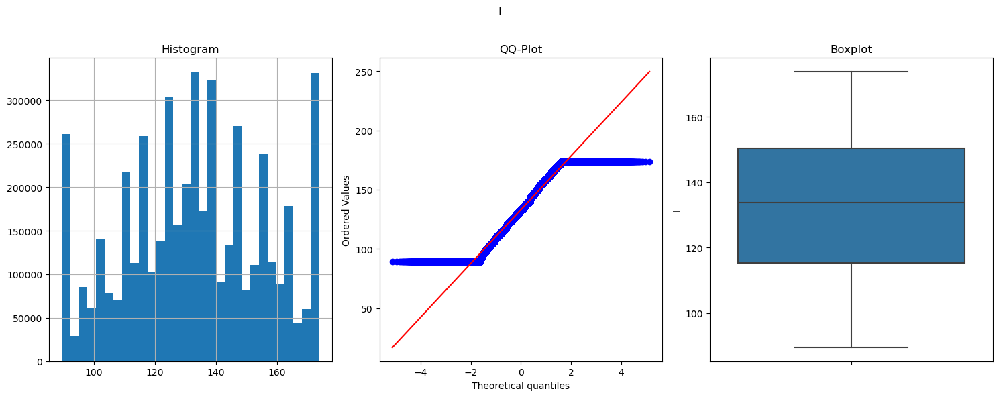

In [42]:
# apply the Box-Cox transformation
data_copy['l'], param = stats.boxcox(subset_data['l']) 

# print the optimal lambda 
print('Optimal λ: ', param)

diagnostic_plots(data_copy, 'l')

Optimal λ:  1.4435452315577841


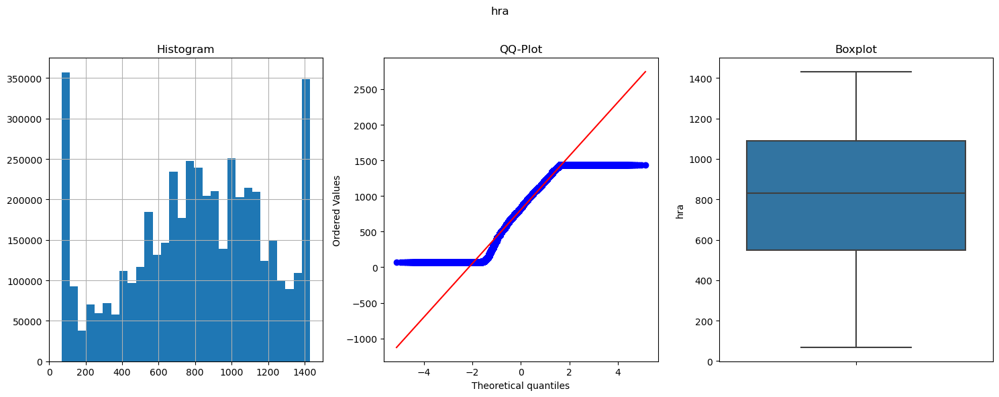

In [43]:
# apply the Box-Cox transformation
data_copy['hra'], param = stats.boxcox(subset_data['hra']) 

# print the optimal lambda 
print('Optimal λ: ', param)

diagnostic_plots(data_copy, 'hra')

Optimal λ:  1.5386074398231169


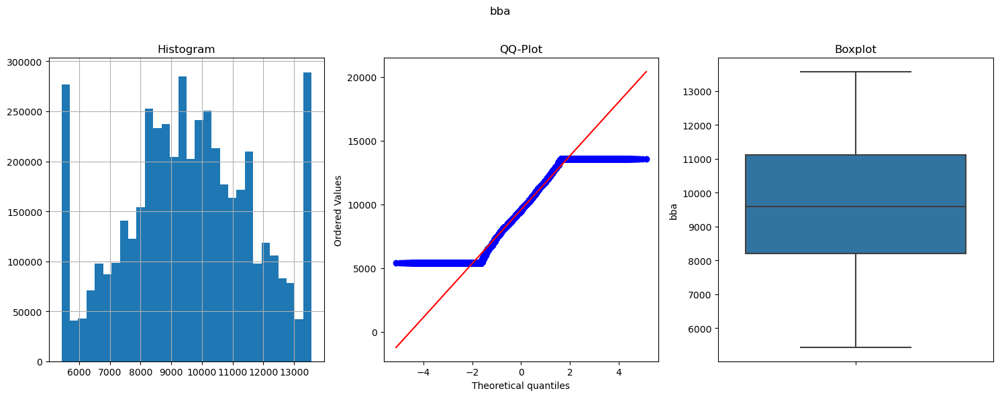

In [44]:
# apply the Box-Cox transformation
data_copy['bba'], param = stats.boxcox(subset_data['bba']) 

# print the optimal lambda 
print('Optimal λ: ', param)

diagnostic_plots(data_copy, 'bba')

### Yeo-Johnson Transformation  <a id="step3.4"></a>

[back to top](#top)

Optimal λ for double: 1.4533185121002108


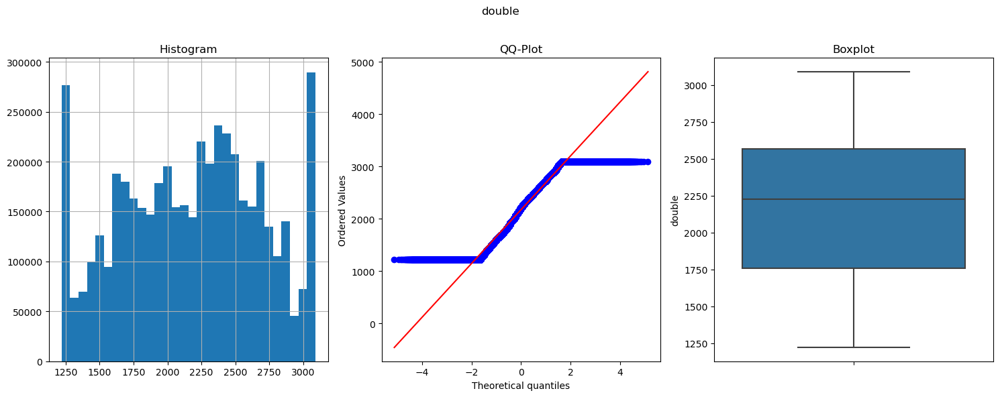

Optimal λ for era: 0.6079019519361608


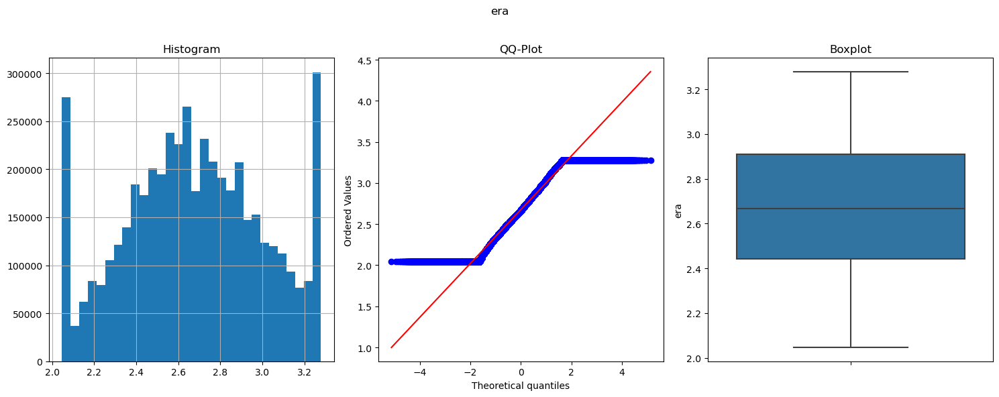

Optimal λ for sho: 0.5231285321503235


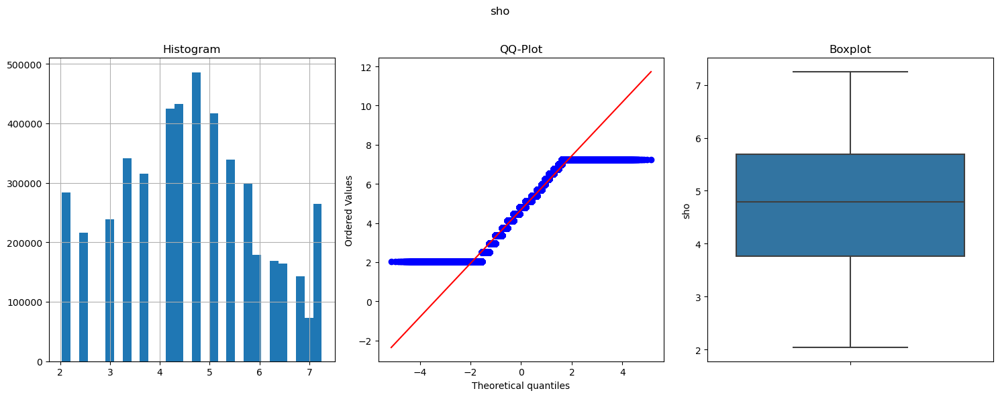

Optimal λ for sv: 1.442641788926757


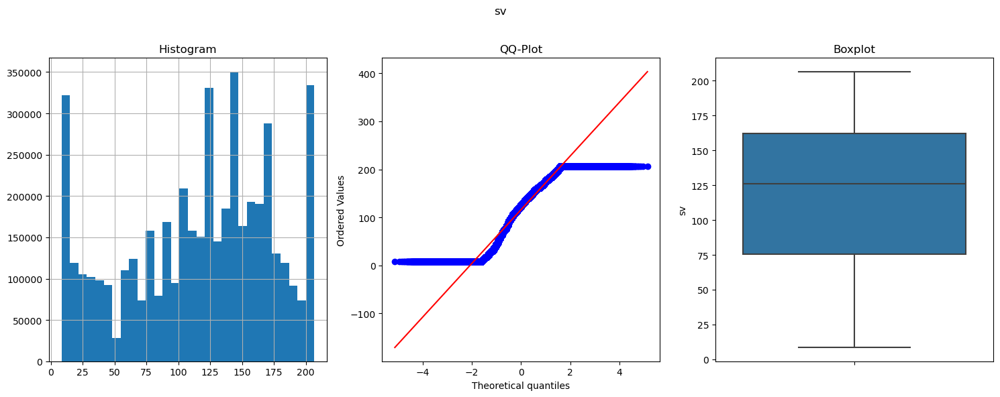

Optimal λ for ipouts: 21.939494553326323


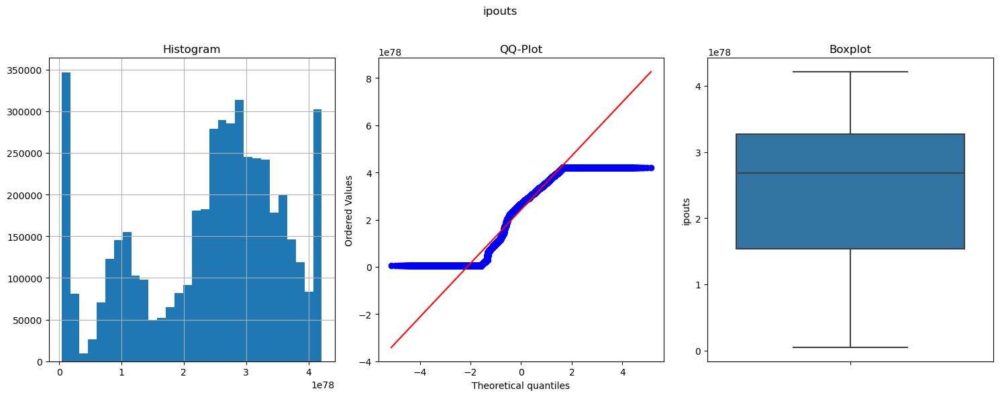

Optimal λ for ha: 2.9504523872677284


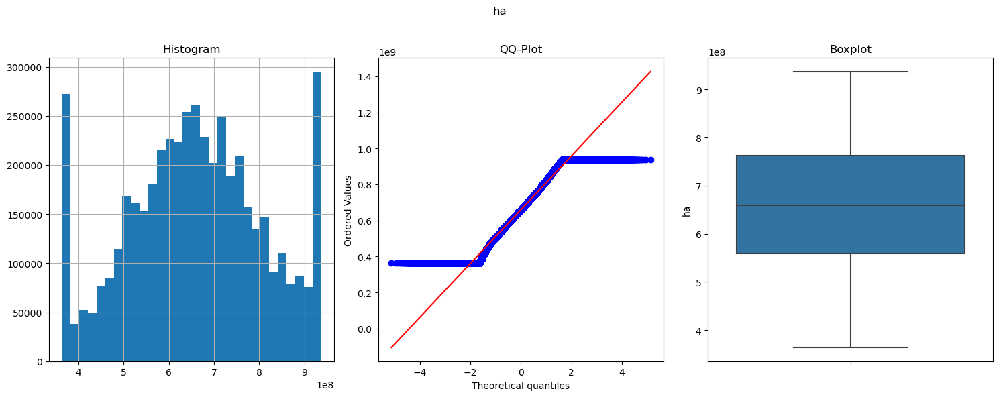

Optimal λ for b_g: 0.20201246644527496


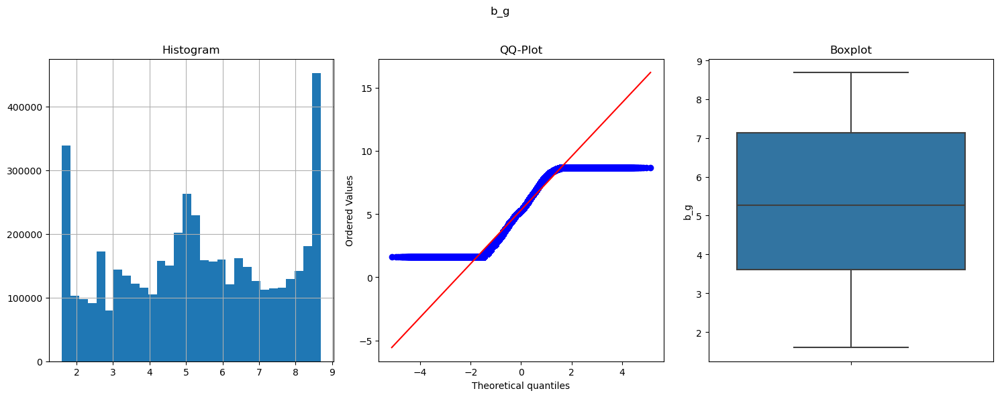

In [45]:
# Apply Yeo-Johnson transformation to each column separately
columns_yj = ['double', 'era', 'sho', 'sv', 'ipouts', 'ha', 'b_g']

for column in columns_yj:
    data_copy[column], param = stats.yeojohnson(subset_data[column])
    print(f'Optimal λ for {column}: {param}')
    diagnostic_plots(data_copy, column)

### Power Transformation  <a id="step3.5"></a>

[back to top](#top)

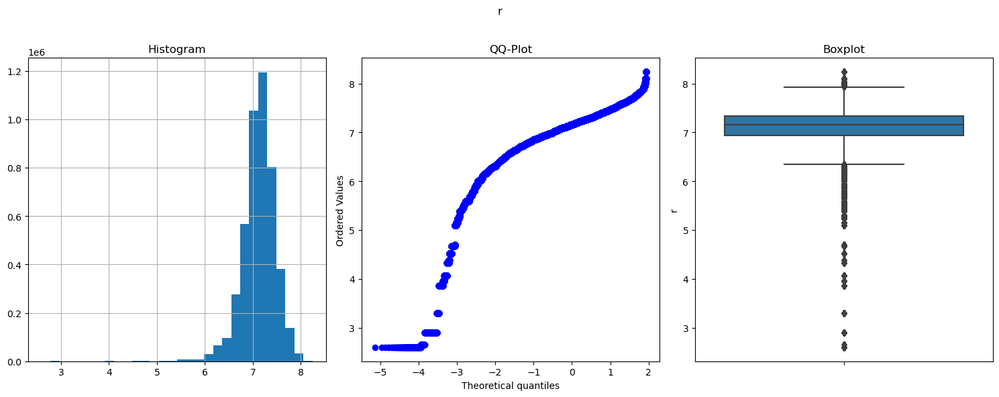

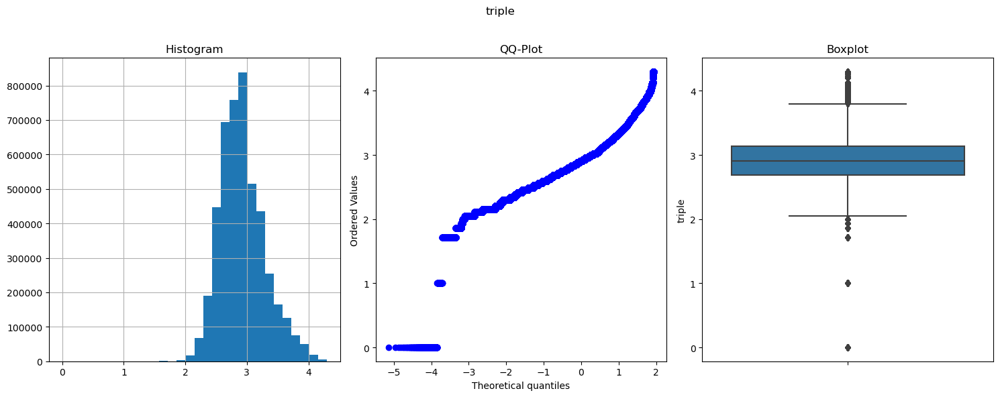

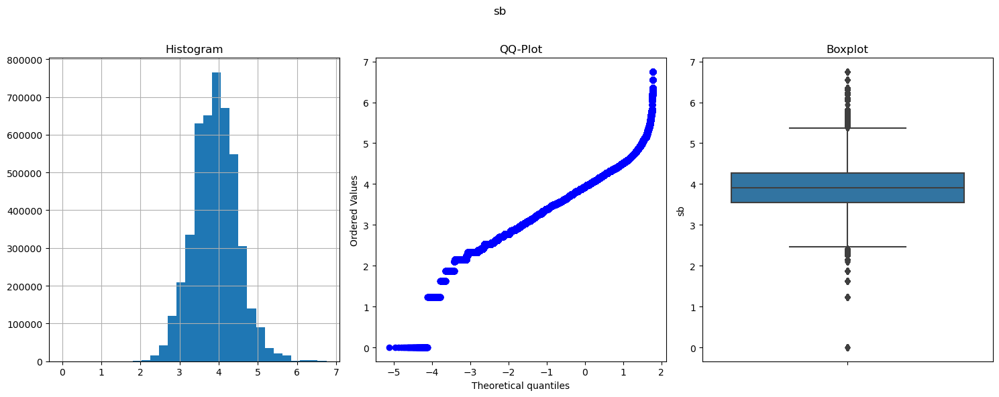

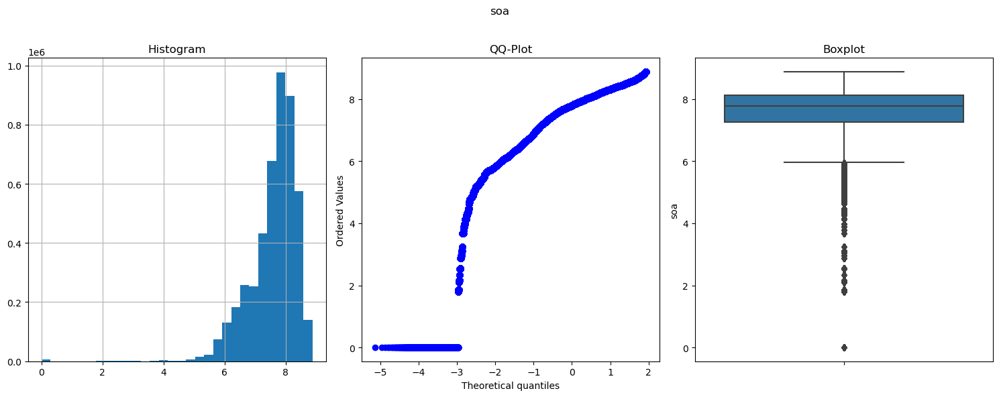

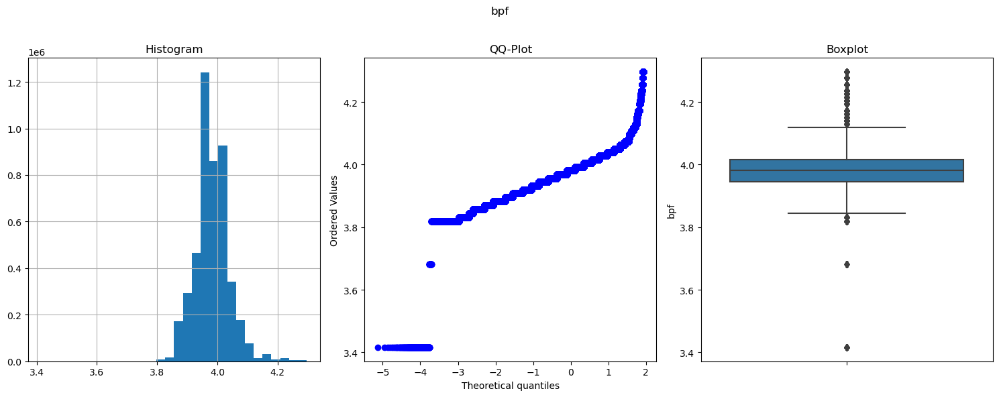

...

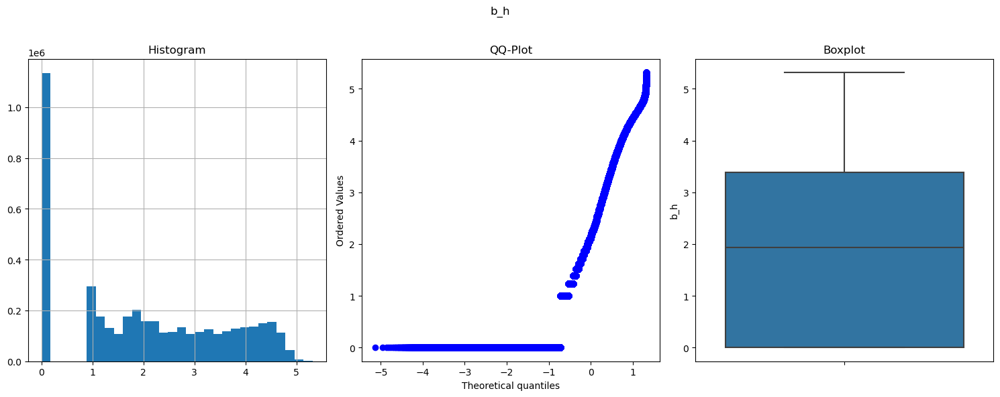

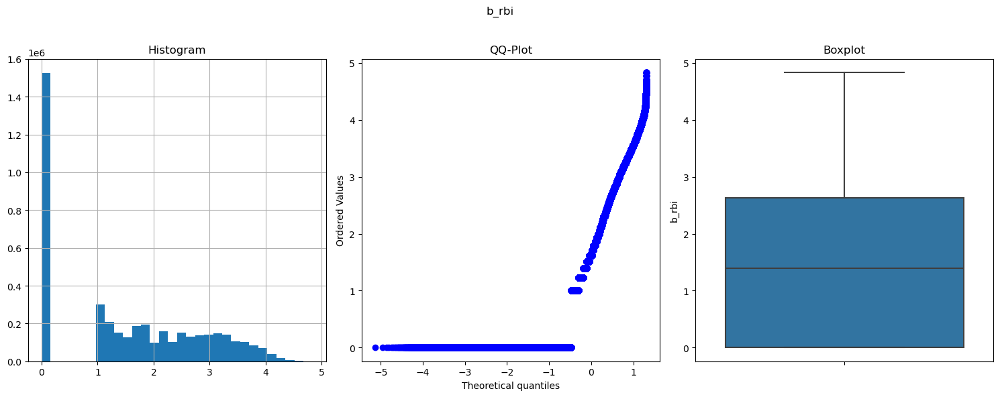

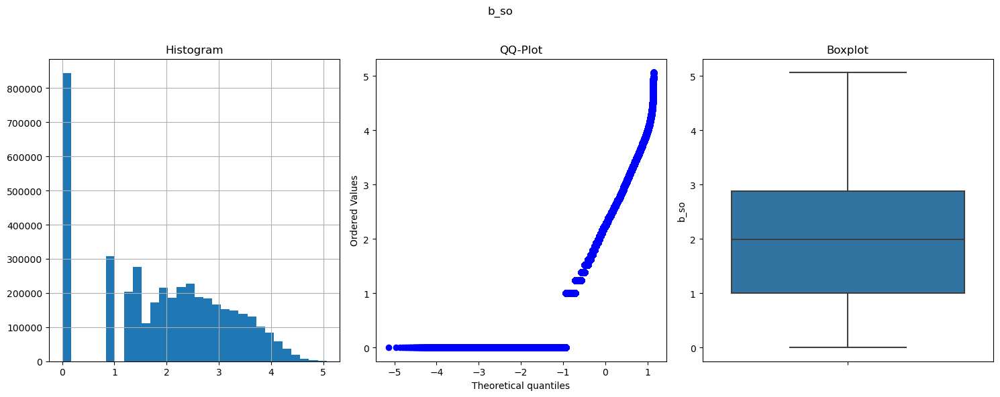

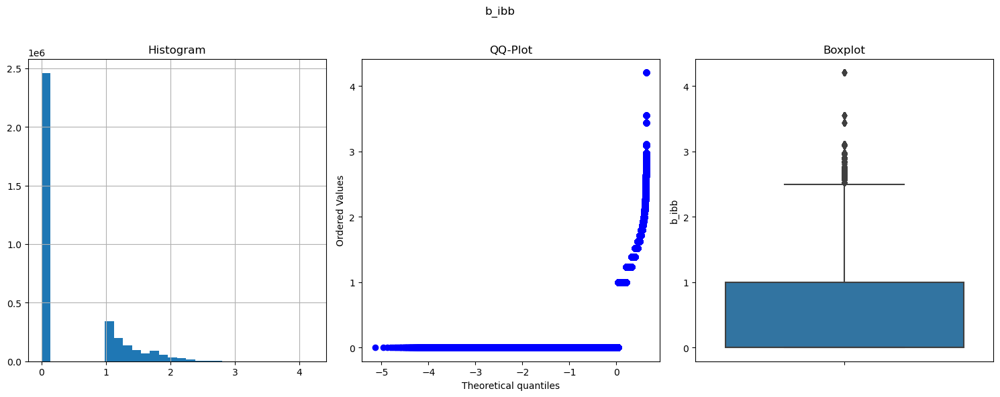

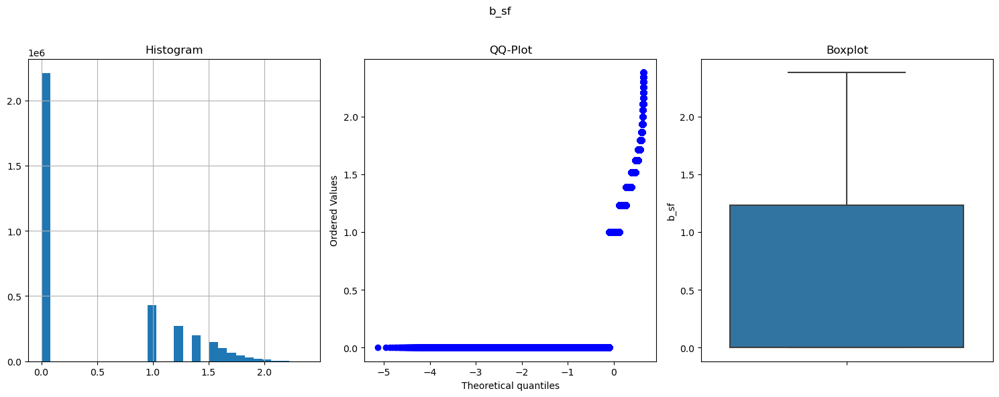

In [46]:
power = ['r', 'triple', 'sb', 'soa', 'bpf', 'b_ab', 'f_gs', 'f_po', 'f_a', 'b_h', 'b_rbi', 'b_so', 'b_ibb', 'b_sf']

data_copy[['r', 'triple', 'sb', 'soa', 'bpf', 'b_ab', 'f_gs', 'f_po', 'f_a', 'b_h', 'b_rbi', 'b_so', 'b_ibb', 'b_sf']] = np.power(data[['r', 'triple', 'sb', 'soa', 'bpf', 'b_ab', 'f_gs', 'f_po', 'f_a', 'b_h', 'b_rbi', 'b_so', 'b_ibb', 'b_sf']], 0.3)

for cols in power:
    diagnostic_plots(data_copy, cols)

### Step 4: Machine Learning Modelling  <a id="step4"></a>

[back to top](#top)

### Train & Test Split <a id="step4.1"></a>

[back to top](#top)

In [47]:
data_copy.head()

,year,league_id,team_id,rank,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,games,openings,game_span
0,1970,NaN,BS1,3,1.927484e+67,62.0,89.469442,NaN,NaN,N,NaN,6.038698,1219.913901,2.95434,3.622404,NaN,518.0,399.0,2.487117,2.036144,8.499356,4.498774e+76,3.635420e+08,67.379018,5429.196594,2.561642,225.0,NaN,4.016531,4.584967,2B,16.0,NaN,3.068844,3.432408,10.0,5.019483,4.557954,66.0,3.465789,0.0,2.880339,13.0,1.000000,NaN,NaN,NaN,NaN,NaN,16,16,144.0
1,1970,NaN,BS1,3,1.927484e+67,62.0,89.469442,NaN,NaN,N,NaN,6.038698,1219.913901,2.95434,3.622404,NaN,518.0,399.0,2.487117,2.036144,8.499356,4.498774e+76,3.635420e+08,67.379018,5429.196594,2.561642,225.0,NaN,4.016531,4.584967,2B,16.0,NaN,3.068844,3.432408,10.0,5.019483,3.804955,66.0,2.158654,0.0,2.053136,13.0,0.000000,NaN,NaN,NaN,NaN,NaN,1,1,0.0
2,1970,NaN,BS1,3,1.927484e+67,62.0,89.469442,NaN,NaN,N,NaN,6.038698,1219.913901,2.95434,3.622404,NaN,518.0,399.0,2.487117,2.036144,8.499356,4.498774e+76,3.635420e+08,67.379018,5429.196594,2.561642,225.0,NaN,4.016531,4.584967,2B,16.0,NaN,3.068844,3.432408,10.0,4.022983,4.513912,13.0,3.153751,0.0,2.594558,0.0,1.515717,NaN,NaN,NaN,NaN,NaN,16,16,144.0
3,1970,NaN,BS1,3,1.927484e+67,62.0,89.469442,NaN,NaN,N,NaN,6.038698,1219.913901,2.95434,3.622404,NaN,518.0,399.0,2.487117,2.036144,8.499356,4.498774e+76,3.635420e+08,67.379018,5429.196594,2.561642,225.0,NaN,4.016531,4.584967,2B,16.0,NaN,3.068844,3.432408,10.0,4.022983,3.680842,13.0,2.456456,0.0,2.297397,0.0,1.231144,NaN,NaN,NaN,NaN,NaN,1,1,0.0
4,1970,NaN,BS1,3,1.927484e+67,62.0,89.469442,NaN,NaN,N,NaN,6.038698,1219.913901,2.95434,3.622404,NaN,518.0,399.0,2.487117,2.036144,8.499356,4.498774e+76,3.635420e+08,67.379018,5429.196594,2.561642,225.0,NaN,4.016531,4.584967,2B,16.0,NaN,3.068844,3.432408,10.0,4.890346,4.504982,51.0,3.090584,0.0,2.828427,4.0,1.000000,NaN,NaN,NaN,NaN,NaN,16,16,144.0


In [48]:
X_train, X_test, y_train, y_test = train_test_split(
    data_copy.drop('rank', axis=1), data_copy['rank'], test_size=0.3, random_state=0)

X_train.shape,X_test.shape

((3350326, 51), (1435854, 51))

In [49]:
X_train.head()

,year,league_id,team_id,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,games,openings,game_span
2071762,1970,NL,LAN,1.060646e+69,89.0,111.306189,NaN,NaN,N,N,6.707083,1453.242933,2.801615,2.930156,45.0,697.0,619.0,2.752189,4.789952,121.213791,1.005584e+78,5.796442e+08,1119.161160,10516.183392,7.188789,136.0,162.0,3.944859,4.605170,CF,3.0,1.620657,1.866066,1.000000,0.0,3.716816,2.207183,3.0,1.231144,1.0,0.000000,3.0,1.711770,0.00000,0.0,1.0,0.000000,2.0,77,75,162.0
3673688,1970,AL,CHA,5.429384e+69,72.0,163.165347,N,NaN,N,N,6.951162,1497.013305,2.626528,4.952119,54.0,699.0,630.0,2.693596,4.122115,136.135711,2.721924e+78,5.988964e+08,894.454884,11026.083653,7.782230,117.0,142.0,4.028191,4.644391,OF,129.0,0.000000,1.390389,2.380026,1.0,3.716816,4.375384,2.0,2.774191,1.0,2.207183,3.0,2.527707,1.00000,0.0,0.0,1.231144,2.0,81,79,177.0
5072460,1970,NL,HOU,5.429384e+69,72.0,163.165347,N,N,N,N,6.728223,2607.193032,2.954340,3.498437,52.0,882.0,804.0,3.278435,2.036144,97.559007,2.548041e+78,9.367968e+08,1431.197364,12164.718649,7.412183,133.0,149.0,3.882722,4.553877,3B,58.0,NaN,1.515717,2.053136,8.0,7.016283,0.000000,28.0,0.000000,11.0,0.000000,10.0,0.000000,0.00000,5.0,1.0,0.000000,4.0,81,81,177.0
3515939,1970,AL,BAL,5.429384e+69,85.0,135.846104,N,NaN,N,N,6.993158,1920.438638,2.828427,4.609526,36.0,667.0,593.0,2.574850,5.691054,106.832745,2.600381e+78,6.413705e+08,840.745781,9579.561415,8.304957,123.0,166.0,3.944859,4.564348,OF,124.0,0.000000,1.231144,1.711770,1.0,5.371667,6.724710,NaN,4.513912,NaN,3.992973,NaN,3.607445,1.71177,NaN,NaN,1.792790,NaN,81,76,177.0
2501110,1970,NL,LAN,5.429384e+69,85.0,135.846104,N,NaN,N,N,6.947907,1366.928539,2.880339,3.514497,51.0,561.0,499.0,2.222121,7.250576,102.163803,3.415512e+78,5.521546e+08,711.052201,7062.900434,7.741994,109.0,130.0,4.051275,4.663439,C,50.0,1.792790,1.620657,2.053136,5.0,8.092599,6.280220,51.0,4.346417,19.0,3.432408,21.0,3.764640,1.71177,1.0,3.0,0.000000,14.0,81,78,170.0


In [50]:
X_test.head()

,year,league_id,team_id,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,games,openings,game_span
3563221,1970,AL,OAK,5.429384e+69,77.0,152.573791,N,NaN,N,N,7.347106,2199.656801,3.090584,4.016531,64.0,796.0,712.0,2.981711,3.378799,167.510297,2.266059e+78,8.854417e+08,1004.877663,11977.423610,8.081068,146.0,159.0,4.004793,4.634729,C,32.0,3.001369,3.666436,0.0,1.0,8.689433,NaN,62.0,NaN,4.0,NaN,42.0,NaN,NaN,0.0,7.0,NaN,5.0,81,79,180.0
5072714,1970,NL,HOU,5.429384e+69,72.0,163.165347,N,N,N,N,6.728223,2607.193032,2.954340,3.498437,52.0,882.0,804.0,3.278435,2.036144,97.559007,2.548041e+78,9.367968e+08,1431.197364,12164.718649,7.412183,133.0,149.0,3.882722,4.553877,C,14.0,NaN,0.000000,0.0,1.0,1.599873,1.792790,0.0,1.231144,0.0,1.000000,0.0,1.515717,0.0,0.0,0.0,0.0,0.0,81,81,177.0
3070756,1970,NL,SFN,5.429384e+69,75.0,156.798201,N,NaN,N,N,7.511444,1837.836997,3.290658,3.651896,59.0,711.0,608.0,2.596599,4.789952,111.564743,3.519841e+78,7.993275e+08,644.671347,10073.335782,7.260148,178.0,136.0,4.004793,4.624973,RF,20.0,1.995262,2.801615,0.0,0.0,4.292704,0.000000,1.0,0.000000,0.0,0.000000,1.0,0.000000,0.0,0.0,1.0,0.0,0.0,81,74,170.0
4749704,1970,AL,OAK,5.429384e+69,65.0,173.856187,N,N,N,N,7.277734,2413.474731,2.880339,4.074057,36.0,882.0,804.0,3.278435,2.036144,136.135711,2.848877e+78,9.367968e+08,1420.769684,13568.931558,7.885604,121.0,170.0,3.969086,4.615121,3B,1.0,0.000000,0.000000,1.0,0.0,7.748499,0.000000,48.0,0.000000,20.0,0.000000,58.0,0.000000,0.0,4.0,0.0,0.0,9.0,81,79,175.0
5636789,1970,AL,MIN,5.429384e+69,83.0,140.001836,N,N,N,N,7.260148,2349.946726,2.297397,3.271907,44.0,662.0,604.0,2.574850,4.122115,167.510297,3.813130e+78,7.336786e+08,1138.572463,5429.196594,8.028010,102.0,171.0,3.907854,4.543295,P,69.0,NaN,2.158654,1.0,0.0,5.960067,2.657615,0.0,1.711770,0.0,1.231144,0.0,1.866066,0.0,0.0,0.0,0.0,0.0,81,81,177.0


### Missing Imputation <a id="step4.2"></a>

[back to top](#top)

In [51]:
num_cols = [c for c in X_train.columns if X_train[c].dtypes!='O']

missing = X_train[num_cols].isnull().mean().sort_values()

if missing.any():
    print(missing[missing > 0])

triple     0.026871
soa        0.026871
bpf        0.026871
ppf        0.026871
r          0.026871
dp         0.030478
sb         0.037444
b_bb       0.057464
b_r        0.057464
b_hr       0.057464
b_hbp      0.070180
b_sh       0.086798
f_dp       0.090718
b_h        0.093965
b_ab       0.093965
b_rbi      0.096360
cs         0.121991
b_so       0.126631
f_po       0.137957
f_a        0.137960
b_g_idp    0.188064
b_sf       0.260051
b_ibb      0.263604
f_gs       0.561206
dtype: float64


In [52]:
X_train[num_cols].dtypes

year           int32
g            float64
w            float64
l            float64
r            float64
double       float64
triple       float64
sb           float64
cs           float64
ra           float64
er           float64
era          float64
sho          float64
sv           float64
ipouts       float64
ha           float64
hra          float64
bba          float64
soa          float64
e            float64
dp           float64
bpf          float64
ppf          float64
f_g          float64
f_gs         float64
f_po         float64
f_a          float64
f_dp         float64
b_g          float64
b_ab         float64
b_r          float64
b_h          float64
b_hr         float64
b_rbi        float64
b_bb         float64
b_so         float64
b_ibb        float64
b_hbp        float64
b_sh         float64
b_sf         float64
b_g_idp      float64
games          int64
openings       int64
game_span    float64
dtype: object

In [53]:
cat_cols = [c for c in X_train.columns if X_train[c].dtypes=='O']

missing = X_train[cat_cols].isnull().mean().sort_values()

if missing.any():
    print(missing[missing > 0])

league_id    0.003204
lg_win       0.013600
ws_win       0.047054
div_win      0.279121
wc_win       0.571025
dtype: float64


array([[<Axes: title={'center': 'year'}>, <Axes: title={'center': 'g'}>,
        <Axes: title={'center': 'w'}>, <Axes: title={'center': 'l'}>,
        <Axes: title={'center': 'r'}>,
        <Axes: title={'center': 'double'}>,
        <Axes: title={'center': 'triple'}>],
       [<Axes: title={'center': 'sb'}>, <Axes: title={'center': 'cs'}>,
        <Axes: title={'center': 'ra'}>, <Axes: title={'center': 'er'}>,
        <Axes: title={'center': 'era'}>, <Axes: title={'center': 'sho'}>,
        <Axes: title={'center': 'sv'}>],
       [<Axes: title={'center': 'ipouts'}>,
        <Axes: title={'center': 'ha'}>, <Axes: title={'center': 'hra'}>,
        <Axes: title={'center': 'bba'}>, <Axes: title={'center': 'soa'}>,
        <Axes: title={'center': 'e'}>, <Axes: title={'center': 'dp'}>],
       [<Axes: title={'center': 'bpf'}>, <Axes: title={'center': 'ppf'}>,
        <Axes: title={'center': 'f_g'}>,
        <Axes: title={'center': 'f_gs'}>,
        <Axes: title={'center': 'f_po'}>,
        

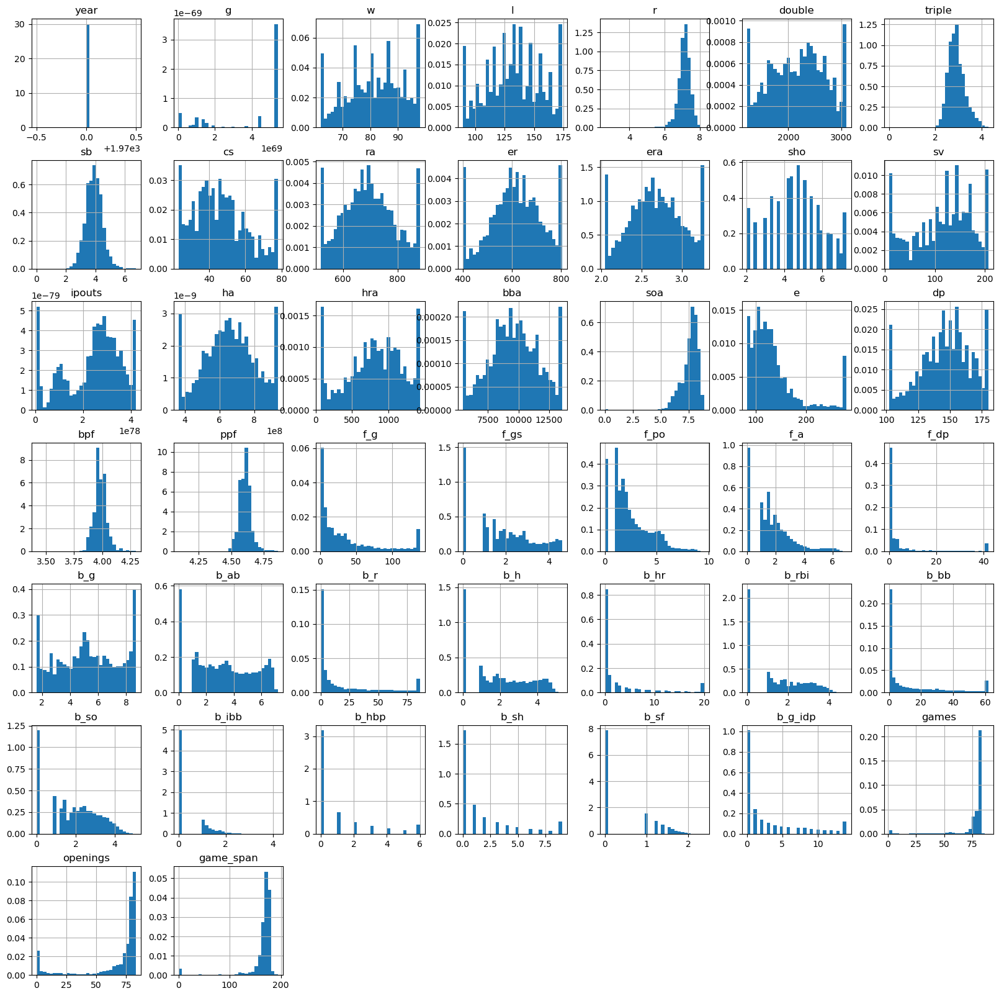

In [54]:
data_copy[num_cols].hist(bins=30, figsize=(20,20), density=True)

In [55]:
num_arbitrary= ['r','triple','dp','b_bb','b_sh','f_dp','b_ab','b_h','b_rbi','b_so']
num_median=['ppf','soa','bpf','sb','b_r','b_hr','b_hbp','cs','f_po','f_a','b_g_idp','b_sf','b_ibb','f_gs']

cat_missing=['league_id','lg_win','ws_win','div_win','wc_win']

In [56]:
pipe = Pipeline(steps=[
    ('imp_num_arbitrary', mdi.ArbitraryNumberImputer(variables = num_arbitrary)),
    ('imp_num_median', mdi.MeanMedianImputer(imputation_method = 'median', variables=num_median)),
    ('imp_cat_missing', mdi.CategoricalImputer(variables=cat_missing, imputation_method='missing'))
])

In [57]:
pipe.fit(X_train)

Pipeline(steps=[('imp_num_arbitrary',
                 ArbitraryNumberImputer(variables=['r', 'triple', 'dp', 'b_bb',
                                                   'b_sh', 'f_dp', 'b_ab',
                                                   'b_h', 'b_rbi', 'b_so'])),
                ('imp_num_median',
                 MeanMedianImputer(variables=['ppf', 'soa', 'bpf', 'sb', 'b_r',
                                              'b_hr', 'b_hbp', 'cs', 'f_po',
                                              'f_a', 'b_g_idp', 'b_sf', 'b_ibb',
                                              'f_gs'])),
                ('imp_cat_missing',
                 CategoricalImputer(variables=['league_id', 'lg_win', 'ws_win',
                                               'div_win', 'wc_win']))])

In [58]:
X_train = pipe.transform(X_train)
X_test = pipe.transform(X_test)

In [59]:
X_train.isnull().sum()

year         0
league_id    0
team_id      0
g            0
w            0
l            0
div_win      0
wc_win       0
lg_win       0
ws_win       0
r            0
double       0
triple       0
sb           0
cs           0
ra           0
er           0
era          0
sho          0
sv           0
ipouts       0
ha           0
hra          0
bba          0
soa          0
e            0
dp           0
bpf          0
ppf          0
f_pos        0
f_g          0
f_gs         0
f_po         0
f_a          0
f_dp         0
b_g          0
b_ab         0
b_r          0
b_h          0
b_hr         0
b_rbi        0
b_bb         0
b_so         0
b_ibb        0
b_hbp        0
b_sh         0
b_sf         0
b_g_idp      0
games        0
openings     0
game_span    0
dtype: int64

In [60]:
X_test.isnull().sum()

year         0
league_id    0
team_id      0
g            0
w            0
l            0
div_win      0
wc_win       0
lg_win       0
ws_win       0
r            0
double       0
triple       0
sb           0
cs           0
ra           0
er           0
era          0
sho          0
sv           0
ipouts       0
ha           0
hra          0
bba          0
soa          0
e            0
dp           0
bpf          0
ppf          0
f_pos        0
f_g          0
f_gs         0
f_po         0
f_a          0
f_dp         0
b_g          0
b_ab         0
b_r          0
b_h          0
b_hr         0
b_rbi        0
b_bb         0
b_so         0
b_ibb        0
b_hbp        0
b_sh         0
b_sf         0
b_g_idp      0
games        0
openings     0
game_span    0
dtype: int64

### Grouping Rare Categories <a id="step4.3"></a>

[back to top](#top)

In [61]:
rare_encoder = RareLabelEncoder(tol=0.05, n_categories=5)  

In [62]:
rare_encoder.fit(X_train)

C:\Users\leong\anaconda3\Lib\site-packages\feature_engine\encoding\rare_label.py:216: UserWarning: The number of unique categories for variable div_win is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
C:\Users\leong\anaconda3\Lib\site-packages\feature_engine\encoding\rare_label.py:216: UserWarning: The number of unique categories for variable wc_win is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
C:\Users\leong\anaconda3\Lib\site-packages\feature_engine\encoding\rare_label.py:216: UserWarning: The number of unique categories for variable lg_win is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
C:\Users\leong\anaconda3\Lib\site-packages\feature_engine\encoding\rare_label.py:216: UserWarning: The number of unique categories for variable ws_win is less than that indicated in n_categories. Thus, all categor

RareLabelEncoder(n_categories=5)

In [63]:
rare_encoder.variables

In [64]:
rare_encoder.encoder_dict_

{'league_id': ['NL', 'AL'],
 'team_id': [],
 'div_win': ['Missing', 'N', 'Y'],
 'wc_win': ['Missing', 'N', 'Y'],
 'lg_win': ['N', 'Y', 'Missing'],
 'ws_win': ['N', 'Missing', 'Y'],
 'f_pos': ['P', 'OF', '1B', 'LF', '3B', '2B', 'RF', 'SS', 'C', 'CF']}

In [65]:
X_train_enc = rare_encoder.transform(X_train)
X_test_enc = rare_encoder.transform(X_test)

In [66]:
X_train_enc.head()

,year,league_id,team_id,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,games,openings,game_span
2071762,1970,NL,Rare,1.060646e+69,89.0,111.306189,Missing,Missing,N,N,6.707083,1453.242933,2.801615,2.930156,45.0,697.0,619.0,2.752189,4.789952,121.213791,1.005584e+78,5.796442e+08,1119.161160,10516.183392,7.188789,136.0,162.0,3.944859,4.605170,CF,3.0,1.620657,1.866066,1.000000,0.0,3.716816,2.207183,3.0,1.231144,1.0,0.000000,3.0,1.711770,0.00000,0.0,1.0,0.000000,2.0,77,75,162.0
3673688,1970,AL,Rare,5.429384e+69,72.0,163.165347,N,Missing,N,N,6.951162,1497.013305,2.626528,4.952119,54.0,699.0,630.0,2.693596,4.122115,136.135711,2.721924e+78,5.988964e+08,894.454884,11026.083653,7.782230,117.0,142.0,4.028191,4.644391,OF,129.0,0.000000,1.390389,2.380026,1.0,3.716816,4.375384,2.0,2.774191,1.0,2.207183,3.0,2.527707,1.00000,0.0,0.0,1.231144,2.0,81,79,177.0
5072460,1970,NL,Rare,5.429384e+69,72.0,163.165347,N,N,N,N,6.728223,2607.193032,2.954340,3.498437,52.0,882.0,804.0,3.278435,2.036144,97.559007,2.548041e+78,9.367968e+08,1431.197364,12164.718649,7.412183,133.0,149.0,3.882722,4.553877,3B,58.0,1.792790,1.515717,2.053136,8.0,7.016283,0.000000,28.0,0.000000,11.0,0.000000,10.0,0.000000,0.00000,5.0,1.0,0.000000,4.0,81,81,177.0
3515939,1970,AL,Rare,5.429384e+69,85.0,135.846104,N,Missing,N,N,6.993158,1920.438638,2.828427,4.609526,36.0,667.0,593.0,2.574850,5.691054,106.832745,2.600381e+78,6.413705e+08,840.745781,9579.561415,8.304957,123.0,166.0,3.944859,4.564348,OF,124.0,0.000000,1.231144,1.711770,1.0,5.371667,6.724710,4.0,4.513912,0.0,3.992973,999.0,3.607445,1.71177,0.0,999.0,1.792790,1.0,81,76,177.0
2501110,1970,NL,Rare,5.429384e+69,85.0,135.846104,N,Missing,N,N,6.947907,1366.928539,2.880339,3.514497,51.0,561.0,499.0,2.222121,7.250576,102.163803,3.415512e+78,5.521546e+08,711.052201,7062.900434,7.741994,109.0,130.0,4.051275,4.663439,C,50.0,1.792790,1.620657,2.053136,5.0,8.092599,6.280220,51.0,4.346417,19.0,3.432408,21.0,3.764640,1.71177,1.0,3.0,0.000000,14.0,81,78,170.0


In [67]:
X_test_enc.head()

,year,league_id,team_id,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,games,openings,game_span
3563221,1970,AL,Rare,5.429384e+69,77.0,152.573791,N,Missing,N,N,7.347106,2199.656801,3.090584,4.016531,64.0,796.0,712.0,2.981711,3.378799,167.510297,2.266059e+78,8.854417e+08,1004.877663,11977.423610,8.081068,146.0,159.0,4.004793,4.634729,C,32.0,3.001369,3.666436,0.0,1.0,8.689433,999.000000,62.0,999.000000,4.0,999.000000,42.0,999.000000,0.0,0.0,7.0,0.0,5.0,81,79,180.0
5072714,1970,NL,Rare,5.429384e+69,72.0,163.165347,N,N,N,N,6.728223,2607.193032,2.954340,3.498437,52.0,882.0,804.0,3.278435,2.036144,97.559007,2.548041e+78,9.367968e+08,1431.197364,12164.718649,7.412183,133.0,149.0,3.882722,4.553877,C,14.0,1.792790,0.000000,0.0,1.0,1.599873,1.792790,0.0,1.231144,0.0,1.000000,0.0,1.515717,0.0,0.0,0.0,0.0,0.0,81,81,177.0
3070756,1970,NL,Rare,5.429384e+69,75.0,156.798201,N,Missing,N,N,7.511444,1837.836997,3.290658,3.651896,59.0,711.0,608.0,2.596599,4.789952,111.564743,3.519841e+78,7.993275e+08,644.671347,10073.335782,7.260148,178.0,136.0,4.004793,4.624973,RF,20.0,1.995262,2.801615,0.0,0.0,4.292704,0.000000,1.0,0.000000,0.0,0.000000,1.0,0.000000,0.0,0.0,1.0,0.0,0.0,81,74,170.0
4749704,1970,AL,Rare,5.429384e+69,65.0,173.856187,N,N,N,N,7.277734,2413.474731,2.880339,4.074057,36.0,882.0,804.0,3.278435,2.036144,136.135711,2.848877e+78,9.367968e+08,1420.769684,13568.931558,7.885604,121.0,170.0,3.969086,4.615121,3B,1.0,0.000000,0.000000,1.0,0.0,7.748499,0.000000,48.0,0.000000,20.0,0.000000,58.0,0.000000,0.0,4.0,0.0,0.0,9.0,81,79,175.0
5636789,1970,AL,Rare,5.429384e+69,83.0,140.001836,N,N,N,N,7.260148,2349.946726,2.297397,3.271907,44.0,662.0,604.0,2.574850,4.122115,167.510297,3.813130e+78,7.336786e+08,1138.572463,5429.196594,8.028010,102.0,171.0,3.907854,4.543295,P,69.0,1.792790,2.158654,1.0,0.0,5.960067,2.657615,0.0,1.711770,0.0,1.231144,0.0,1.866066,0.0,0.0,0.0,0.0,0.0,81,81,177.0


### Target Mean Encoding with Feature-Engine <a id="step4.4"></a>

[back to top](#top)

In [68]:
mean_enc = MeanEncoder(variables=None)

In [69]:
mean_enc.fit(X_train_enc, y_train)

MeanEncoder()

In [70]:
mean_enc.variables

In [71]:
mean_enc.encoder_dict_

{'league_id': {'AL': 3.0214600266330285,
  'NL': 3.086789631899564,
  'Rare': 3.1411332906286247},
 'team_id': {'Rare': 3.056624638915735},
 'div_win': {'Missing': 3.1244277625394994,
  'N': 3.5067622721480842,
  'Y': 1.0446765030011875},
 'wc_win': {'Missing': 3.076823762661915,
  'N': 3.1125193716393924,
  'Y': 2.0297415362213322},
 'lg_win': {'Missing': 2.9113812930693936,
  'N': 3.2838198758078514,
  'Y': 1.1124535722726172},
 'ws_win': {'Missing': 3.204095225408666,
  'N': 3.1500339452258124,
  'Y': 1.1012007189017627},
 'f_pos': {'1B': 3.0361838733070847,
  '2B': 3.082732141137457,
  '3B': 3.059749405769888,
  'C': 3.0695218424847046,
  'CF': 3.0582899819152023,
  'LF': 3.042528141947833,
  'OF': 3.059883171781611,
  'P': 3.06831265759399,
  'RF': 3.0146193789812266,
  'Rare': 2.9888473232174633,
  'SS': 3.064672863916637}}

In [72]:
X_train_enc = mean_enc.transform(X_train_enc)
X_test_enc = mean_enc.transform(X_test_enc)

In [73]:
X_train_enc.head()

,year,league_id,team_id,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,games,openings,game_span
2071762,1970,3.08679,3.056625,1.060646e+69,89.0,111.306189,3.124428,3.076824,3.28382,3.150034,6.707083,1453.242933,2.801615,2.930156,45.0,697.0,619.0,2.752189,4.789952,121.213791,1.005584e+78,5.796442e+08,1119.161160,10516.183392,7.188789,136.0,162.0,3.944859,4.605170,3.058290,3.0,1.620657,1.866066,1.000000,0.0,3.716816,2.207183,3.0,1.231144,1.0,0.000000,3.0,1.711770,0.00000,0.0,1.0,0.000000,2.0,77,75,162.0
3673688,1970,3.02146,3.056625,5.429384e+69,72.0,163.165347,3.506762,3.076824,3.28382,3.150034,6.951162,1497.013305,2.626528,4.952119,54.0,699.0,630.0,2.693596,4.122115,136.135711,2.721924e+78,5.988964e+08,894.454884,11026.083653,7.782230,117.0,142.0,4.028191,4.644391,3.059883,129.0,0.000000,1.390389,2.380026,1.0,3.716816,4.375384,2.0,2.774191,1.0,2.207183,3.0,2.527707,1.00000,0.0,0.0,1.231144,2.0,81,79,177.0
5072460,1970,3.08679,3.056625,5.429384e+69,72.0,163.165347,3.506762,3.112519,3.28382,3.150034,6.728223,2607.193032,2.954340,3.498437,52.0,882.0,804.0,3.278435,2.036144,97.559007,2.548041e+78,9.367968e+08,1431.197364,12164.718649,7.412183,133.0,149.0,3.882722,4.553877,3.059749,58.0,1.792790,1.515717,2.053136,8.0,7.016283,0.000000,28.0,0.000000,11.0,0.000000,10.0,0.000000,0.00000,5.0,1.0,0.000000,4.0,81,81,177.0
3515939,1970,3.02146,3.056625,5.429384e+69,85.0,135.846104,3.506762,3.076824,3.28382,3.150034,6.993158,1920.438638,2.828427,4.609526,36.0,667.0,593.0,2.574850,5.691054,106.832745,2.600381e+78,6.413705e+08,840.745781,9579.561415,8.304957,123.0,166.0,3.944859,4.564348,3.059883,124.0,0.000000,1.231144,1.711770,1.0,5.371667,6.724710,4.0,4.513912,0.0,3.992973,999.0,3.607445,1.71177,0.0,999.0,1.792790,1.0,81,76,177.0
2501110,1970,3.08679,3.056625,5.429384e+69,85.0,135.846104,3.506762,3.076824,3.28382,3.150034,6.947907,1366.928539,2.880339,3.514497,51.0,561.0,499.0,2.222121,7.250576,102.163803,3.415512e+78,5.521546e+08,711.052201,7062.900434,7.741994,109.0,130.0,4.051275,4.663439,3.069522,50.0,1.792790,1.620657,2.053136,5.0,8.092599,6.280220,51.0,4.346417,19.0,3.432408,21.0,3.764640,1.71177,1.0,3.0,0.000000,14.0,81,78,170.0


In [74]:
X_test_enc.head()

,year,league_id,team_id,g,w,l,div_win,wc_win,lg_win,ws_win,r,double,triple,sb,cs,ra,er,era,sho,sv,ipouts,ha,hra,bba,soa,e,dp,bpf,ppf,f_pos,f_g,f_gs,f_po,f_a,f_dp,b_g,b_ab,b_r,b_h,b_hr,b_rbi,b_bb,b_so,b_ibb,b_hbp,b_sh,b_sf,b_g_idp,games,openings,game_span
3563221,1970,3.02146,3.056625,5.429384e+69,77.0,152.573791,3.506762,3.076824,3.28382,3.150034,7.347106,2199.656801,3.090584,4.016531,64.0,796.0,712.0,2.981711,3.378799,167.510297,2.266059e+78,8.854417e+08,1004.877663,11977.423610,8.081068,146.0,159.0,4.004793,4.634729,3.069522,32.0,3.001369,3.666436,0.0,1.0,8.689433,999.000000,62.0,999.000000,4.0,999.000000,42.0,999.000000,0.0,0.0,7.0,0.0,5.0,81,79,180.0
5072714,1970,3.08679,3.056625,5.429384e+69,72.0,163.165347,3.506762,3.112519,3.28382,3.150034,6.728223,2607.193032,2.954340,3.498437,52.0,882.0,804.0,3.278435,2.036144,97.559007,2.548041e+78,9.367968e+08,1431.197364,12164.718649,7.412183,133.0,149.0,3.882722,4.553877,3.069522,14.0,1.792790,0.000000,0.0,1.0,1.599873,1.792790,0.0,1.231144,0.0,1.000000,0.0,1.515717,0.0,0.0,0.0,0.0,0.0,81,81,177.0
3070756,1970,3.08679,3.056625,5.429384e+69,75.0,156.798201,3.506762,3.076824,3.28382,3.150034,7.511444,1837.836997,3.290658,3.651896,59.0,711.0,608.0,2.596599,4.789952,111.564743,3.519841e+78,7.993275e+08,644.671347,10073.335782,7.260148,178.0,136.0,4.004793,4.624973,3.014619,20.0,1.995262,2.801615,0.0,0.0,4.292704,0.000000,1.0,0.000000,0.0,0.000000,1.0,0.000000,0.0,0.0,1.0,0.0,0.0,81,74,170.0
4749704,1970,3.02146,3.056625,5.429384e+69,65.0,173.856187,3.506762,3.112519,3.28382,3.150034,7.277734,2413.474731,2.880339,4.074057,36.0,882.0,804.0,3.278435,2.036144,136.135711,2.848877e+78,9.367968e+08,1420.769684,13568.931558,7.885604,121.0,170.0,3.969086,4.615121,3.059749,1.0,0.000000,0.000000,1.0,0.0,7.748499,0.000000,48.0,0.000000,20.0,0.000000,58.0,0.000000,0.0,4.0,0.0,0.0,9.0,81,79,175.0
5636789,1970,3.02146,3.056625,5.429384e+69,83.0,140.001836,3.506762,3.112519,3.28382,3.150034,7.260148,2349.946726,2.297397,3.271907,44.0,662.0,604.0,2.574850,4.122115,167.510297,3.813130e+78,7.336786e+08,1138.572463,5429.196594,8.028010,102.0,171.0,3.907854,4.543295,3.068313,69.0,1.792790,2.158654,1.0,0.0,5.960067,2.657615,0.0,1.711770,0.0,1.231144,0.0,1.866066,0.0,0.0,0.0,0.0,0.0,81,81,177.0


In [75]:
X_train_enc.isnull().sum()

year         0
league_id    0
team_id      0
g            0
w            0
l            0
div_win      0
wc_win       0
lg_win       0
ws_win       0
r            0
double       0
triple       0
sb           0
cs           0
ra           0
er           0
era          0
sho          0
sv           0
ipouts       0
ha           0
hra          0
bba          0
soa          0
e            0
dp           0
bpf          0
ppf          0
f_pos        0
f_g          0
f_gs         0
f_po         0
f_a          0
f_dp         0
b_g          0
b_ab         0
b_r          0
b_h          0
b_hr         0
b_rbi        0
b_bb         0
b_so         0
b_ibb        0
b_hbp        0
b_sh         0
b_sf         0
b_g_idp      0
games        0
openings     0
game_span    0
dtype: int64

In [76]:
X_test_enc.isnull().sum()

year         0
league_id    0
team_id      0
g            0
w            0
l            0
div_win      0
wc_win       0
lg_win       0
ws_win       0
r            0
double       0
triple       0
sb           0
cs           0
ra           0
er           0
era          0
sho          0
sv           0
ipouts       0
ha           0
hra          0
bba          0
soa          0
e            0
dp           0
bpf          0
ppf          0
f_pos        0
f_g          0
f_gs         0
f_po         0
f_a          0
f_dp         0
b_g          0
b_ab         0
b_r          0
b_h          0
b_hr         0
b_rbi        0
b_bb         0
b_so         0
b_ibb        0
b_hbp        0
b_sh         0
b_sf         0
b_g_idp      0
games        0
openings     0
game_span    0
dtype: int64

array([[<Axes: title={'center': 'year'}>,
        <Axes: title={'center': 'league_id'}>,
        <Axes: title={'center': 'team_id'}>,
        <Axes: title={'center': 'g'}>, <Axes: title={'center': 'w'}>,
        <Axes: title={'center': 'l'}>,
        <Axes: title={'center': 'div_win'}>],
       [<Axes: title={'center': 'wc_win'}>,
        <Axes: title={'center': 'lg_win'}>,
        <Axes: title={'center': 'ws_win'}>,
        <Axes: title={'center': 'r'}>,
        <Axes: title={'center': 'double'}>,
        <Axes: title={'center': 'triple'}>,
        <Axes: title={'center': 'sb'}>],
       [<Axes: title={'center': 'cs'}>, <Axes: title={'center': 'ra'}>,
        <Axes: title={'center': 'er'}>, <Axes: title={'center': 'era'}>,
        <Axes: title={'center': 'sho'}>, <Axes: title={'center': 'sv'}>,
        <Axes: title={'center': 'ipouts'}>],
       [<Axes: title={'center': 'ha'}>, <Axes: title={'center': 'hra'}>,
        <Axes: title={'center': 'bba'}>, <Axes: title={'center': 'soa'}>,
 

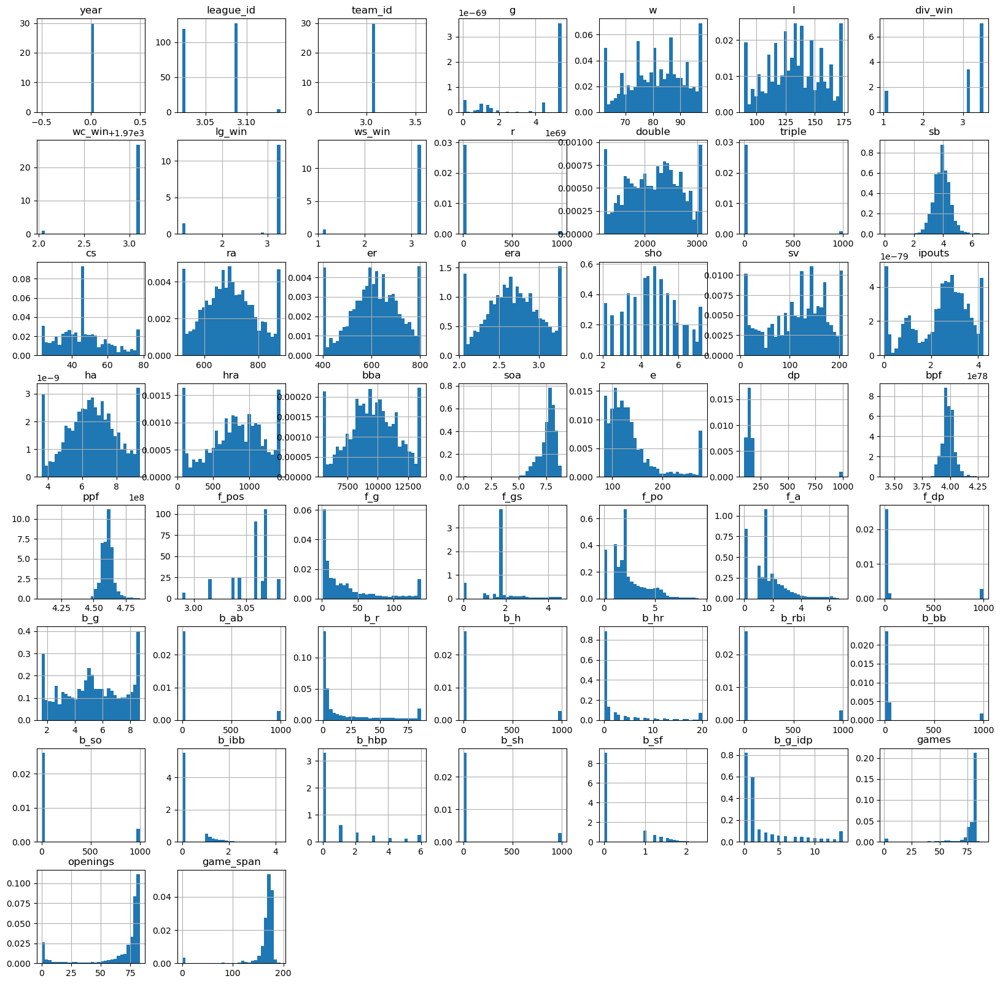

In [77]:
X_test_enc.hist(bins=30, figsize=(20,20), density=True)

In [78]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(X_train_enc, y_train)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('train_mse:', mean_squared_error(y_train, model_linear_regression.predict(X_train_enc)), 
      '\n test_mse:', mean_squared_error(y_test, model_linear_regression.predict(X_test_enc)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('train_r-sq:', r2_score(y_train, model_linear_regression.predict(X_train_enc)), 
      '\n test_r-sq:', r2_score(y_test, model_linear_regression.predict(X_test_enc)))

train_mse: 1.8260571836526123 
 test_mse: 1.8267663913039058
train_r-sq: 0.07174827041780374 
 test_r-sq: 0.07091810332634874


### Variable Discretization/Binning <a id="step4.5"></a>

[back to top](#top)

In [79]:
cols = ['r', 'triple', 'sb', 'soa', 'bpf', 'b_ab', 'f_gs', 'f_po', 'f_a', 'b_h', 'b_rbi', 'b_so', 'b_ibb', 'b_sf', 'g', 'ppf']

In [80]:
disc = EqualFrequencyDiscretiser(q=10, variables = cols)

disc.fit(X_train_enc)

EqualFrequencyDiscretiser(variables=['r', 'triple', 'sb', 'soa', 'bpf', 'b_ab',
                                     'f_gs', 'f_po', 'f_a', 'b_h', 'b_rbi',
                                     'b_so', 'b_ibb', 'b_sf', 'g', 'ppf'])

In [81]:
disc.binner_dict_

{'r': [-inf,
  6.724710114416613,
  6.8920181740250115,
  6.993157740890052,
  7.084777426298207,
  7.158562550893559,
  7.236543755415862,
  7.3097203388654695,
  7.414982640069808,
  7.578614813564228,
  inf],
 'triple': [-inf,
  2.4926757485402593,
  2.626527804403767,
  2.7461192933624785,
  2.82842712474619,
  2.9054968792442244,
  2.978071215719372,
  3.0905838914967028,
  3.2529025491464565,
  3.5144970301577456,
  inf],
 'sb': [-inf,
  3.2140958497160383,
  3.4822022531844965,
  3.622403777287988,
  3.804955091989956,
  3.9078542362742903,
  4.028190508306193,
  4.183739179984261,
  4.346417488775679,
  4.575295380404088,
  inf],
 'soa': [-inf,
  6.554554585491637,
  7.1033917504043504,
  7.426155412768537,
  7.649632571395545,
  7.774722632738619,
  7.895285202487368,
  8.039614389892176,
  8.19590458202891,
  8.385656054039586,
  inf],
 'bpf': [-inf,
  3.9078542362742903,
  3.9448593208621605,
  3.9570161493329823,
  3.9690864506808694,
  3.9810717055349722,
  3.9929733546852

In [82]:
train_t = disc.transform(X_train_enc)
test_t = disc.transform(X_test_enc)

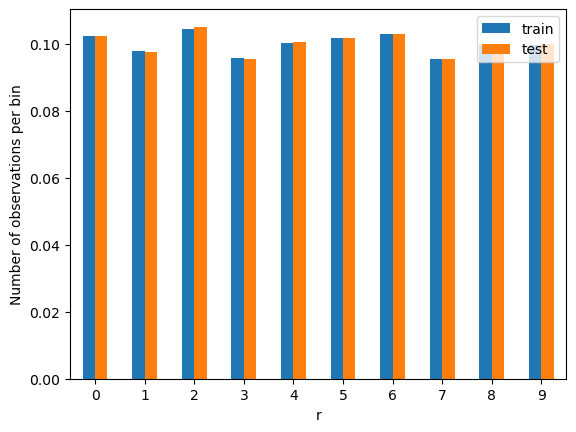

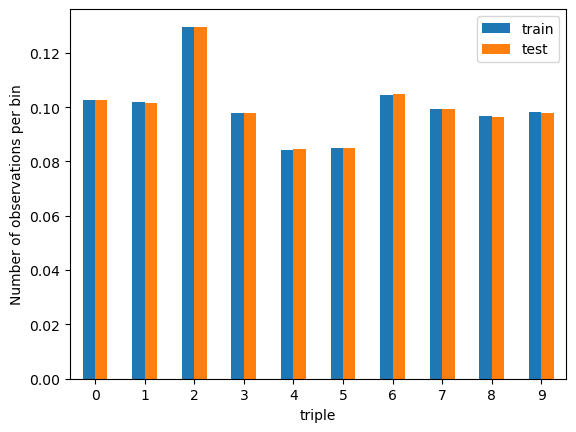

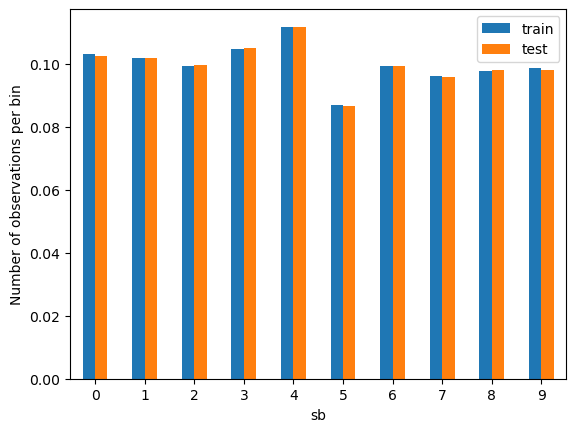

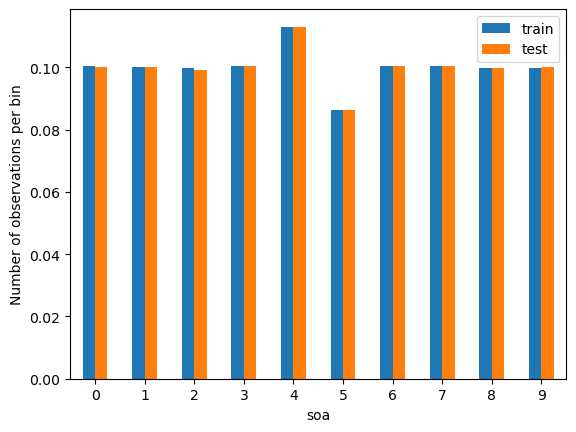

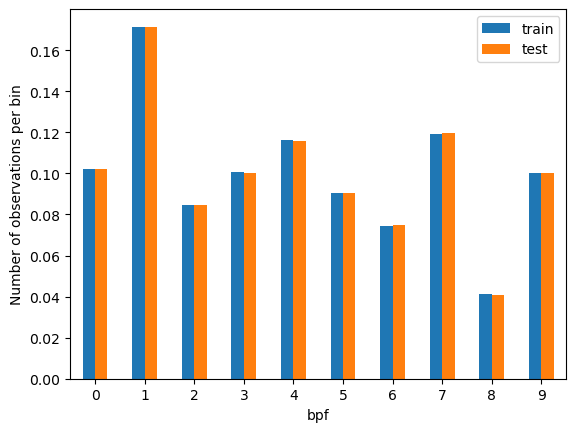

...

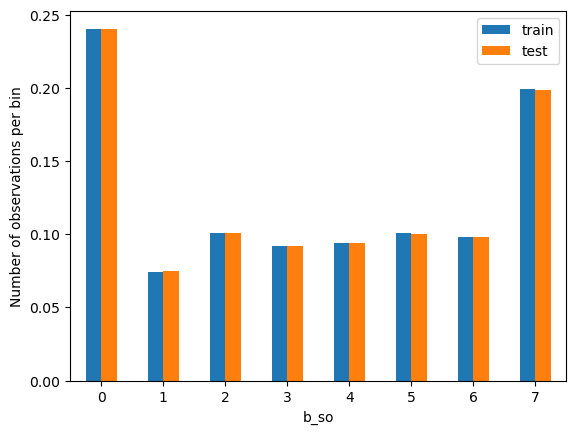

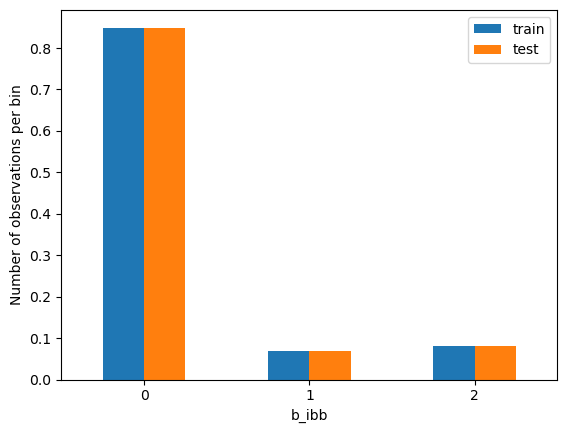

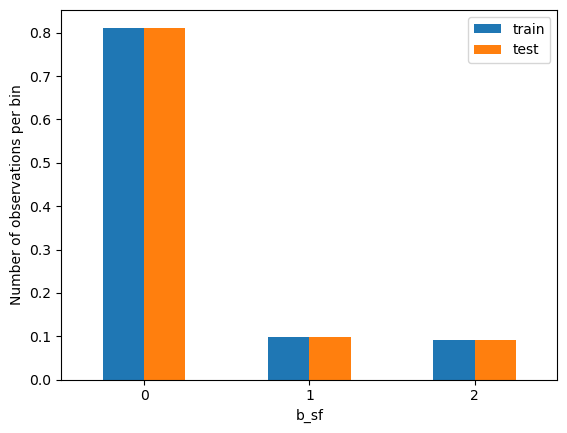

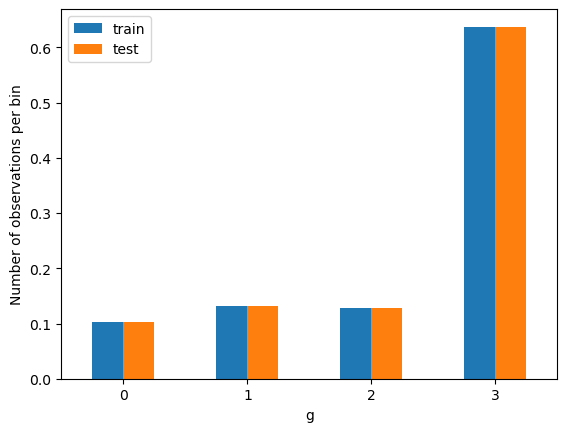

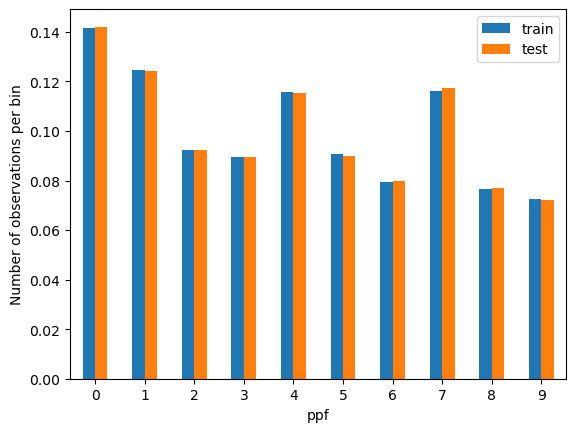

In [83]:
for cols in cols:
    t1 = train_t.groupby([cols])[cols].count() / len(train_t)
    t2 = test_t.groupby([cols])[cols].count() / len(test_t)

    # concatenate aggregated views
    tmp = pd.concat([t1, t2], axis=1)
    tmp.columns = ['train', 'test']

    # plot
    tmp.plot.bar()
    plt.xticks(rotation=0)
    plt.ylabel('Number of observations per bin')

In [84]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(train_t, y_train)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('train_mse:', mean_squared_error(y_train, model_linear_regression.predict(train_t)), 
      '\n test_mse:', mean_squared_error(y_test, model_linear_regression.predict(test_t)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('train_r-sq:', r2_score(y_train, model_linear_regression.predict(train_t)), 
      '\n test_r-sq:', r2_score(y_test, model_linear_regression.predict(test_t)))

train_mse: 1.927216153670908 
 test_mse: 1.9268688908931493
train_r-sq: 0.020325461908374143 
 test_r-sq: 0.020006601657126533


### Standardization <a id="step4.6"></a>

[back to top](#top)

In [85]:
scaler = StandardScaler()

scaler.fit(train_t)

X_train_scaled = scaler.transform(train_t)
X_test_scaled = scaler.transform(test_t)

In [86]:
scaler.mean_

array([1.97000000e+03, 3.05662464e+00, 3.05662464e+00, 2.30123367e+00,
       8.15894665e+01, 1.33255069e+02, 3.05662464e+00, 3.05662464e+00,
       3.05662464e+00, 3.05662464e+00, 4.48309985e+00, 2.17505893e+03,
       4.39671065e+00, 4.43678973e+00, 4.62290807e+01, 6.93909343e+02,
       6.14113360e+02, 2.67664317e+00, 4.68644303e+00, 1.16236065e+02,
       2.42636880e+78, 6.59954410e+08, 8.09200860e+02, 9.59740857e+03,
       4.48360965e+00, 1.35008594e+02, 1.71890233e+02, 4.06897269e+00,
       4.05390252e+00, 3.05662464e+00, 3.46170704e+01, 1.30392177e+00,
       3.42441392e+00, 3.30573114e+00, 9.47415702e+01, 5.31958296e+00,
       3.57396146e+00, 1.83834164e+01, 2.75124898e+00, 2.92062355e+00,
       2.05899605e+00, 6.99026363e+01, 3.42012330e+00, 2.33245362e-01,
       9.27561676e-01, 8.83372526e+01, 2.80159602e-01, 2.66002502e+00,
       7.59922843e+01, 6.62005676e+01, 1.64764991e+02])

In [87]:
scaler.scale_

array([1.00000000e+00, 3.42470876e-02, 1.00000000e+00, 1.04266396e+00,
       1.01703459e+01, 2.29909553e+01, 8.26866281e-01, 1.89880490e-01,
       6.57718958e-01, 4.33594465e-01, 2.87313784e+00, 5.21116213e+02,
       2.90162441e+00, 2.87449212e+00, 1.40490754e+01, 9.71186599e+01,
       1.05937504e+02, 3.30841155e-01, 1.39092608e+00, 5.73499143e+01,
       1.17659359e+78, 1.50889919e+08, 3.84636051e+02, 2.13129008e+03,
       2.87226698e+00, 4.81283375e+01, 1.48025770e+02, 2.86784778e+00,
       2.88842739e+00, 1.93327929e-02, 4.03574263e+01, 1.18272145e+00,
       2.79339768e+00, 2.83710094e+00, 2.85789478e+02, 2.17311946e+00,
       2.74968977e+00, 2.63773320e+01, 2.51374150e+00, 5.45552195e+00,
       2.17899616e+00, 2.30138842e+02, 2.63850998e+00, 5.85003970e-01,
       1.67426045e+00, 2.80767228e+02, 6.19850165e-01, 3.97473003e+00,
       1.45022936e+01, 2.51020717e+01, 2.89660000e+01])

In [88]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns=train_t.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=test_t.columns)

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\AppData\Local\Temp\ipykernel_21132\1786656170.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(train_t[cols], ax=ax1, label =cols)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\AppData\Local\Temp\ipykernel_21132\1786656170.py:12: UserWarnin

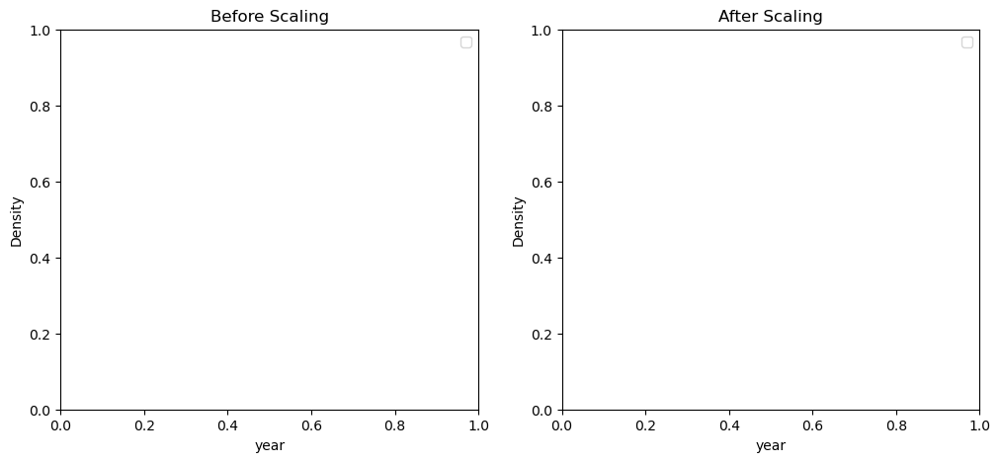

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


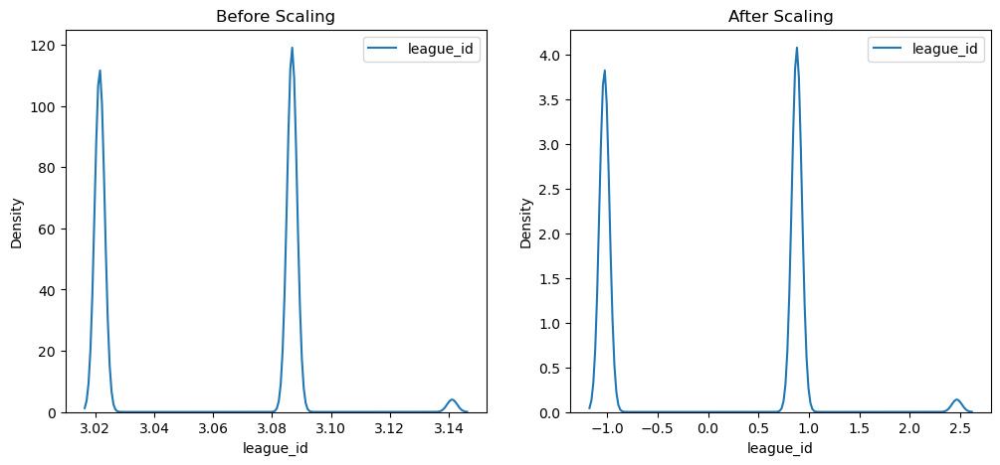

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\AppData\Local\Temp\ipykernel_21132\1786656170.py:12: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(X_train_scaled[cols], ax=ax2, label =cols)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


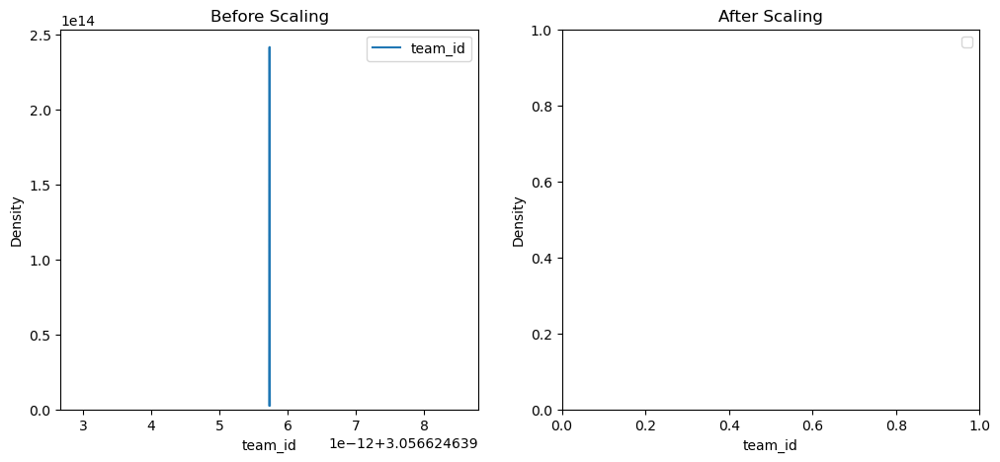

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


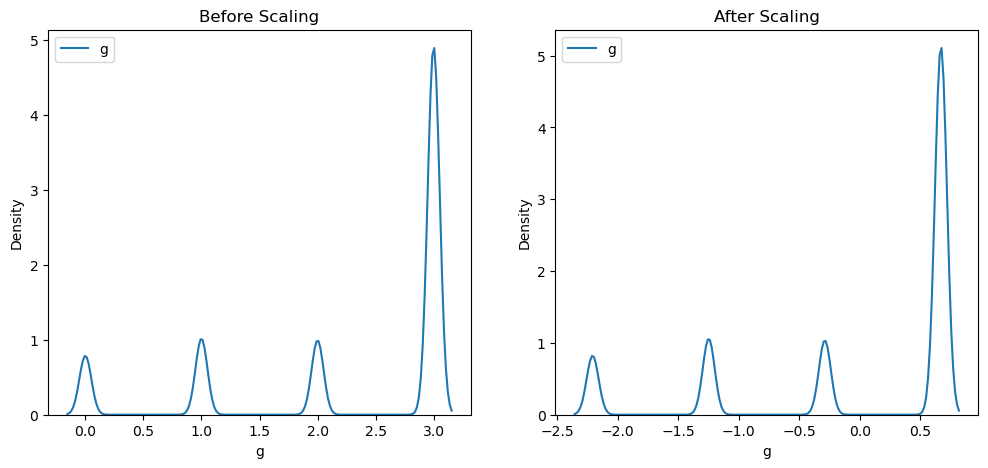

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


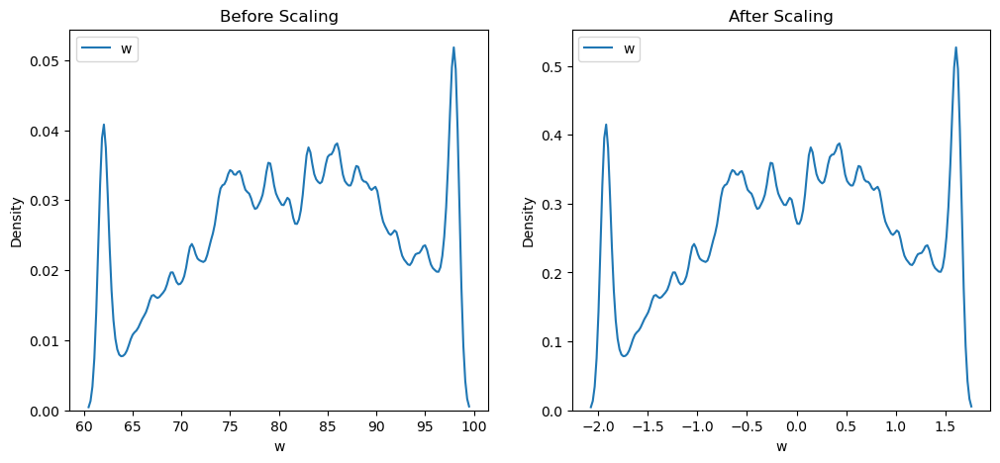

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


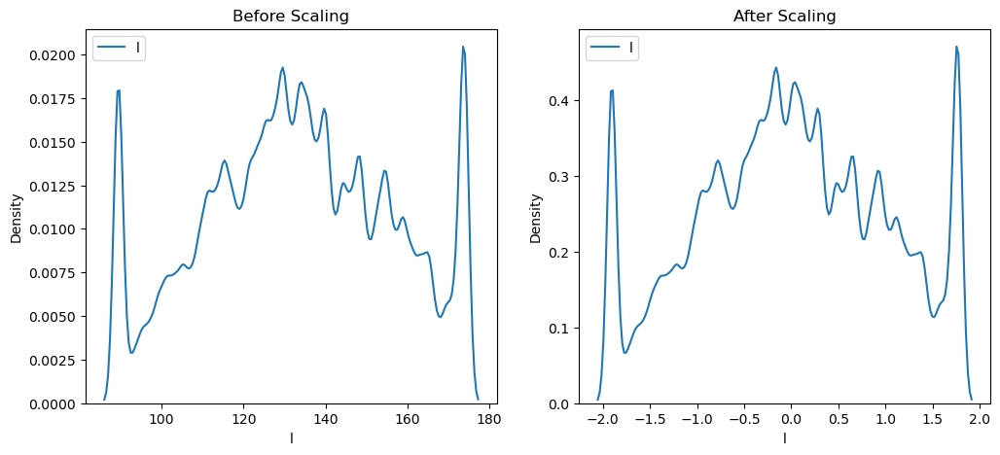

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


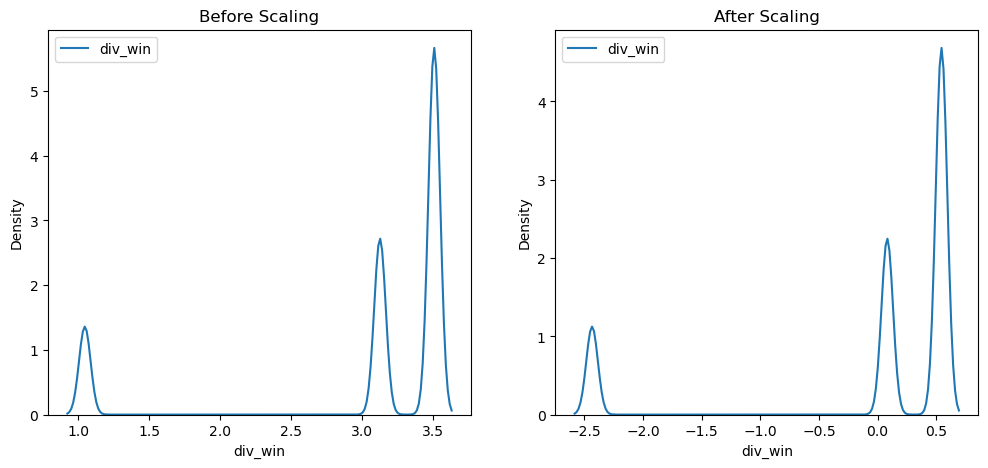

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


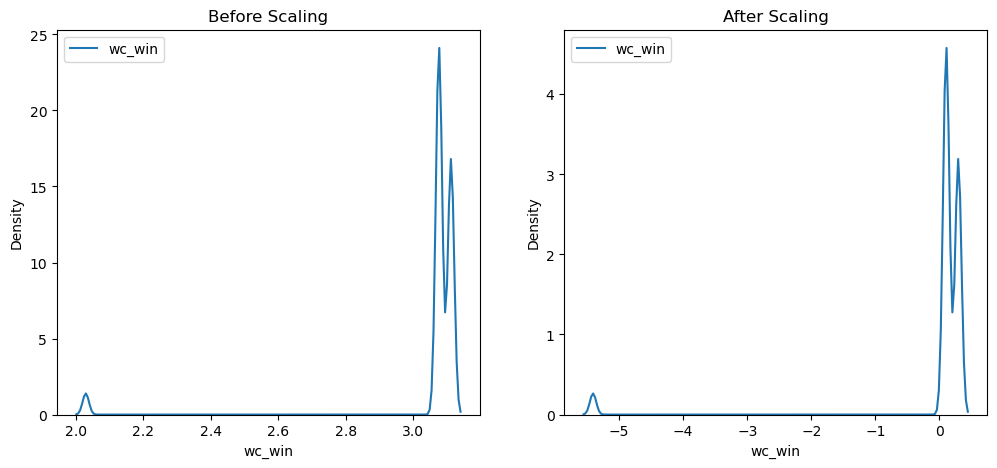

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


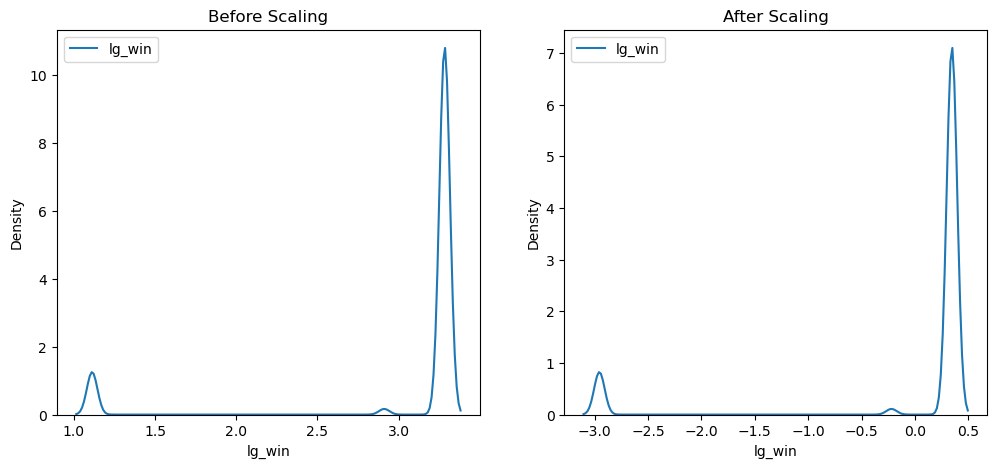

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


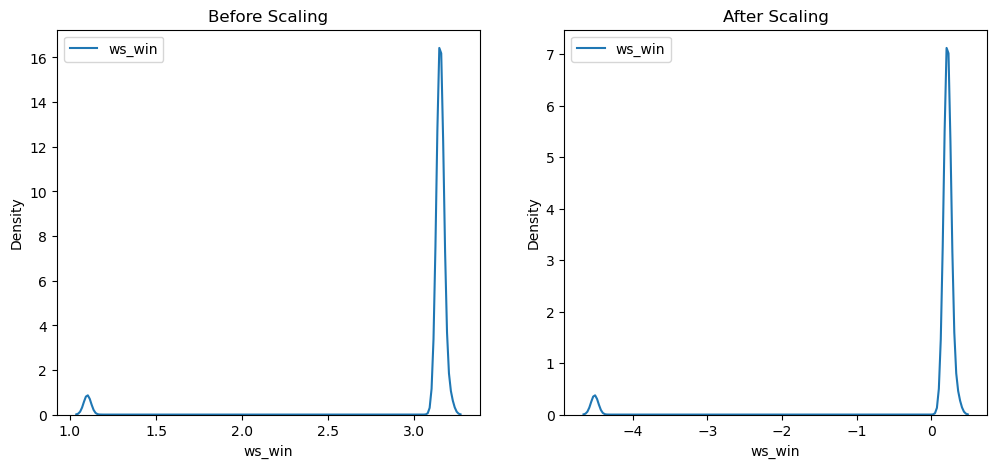

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


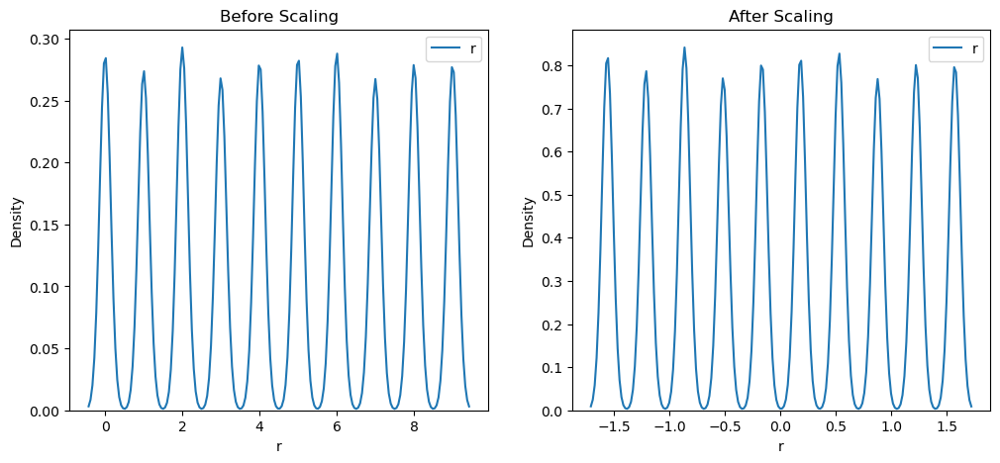

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


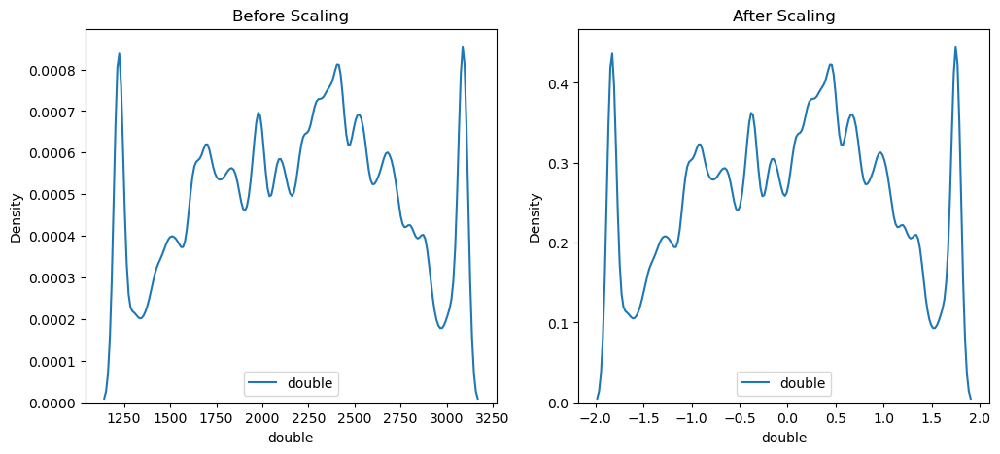

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


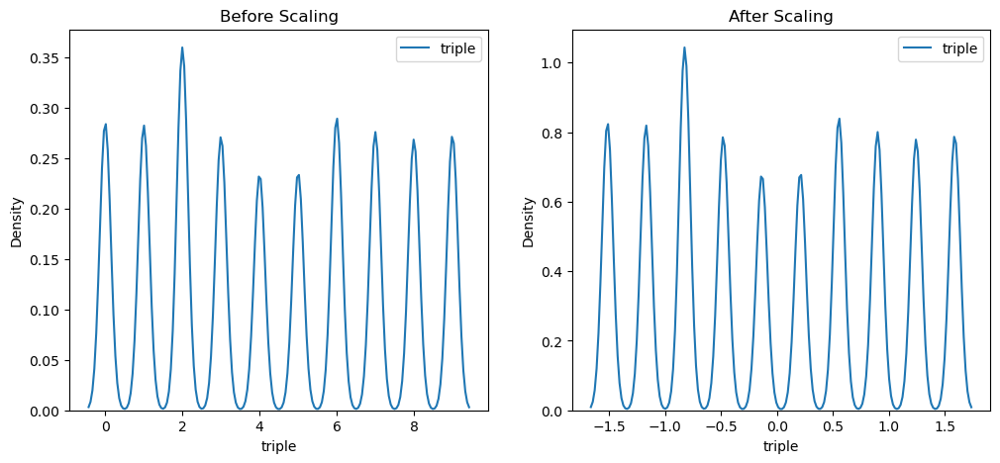

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


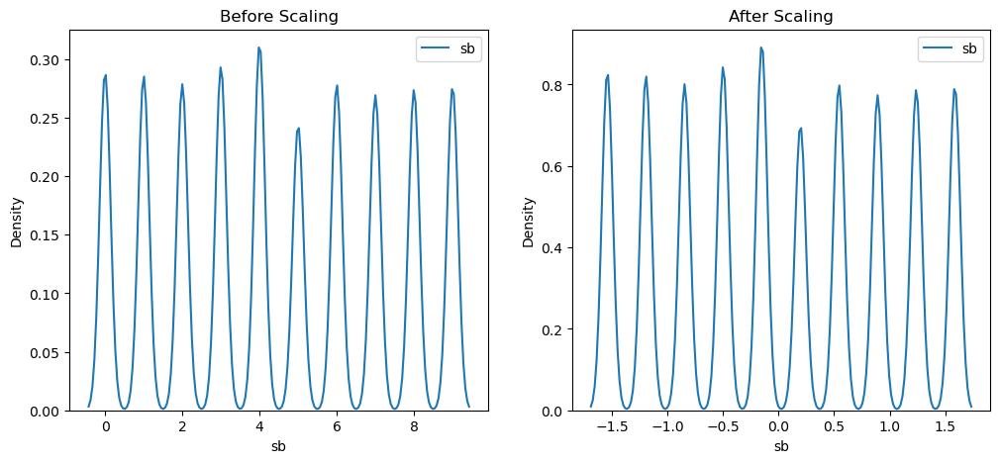

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


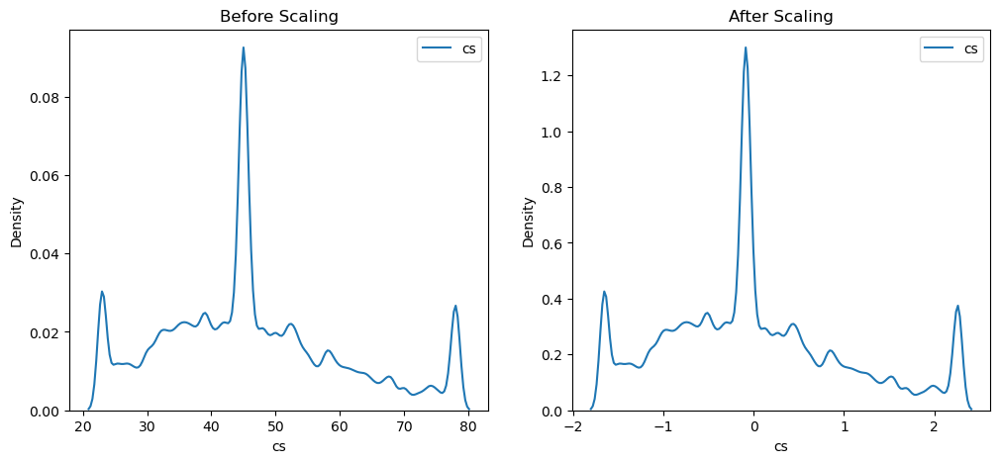

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


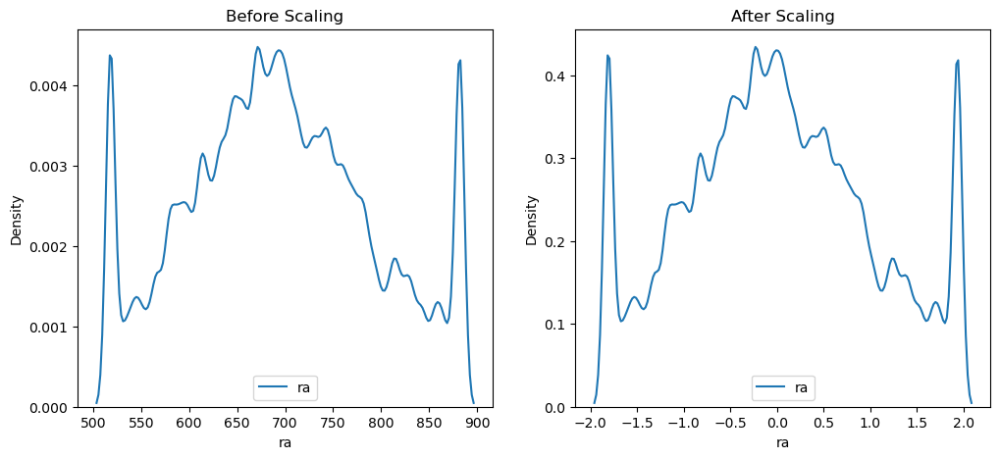

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


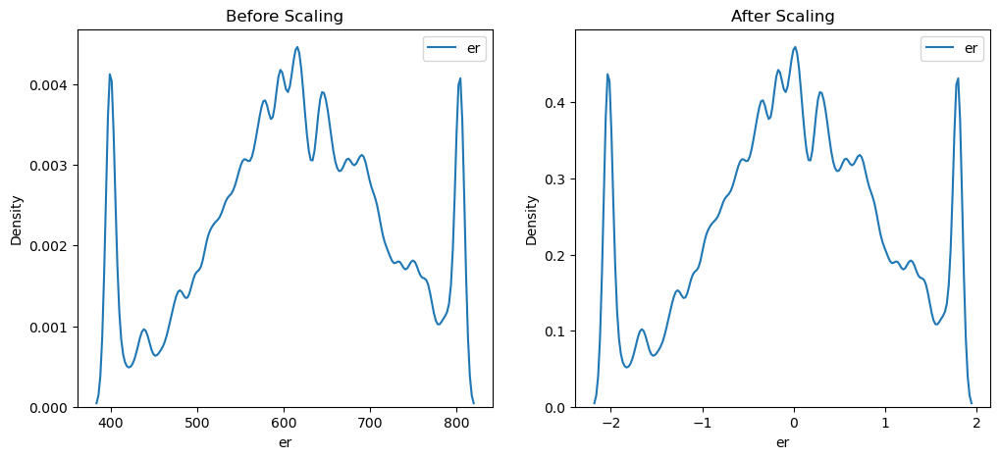

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


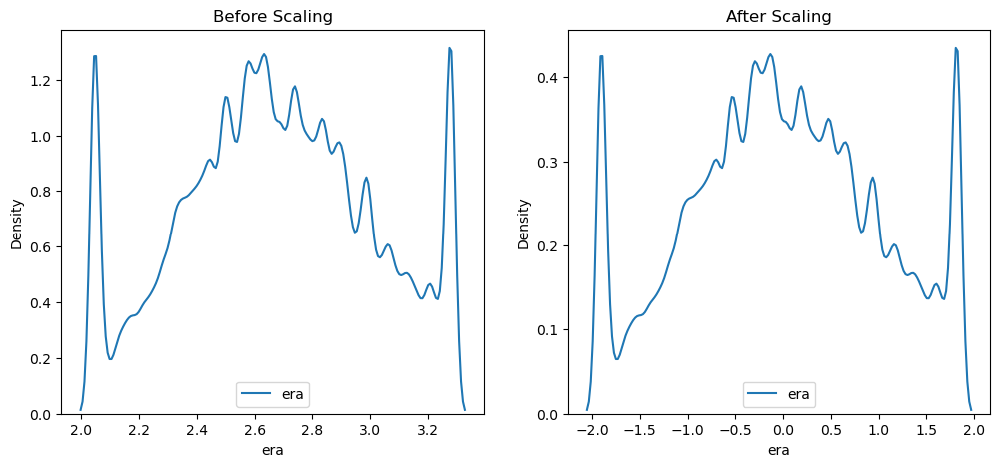

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


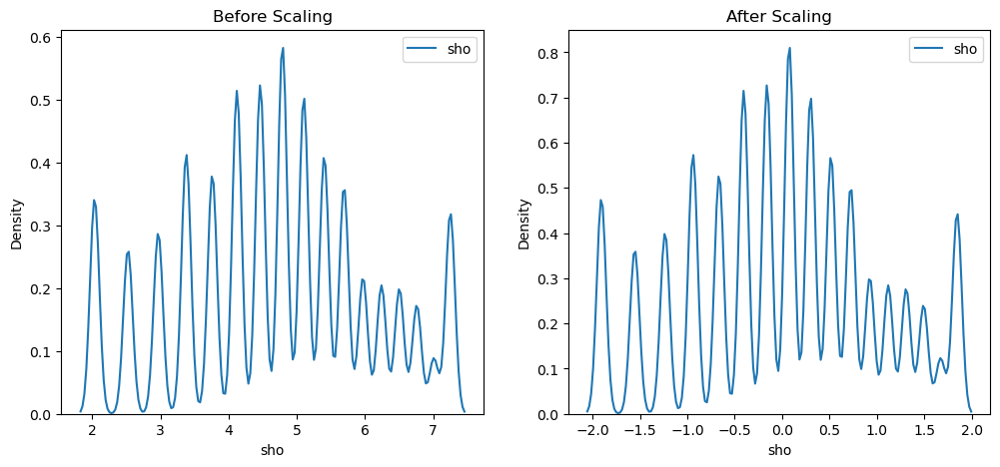

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


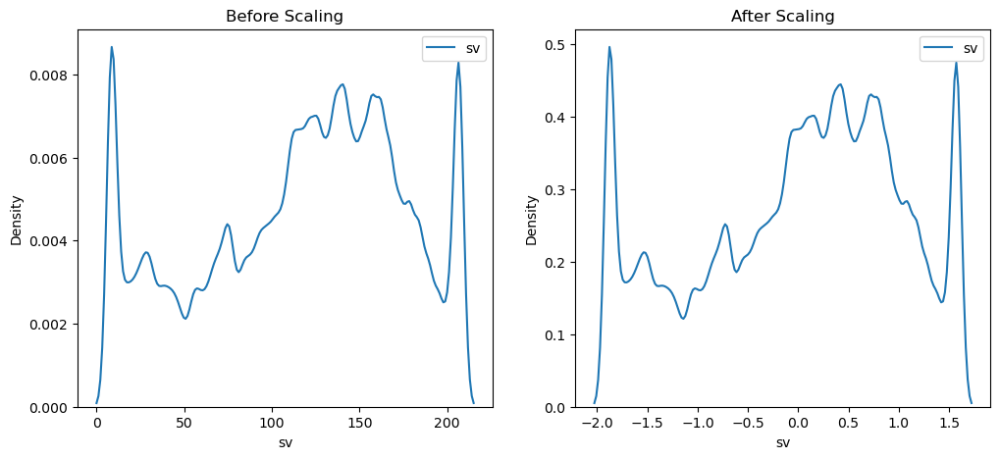

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


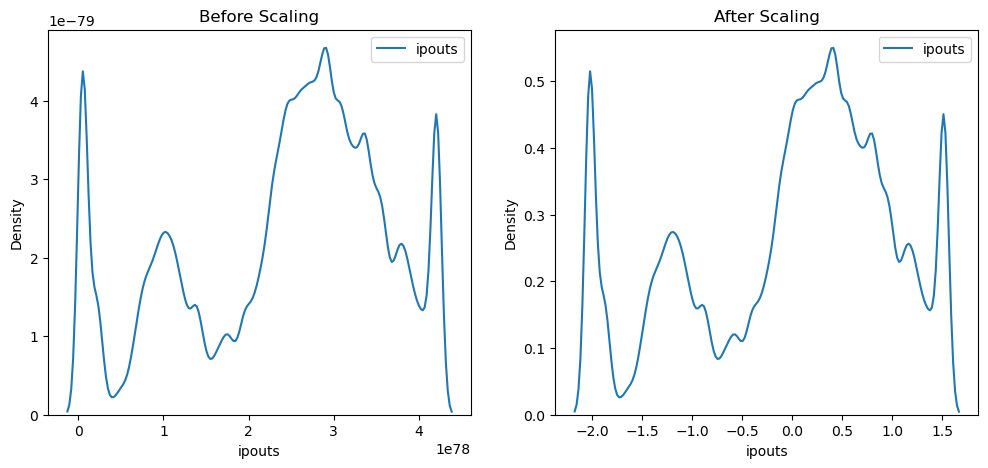

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


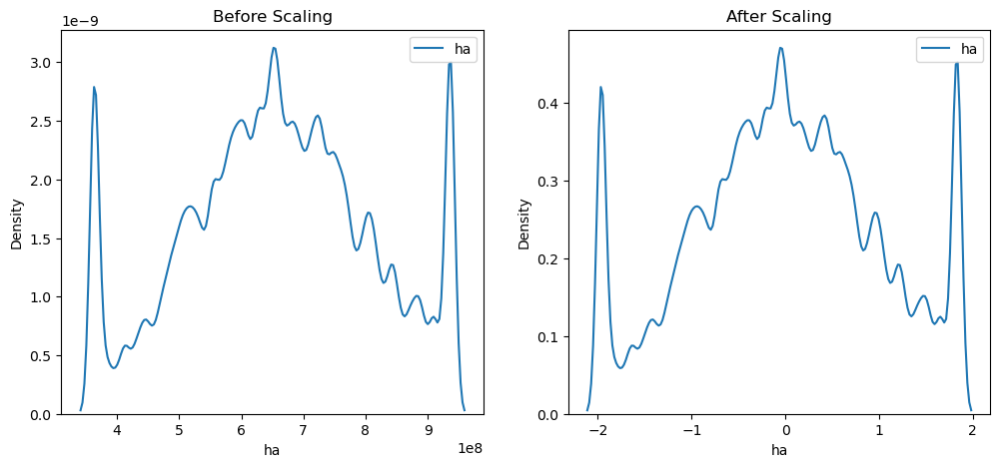

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


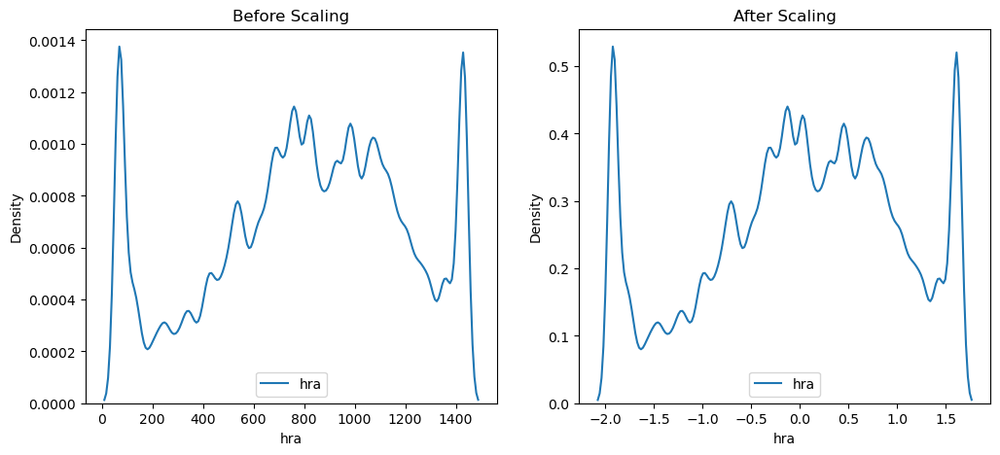

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


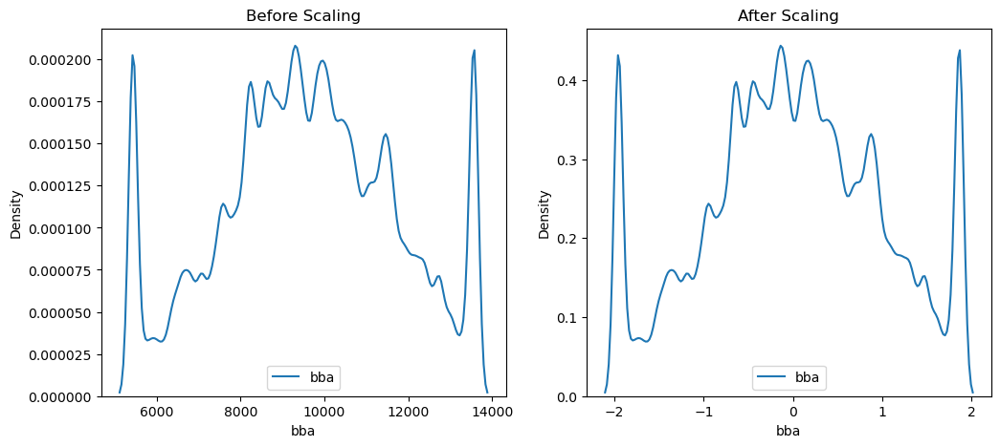

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


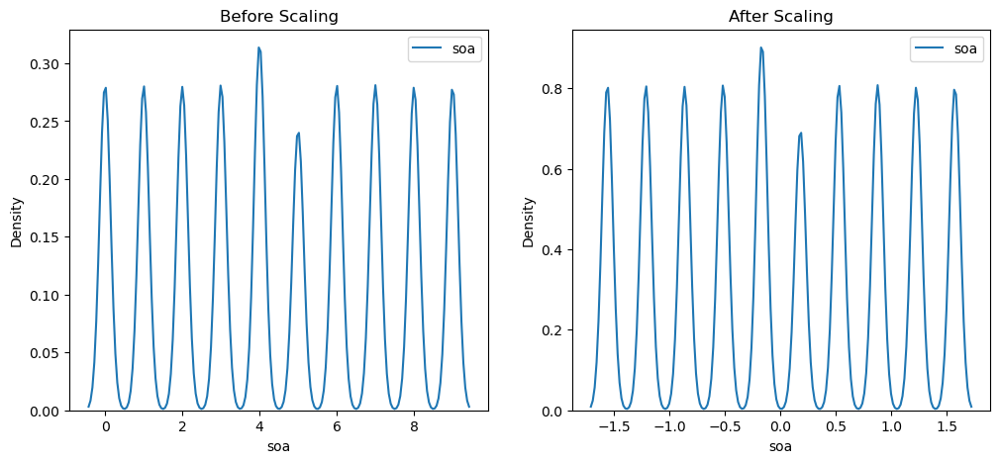

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


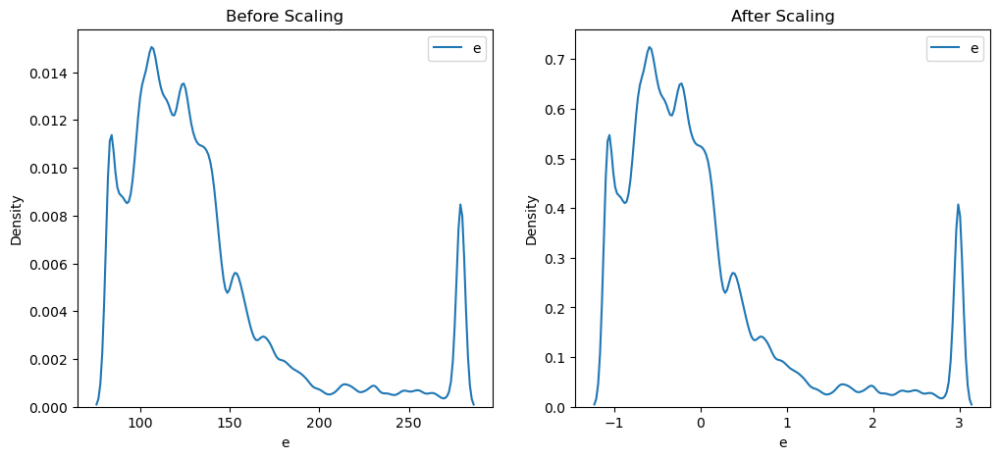

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


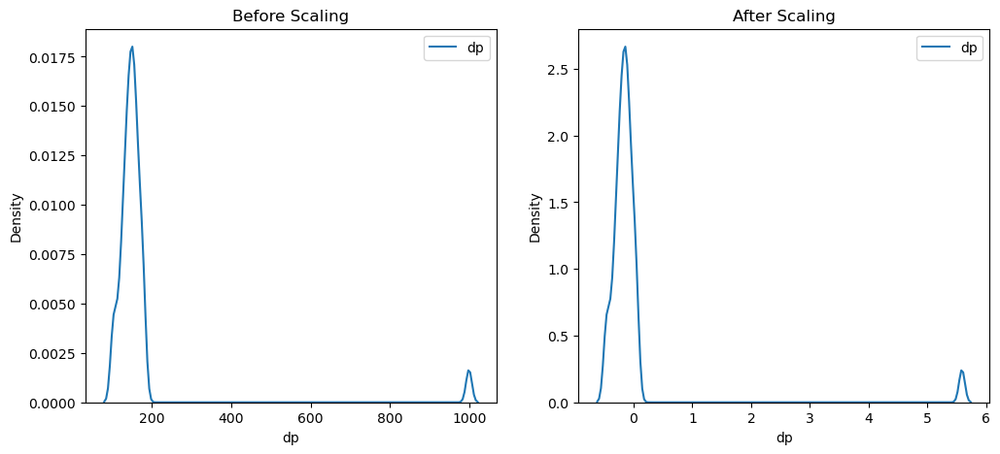

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


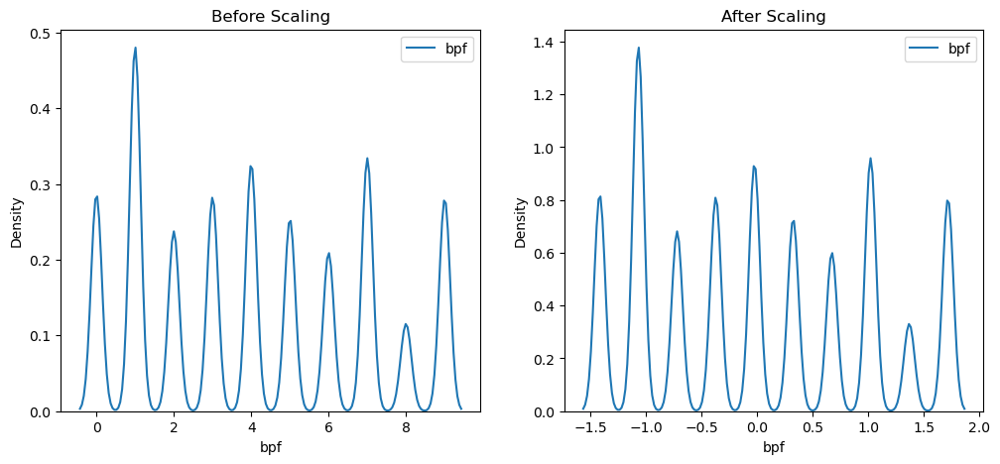

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


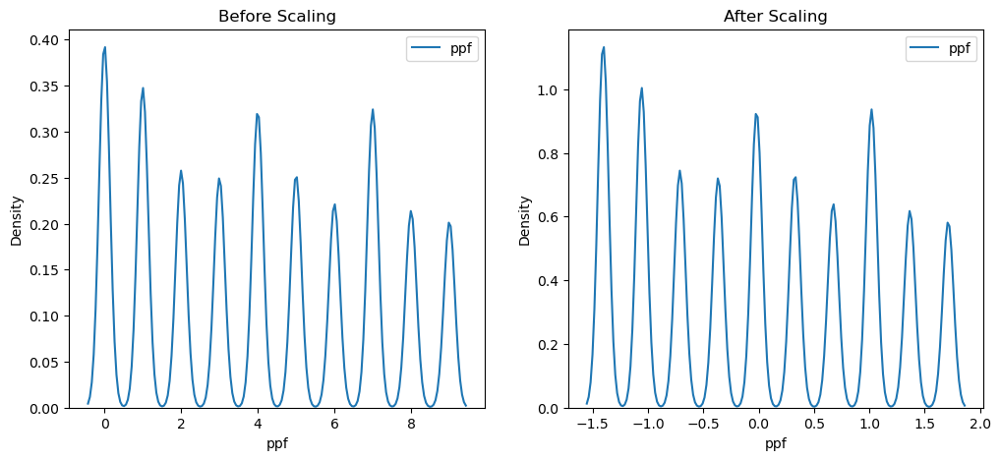

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


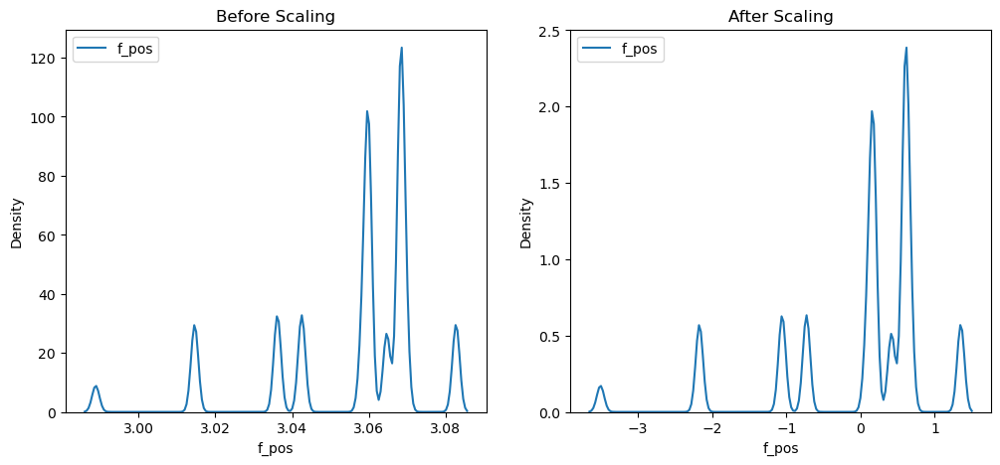

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


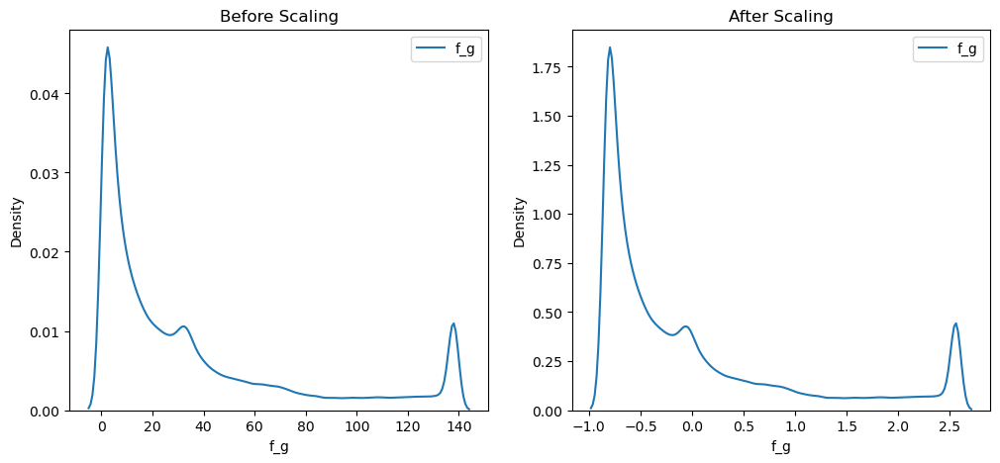

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


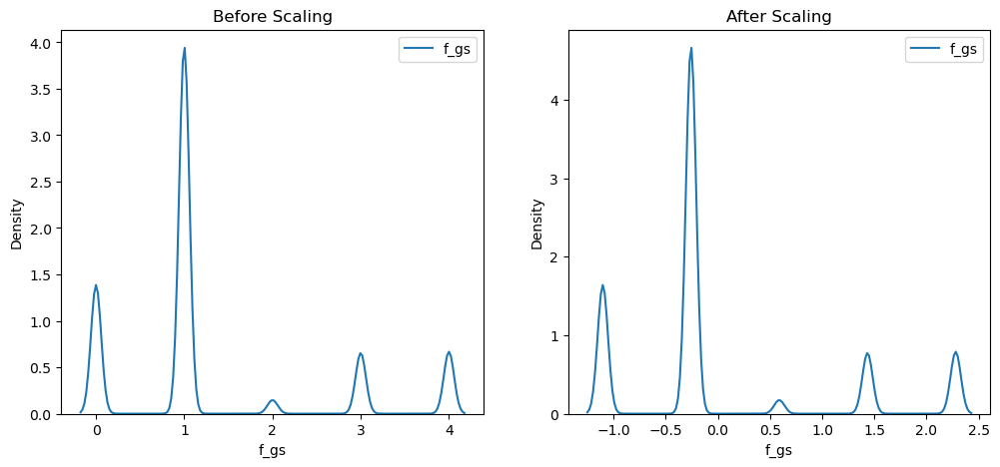

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


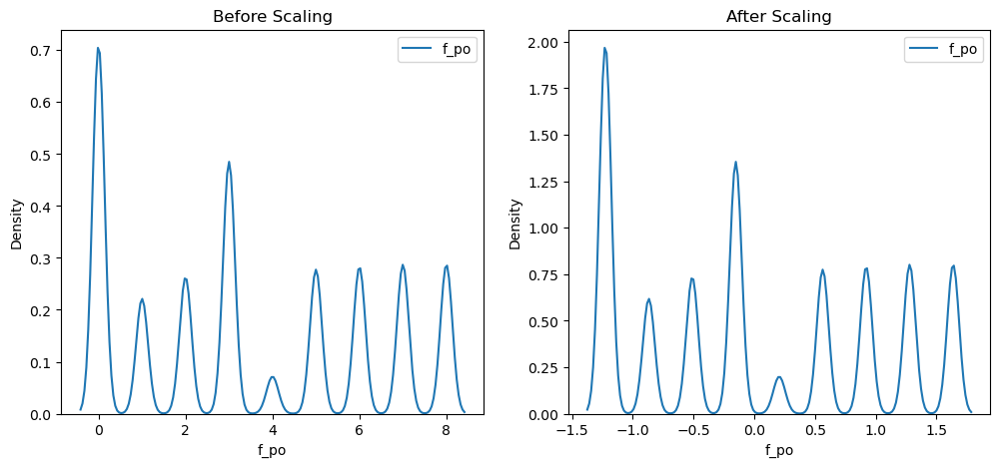

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


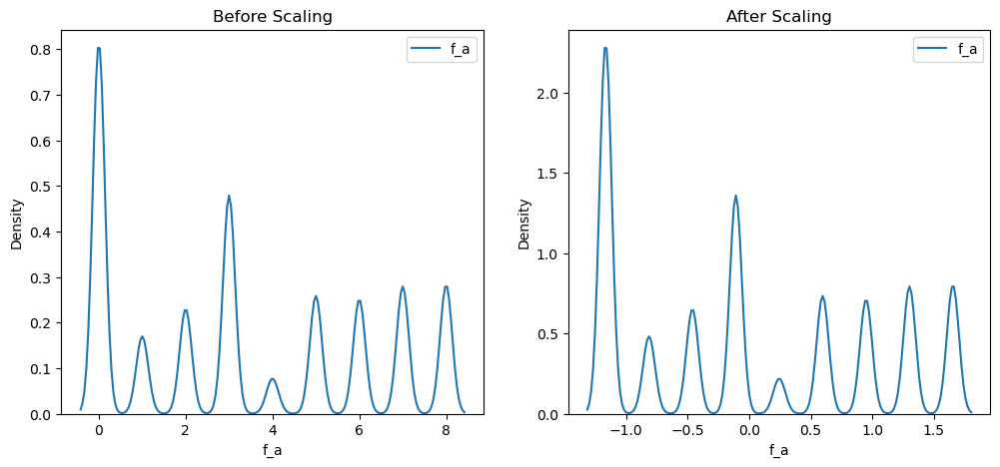

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


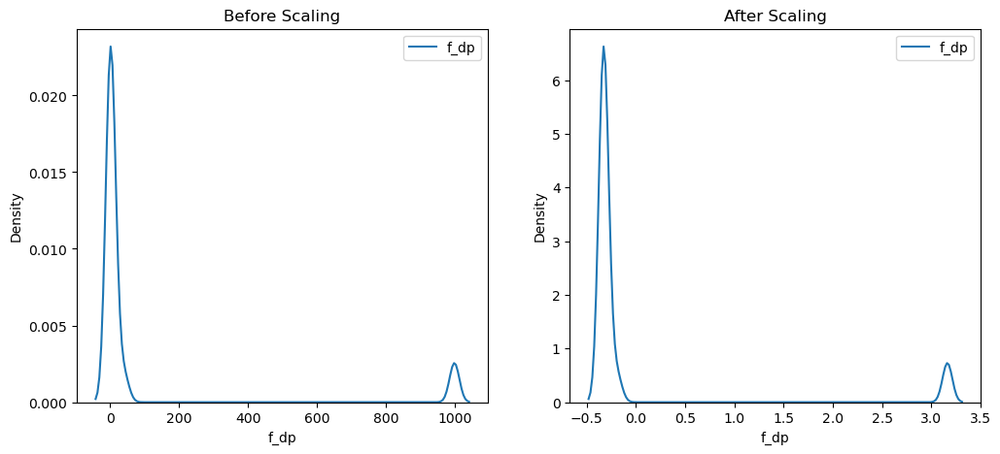

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


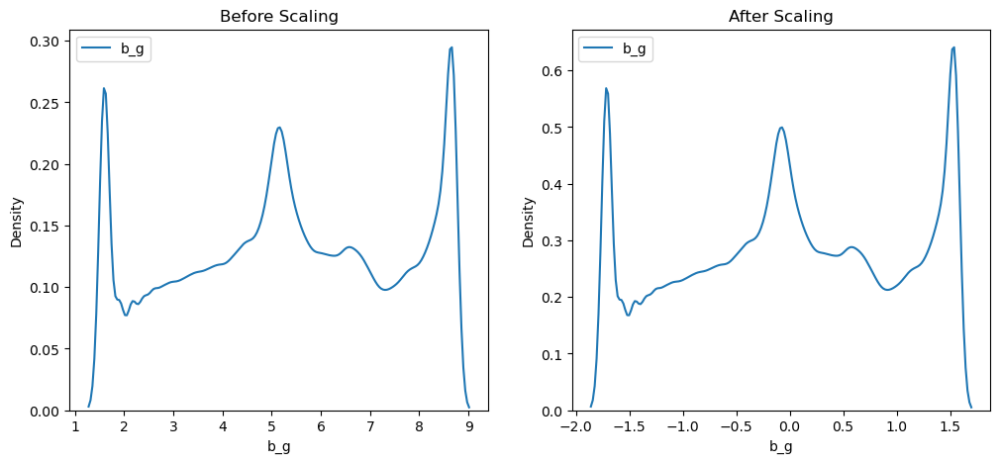

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


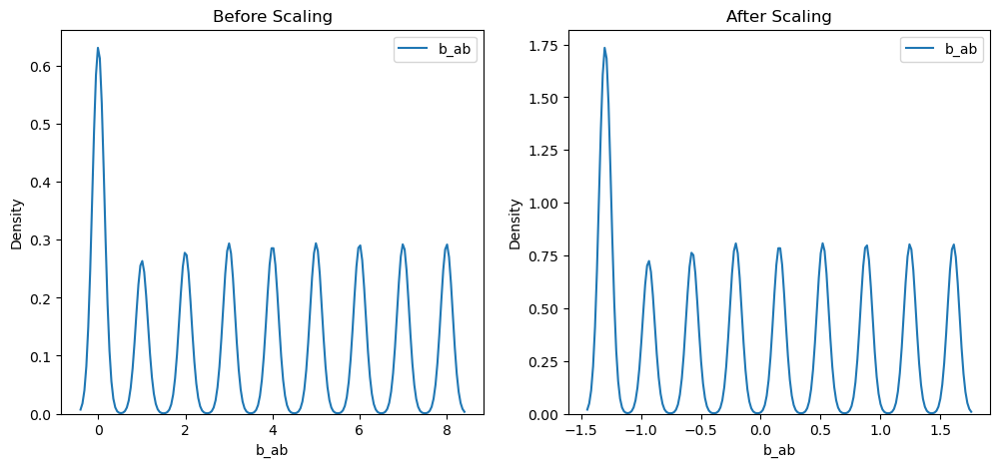

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


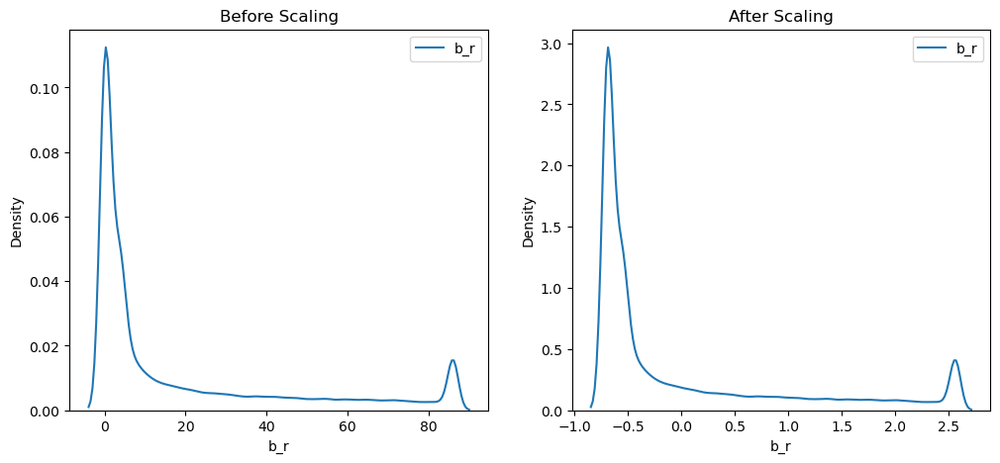

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


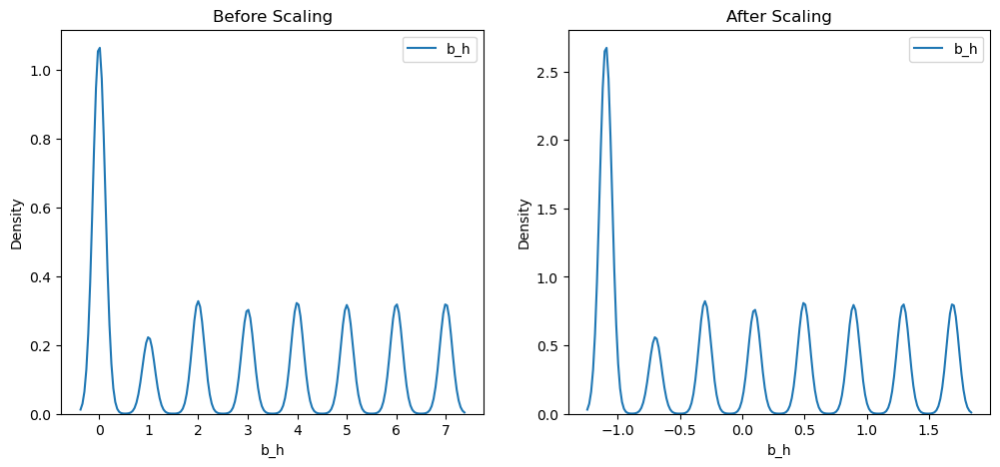

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


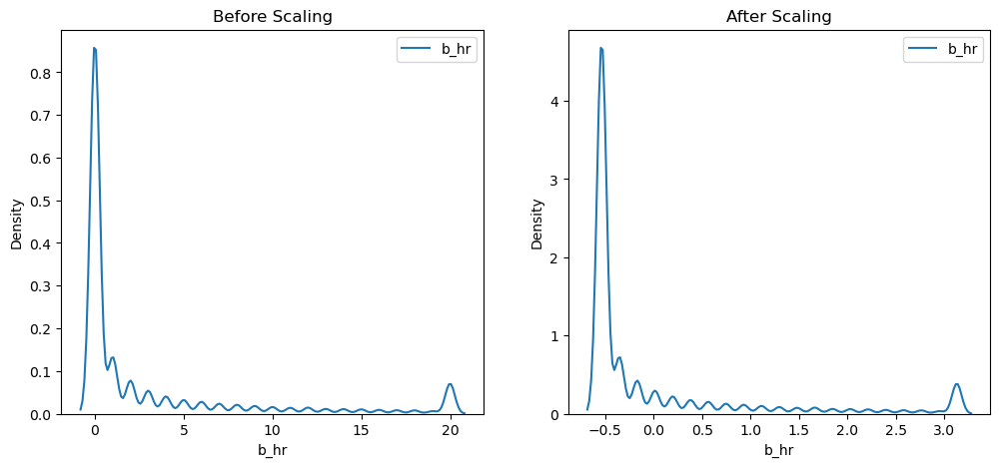

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


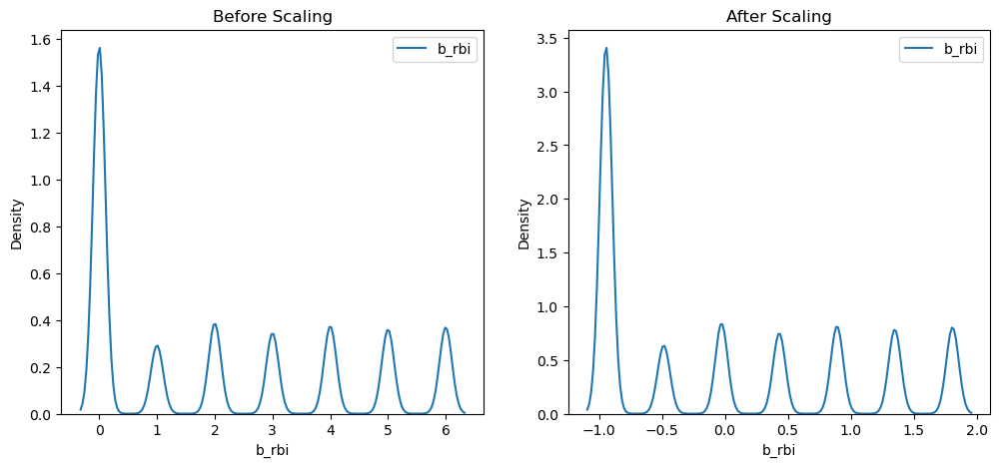

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


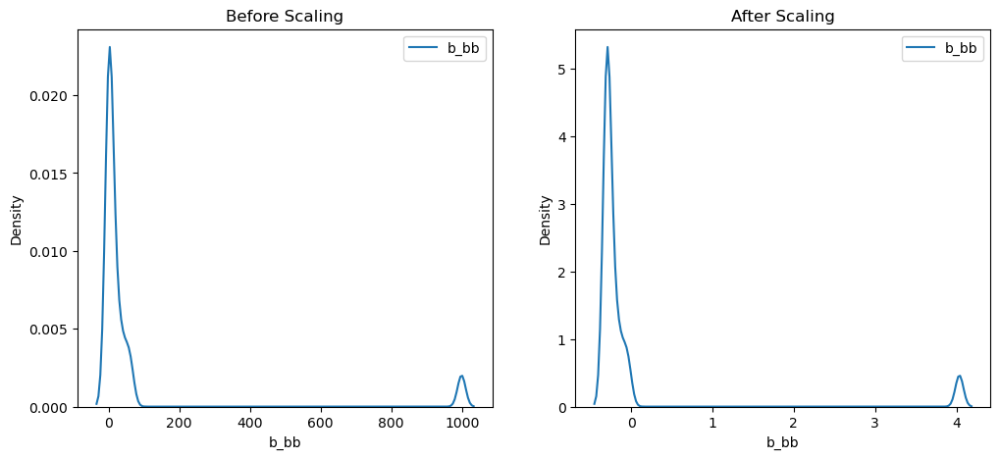

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


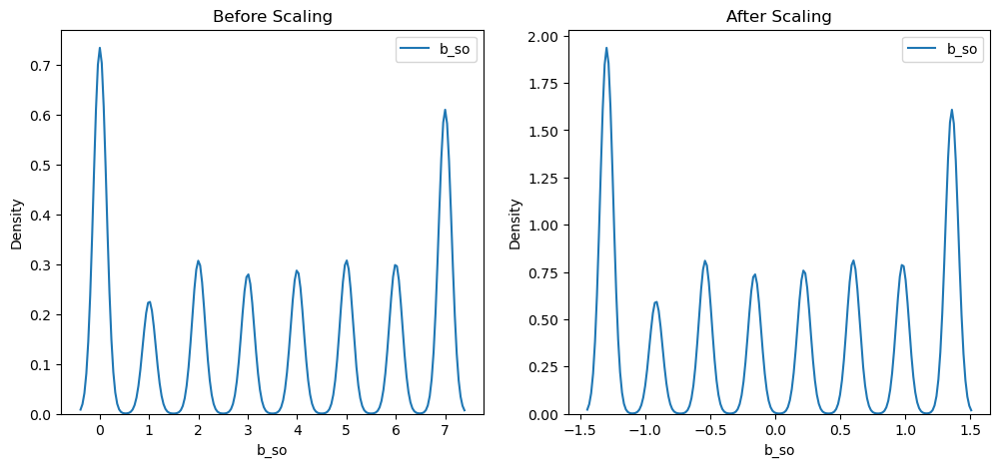

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


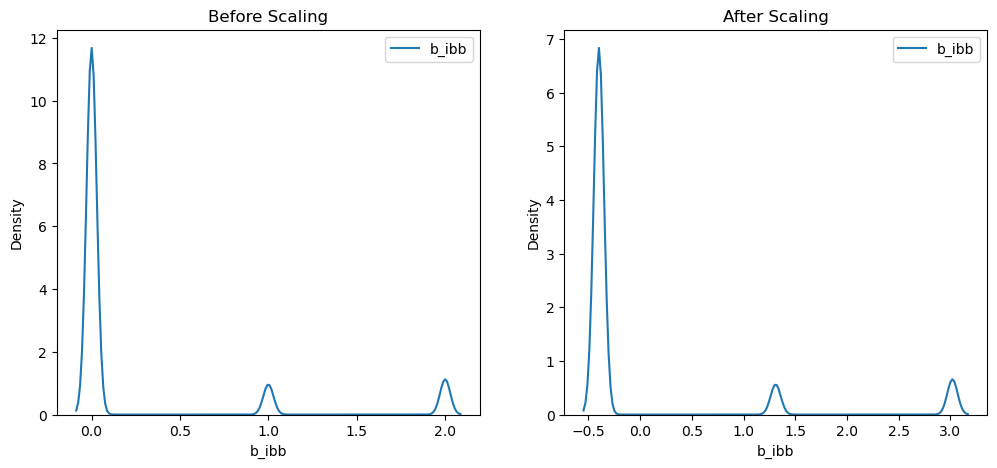

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


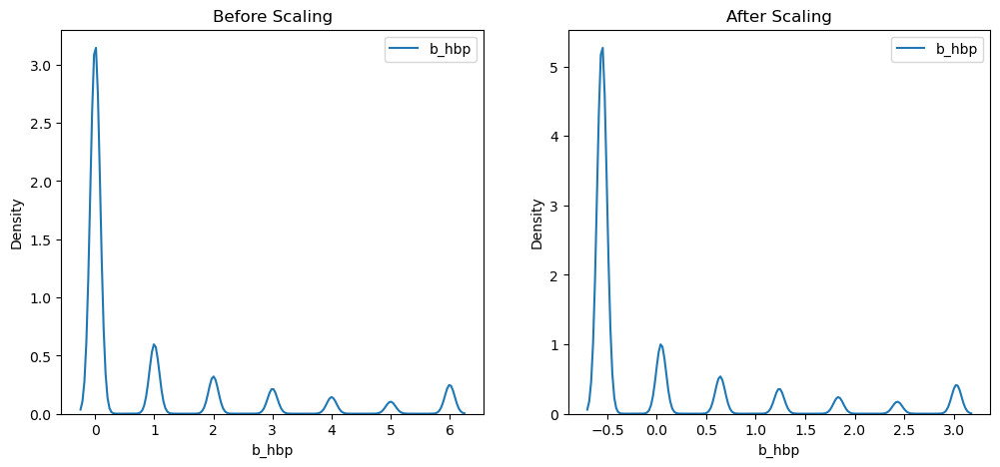

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


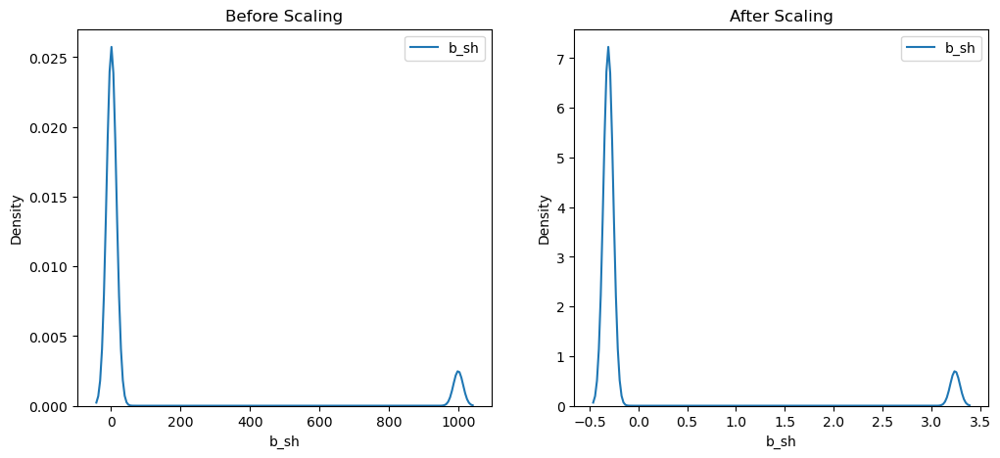

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


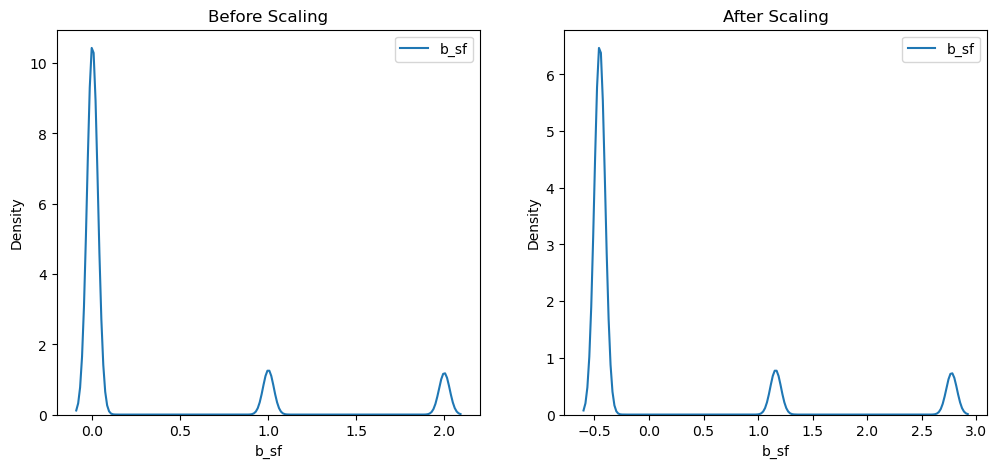

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


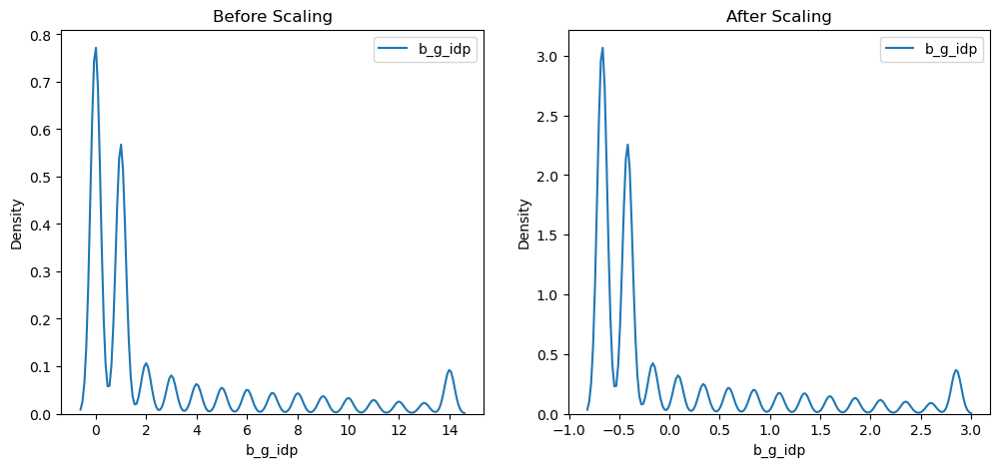

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


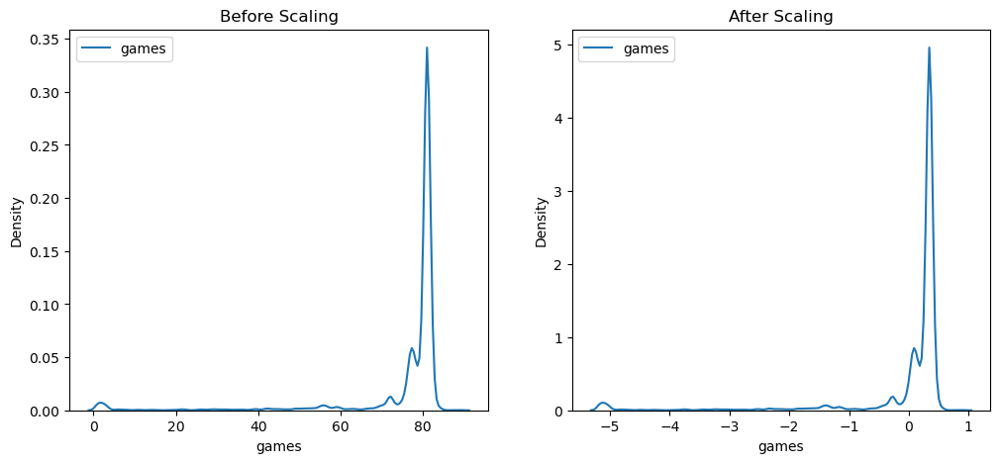

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


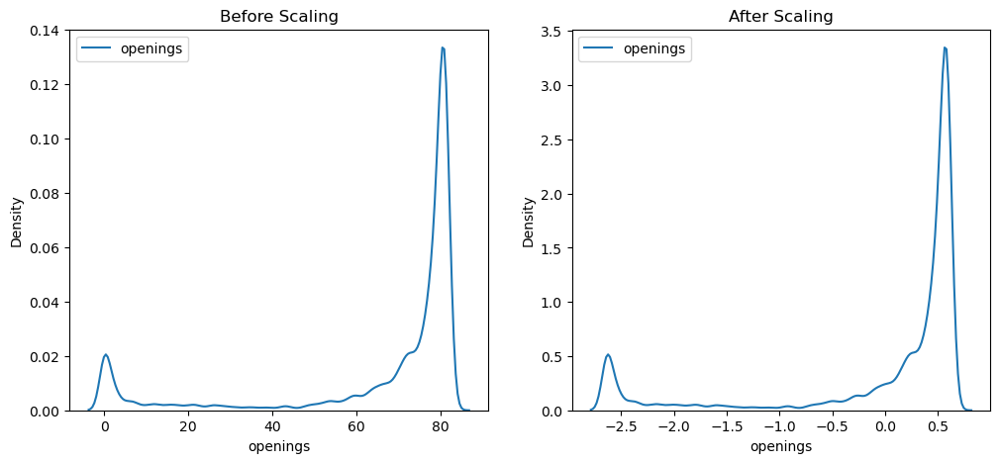

C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\leong\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


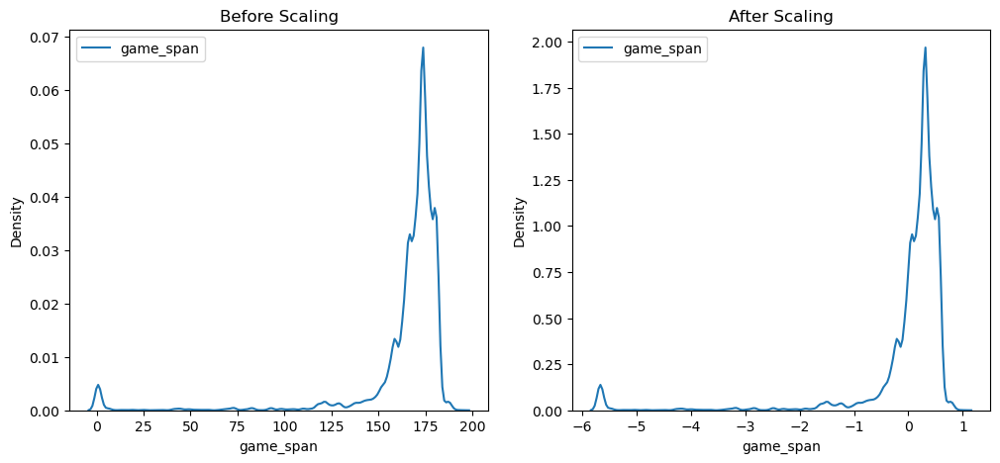

In [89]:
for cols in X_train_scaled.columns:
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

    # before scaling
    ax1.set_title('Before Scaling')
    sns.kdeplot(train_t[cols], ax=ax1, label =cols)
    ax1.legend()

    # after scaling
    ax2.set_title('After Scaling')
    sns.kdeplot(X_train_scaled[cols], ax=ax2, label =cols)
    ax2.legend()
    plt.show()

In [90]:
X_train_final = X_train_scaled
X_test_final = X_test_scaled

y_train_final = y_train
y_test_final = y_test

### Step 5: Naive Baseline Model & Linear Regression Model  <a id="step5"></a>

[back to top](#top)

In [91]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(X_train_final, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(X_train_final)), 
      '\n test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(X_test_final)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(X_train_final)), 
      '\n test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(X_test_final)))

train_mse: 0.4932863850137579 
 test_mse: 0.49297706637872346
train_r-sq: 0.7492444682633338 
 test_r-sq: 0.7492749647529726


In [92]:
import numpy as np
from scipy import stats

# pick the mean target value from all of train data
print(y_train_final.mean())

mean_target_value = y_train_final.mean()

print(f"The train mean target value is {mean_target_value:.2f}.")

3.056624638915735
The train mean target value is 3.06.


In [93]:
y_train_preds_naive = [round(mean_target_value,2) for row in X_train_final.iloc[:,0]]
y_train_preds_naive[0:5]

[3.06, 3.06, 3.06, 3.06, 3.06]

In [94]:
y_test_preds_naive = [round(mean_target_value,2) for row in X_test_final.iloc[:,0]]
y_test_preds_naive[0:5]

[3.06, 3.06, 3.06, 3.06, 3.06]

In [95]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

# Mean Squared Error (the lower the better, 0 is best possible score)

# train MSE score
y_true = y_train_final
y_pred = y_train_preds_naive

train_mse_naive = mean_squared_error(y_true, y_pred)
print(f"The Naive Baseline Model's MSE on train data is {train_mse_naive}.")

# test MSE score
y_true = y_test_final
y_pred = y_test_preds_naive

test_mse_naive = mean_squared_error(y_true, y_pred)
print(f"The Naive Baseline Model's MSE on test data is {test_mse_naive}.")

print()

# Root Mean Squared Error (if MSE < 1, rooting it makes it numerically larger, vice-versa if MSE > 1)

# train RMSE score
y_true = y_train_final
y_pred = y_train_preds_naive

train_rmse_naive = mean_squared_error(y_true, y_pred, squared=False)
print(f"The Naive Baseline Model's RMSE on train data is {train_rmse_naive}.")

# test RMSE score
y_true = y_test_final
y_pred = y_test_preds_naive

test_rmse_naive = mean_squared_error(y_true, y_pred, squared=False)
print(f"The Naive Baseline Model's RMSE on test data is {test_rmse_naive}.")

print()

# R2 Value (Coefficient of Determination, which measures how well the X cols account for y's variance, 1.0 is best score)

# train R2 score
y_true = y_train_final
y_pred = y_train_preds_naive

train_r2_naive = r2_score(y_true, y_pred)
print(f"The Naive Baseline Model's R2 on train data is {train_r2_naive}.")

# test R2 score
y_true = y_test_final
y_pred = y_test_preds_naive

test_r2_naive = r2_score(y_true, y_pred)
print(f"The Naive Baseline Model's R2 on test data is {test_r2_naive}.")


The Naive Baseline Model's MSE on train data is 1.9672118037468604.
The Naive Baseline Model's MSE on test data is 1.966206727424933.



C:\Users\leong\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\leong\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


The Naive Baseline Model's RMSE on train data is 1.4025732792787906.
The Naive Baseline Model's RMSE on test data is 1.4022149362437033.

The Naive Baseline Model's R2 on train data is -5.7915108122585934e-06.
The Naive Baseline Model's R2 on test data is -3.7457692858566816e-07.


In [96]:
for cols in num_cols:
    correlation = data_copy[cols].corr(data_copy['rank'])
    print (f'{cols}: ', correlation)

C:\Users\leong\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\leong\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


year:  nan
g:  -0.022169945212886406
w:  -0.7596797433798762
l:  0.6745152431192348
r:  -0.01789328497066371
double:  -0.11136685876317991
triple:  0.015503330480729332
sb:  0.005922549774797503
cs:  0.02710931134131953
ra:  0.34084682286463047
er:  0.2593192893614173
era:  0.2968581175472498
sho:  -0.288404372846732
sv:  -0.2671730531466837
ipouts:  -0.1422352655814085
ha:  0.2564266518536035
hra:  0.08405987039336525
bba:  0.20645189636649217
soa:  -0.025386619617137025
e:  0.11868844987649353
dp:  0.0541987185488158
bpf:  0.00771290071693493
ppf:  0.011645805366990456
f_g:  -0.029219306850027386
f_gs:  0.0032100713902379974
f_po:  0.003201051100490337
f_a:  0.011221670793485997
f_dp:  -0.0002756230003474923
b_g:  -0.024165610918301383
b_ab:  0.004685103653814277
b_r:  -0.045541446344699296
b_h:  0.004735525300903342
b_hr:  -0.045436182308289254
b_rbi:  0.002028781036906404
b_bb:  -0.03568988304569516
b_so:  0.0018046761001583313
b_ibb:  -0.00044373326301009583
b_hbp:  -0.02429017925

<Axes: >

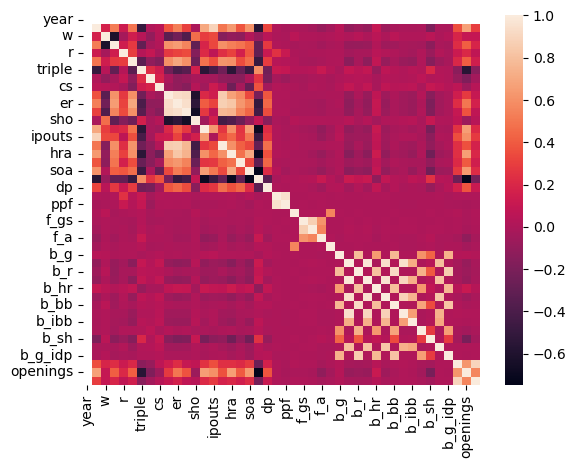

In [97]:
sns.heatmap(data_copy[num_cols].corr())

### Report <a id="step6"></a>

[back to top](#top)

### 1. Introduction with Value Based Problem Statement 

As a data analyst, I have extracted data from multiple databases to wrangle and prepare the data ready for modelling to use the prepared data to build and evaluate the machine learning model that will help to aid my analysis. By conducting this research, we are able to enhance our game strategies, work on weak areas and allocate resources effectively. With better performance, our fundings will increase, more funds for better resources and achieve a better standing.

The purpose of this analysis is to research on the prediction of the top playing teams each year, along with analysing factors that have a strong correlation to my problem statement. 
The target of the data is  the "rank" column, by grouping the year and league. 

The ranking of the team is directly affected by how well the teams plays in different positions. These factors include statistical measure of on-field success like batting averages and fielding. By analysing each individual factors, we are able to identify the various influential factors.

This report will include the process of exploration, cleaning, testing and making use of various methods of transformation in order to achieve the best possible fit and predictive performance. By documenting my analysis of the features, I will provide valuable insights to aid the training.

### 2. Problem Formulation

My prediction problem is to predict the ranking of the team and analysis the strongly correlated features. By analysing the top team’s statistic, we are able to locate trends in the different factors and work on our weaker areas. The reason why I have chosen ranking prediction and focus on feature correlation is because we would need to know exactly which areas should be improved on and how are we able to do so. By looking at top team’s statistics, we are able to locate the features that strongly affect the team’s standing and investigate on its training methods and integrate them into ours too. By finding a balance between our training sessions, we would be able to improve our team’s standing and our performance. 

The datasets that I have utilised are team, batting, fielding and home game. Team dataset is consisted of the yearly statistics of the games played and the standings during each league and year. It also compromises of the number of wins and losses by each team, the team’s information, the results of the different fields in baseball. The purpose is to understand the overall team performance and league standing.

Batting and fielding dataset consists of the statistics of each team at the different years and league. Thus, analysing the relevance of batting statistics in predicting the team’s success and how it impacts the team rankings. Home game dataset is compromised of the games played at the team’s hometown, how long each game lasted for, the number of opening games played and the number of audience attendance at each game. Overall, analysing the influence of home games on team performance and ranking. 

I loaded the excel files by using pd.read_csv, afterwards I added it to a list of data frames. I have also use a code to display the maximum rows and columns where possible. By analysing the dataset through the help of the method .head() I am able to analyse the top 5 rows of each file. I dropped unnecessary columns like attendance, park and player_id that are not beneficial to my final data set. I would only require information on the team’s statistic games. Team has a shape of (2805,48), fielding has a shape of (170 526, 18), batting has a shape of (101 332, 22) and home game has a shape of (2944, 9).

Additionally, as each dataset have overlapping column names but represent different measures. I decided to use mapping to map them to new column names. It ensures that the values of the respective columns remain and only the column name changes. Thus, avoiding duplicated column names in the further steps when merging the datasets. However, I have kept the same column names for those that are used to merge the datasets together like ‘year’, ‘team_id’, ‘league_id’. By labelling them as f_(column name) or b_(column name), I would be able to immediately locate the dataset it came from like fielding and batting and avoid any confusion between the different values. 

### 3. Data Wrangling on Multiple Tables

By merging the four files together, I joined them based on the columns “team_id”, “year” and “league_id” and by using an inner join. These three columns have the same values and are found in all four files. I used an inner join as the columns within the four files are a match with one another. There were some difficulties at the beginning of assignments. While choosing which files to utilise and merge, I initially wanted to use pitching data set as well as it had all the performance data and has a direct correlation to the performance and ranking. However, while merging the dataset, the combined dataset was too large and had a limit to how the size of the dataset. At the end, I decided to use home game as a substitution. 

Afterwards, I continued to analyse the combined dataset to quantify columns with missing data. I used a code to help me formulate the percentage of missing values in each respective column. Columns that had more than 70% of missing values were dropped. Columns “sf” with 0.746%, “f_pb” with 0.937%, “f_cs” with 0.962%, “f_sb” with 0.962%, “f_zr” with 0.975% and “f_wp” with 0.975% were all dropped as they had high levels of missing values. These columns were dropped as these columns were related to the fielding statistics and performance. If we were to impute high levels of missing imputation from other teams, it would have affected the overall performance and effectiveness of the team’s scores. To ensure that there were no duplicates of rows, I used the code .drop_duplicates to remove any duplicates. I verified the data set by using .head to view the top five rows. 

By using the code .info, I was able to analyse the column index, name and data type of each respective column. At this stage, there is a total of 6730023 rows and 53 columns. The dataset comprises of 20 float64 columns, 24 int64 columns and 9 columns with object. By using .describe, I was able to look at the statistical values of the count, mean, standard deviation, minimum, 25th percentile, 50th percentile, 75th percentile and the maximum of each respective column. I was able to look at “year”, “rank”, “g”, “w”, “l”, “r”, “double”, “triple”, “sb”, “cs”, “ra”, “er”, “era”, “sho”, “sv”, “ipouts”, “ha”, “hra”, “bba”, “soa”, “e”, “dp”, “bpf”, “ppf”, “f_g”, “f_gs”, “f_po”, “f_a”, “f_dp”, “b_g”, “b_ab”, “b_r”, “b_h”, “b_hr”, “b_rbi”, “b_bb”, “b_so”, “b_ibb”, “b_hbp”, “b_sh”, “b_sf”, “b_g_idp”, “games” and “openings”. 

To ensure that there are no “?” values, I used a code .replace(“?”, np.nan) to replace any values with numpy not a number. This is done as “?” is not considered a missing value and to avoid any implications when doing the model.  Whilst checking the data type of each column, I have changed a few columns. As “year” was considered an int64, I have changed it to datatime64[ns] and extracted the year value, changing it to int32. I also have changed the data types of “span_first” and “span_last” from object to datatime64[ns]. As “year” was supposed to represent the year of  when the games were played, and the data was retrieved from and “span_first” and “span_last” represents the time taken to play during the games. “year” was converted as to use it in the time series. Other columns that are not allowed to convert to int64 as the columns are missing values and pandas will set the default data type to float64 in case the missing values contain decimals. 

I have created a feature called ‘game_span’ to analyse the duration of the games. By making use of mathematical calculations to the feature. ((final_data['span_last'] - final_data['span_first'])/np.timedelta64(1,'D')). I would be able to extract the number of days the game span lasted. Additionally, I have dropped the two columns as they are no longer necessary. 

We can also identify the correlation relationship between rank and the other columns. Some notable columns are “w” with -0.7909 strong negative correlation relationship, “l” with 0.6172 strong positive correlation relationship and “r” with a strong negative relationship at -0.497. “w” represents the number of wins the team has won and “l” represents the number of losses the teams have loss. Thus, indicating that the number of wins and losses affect the results and wins affect ranking the most. Some columns that have a weak relationship are “b_g_idp” at -0.000639, “f_a” at 0.00151 and “”b_h” at -0.0328.

I also have created a subset that contains columns and rows that only include ranks that are one to five to analyse the top five teams. By analysing the top five teams, these are the teams with better performance results and can help improve our training efficiency. 


### 4. Data Cleansing and Transformation

Through the data cleansing, the first step I have done was dealing with the extreme outliers of the numerical columns. To begin, I plotted the histogram, QQ-plot and boxplot to analyse the distribution to achieve a normal distribution structure. I choose to perform winsorization to deal with outliers.  As opposed to using other transformations, it limits the extreme values to be replaced with a value closer to the mean of the distribution using a specified percentile providing a symmetric and unbiased representation of the distribution. Thus, creating a normal distribution. The extreme values are not removed but instead replaced by other values. I choose to set all the data below the 5th percentile and the data above the 95th percentile to be transformed.

If we were to look at other outlier transformation like zero-coding, it caps the variable at zero. However, majority of the data set is above zero, which does not do any changes to the distribution. Capping at the arbitrary maximum and minimum values would result in losing multiple valuable data and those of the data under the same row that are outside of the maximum and minimum values.

After the transformation, the majority of the histogram has significantly improved and nearly has a normal distribution structure telling us that the data nearer to the mean are more frequent in occurrence as opposed to data further away from the mean. The QQ-plot results show that the majority of the points fall on the 45-degree reference line. Thus, indicating that the data has a similar normal distribution. (?) The boxplot results show a larger range from the upper quartile (75%) to the lower quartile (25%). Majority of the graphs currently have a normal distribution skew. However, there are still many that has a negative or positive distribution skew. 

When transforming the numerical columns, I choose to perform different types of transformation based on its distribution. To list out the columns that aren’t need are ‘w’, ‘cs’, ‘ra’, ‘er’, ‘dp’, ‘f_dp’, ‘b_r’, ‘b_hr’, ‘b_bb’, ‘b_hbp’, ‘b_sh’, ‘b_g_idp’. These columns are needed as they already have a normal distribution, and the transformation ruins the distribution. ‘ppf’ uses logarithm transformation, g', ‘l’, ‘hra’, ‘bba’ used box-cox transformation, ‘r’, ‘triple’, ‘sb’, ‘soa’, ‘bpf’, ‘b_ab’, ‘f_gs’, ‘f_po’, ‘f_a’, ‘b_h’, ‘b_rbi’, ‘b_so’, ‘b_ibb’, ‘b_sf’ used a 0.3 power transformation and ‘double’, ‘era’, ‘sho’, ‘sv’, ipouts’, ‘ha’, ‘b_g’ used a yeo-johnson transformation.

When dealing with missing imputation:

num_arbitrary= ['r','triple','dp','b_bb','b_sh','f_dp','b_ab','b_h','b_rbi','b_so']
num_median=['ppf','soa','bpf','sb','b_r','b_hr','b_hbp','cs','f_po','f_a','b_g_idp','b_sf','b_ibb','f_gs']
cat_missing=['league_id','lg_win','ws_win','div_win','wc_win']

I choose the method of missing imputation based on the distribution of the histogram to result in a normal distribution. I felt that the categorical columns that are missing should be removed as it would affect the reliability of the dataset. To ensure that all the columns have no more null values, I checked it by using .isnull.sum to sum up the count of null values. 

By performing grouping rare categories on the categorical variables. I classified the rare categories as categories that are less than 5%. I specified 5 as my “n_categories” to keep the top 5 most frequent categories separated. 

{'league_id': ['NL', 'AL'],
 'team_id': [],
 'div_win': ['Missing', 'N', 'Y'],
 'wc_win': ['Missing', 'N', 'Y'],
 'lg_win': ['N', 'Y', 'Missing'],
 'ws_win': ['N', 'Missing', 'Y'],
 'f_pos': ['P', 'OF', '1B', 'LF', '3B', '2B', 'RF', 'SS', 'C', 'CF']}

The reason why I chose to work with the feature engine instead of pandas was to avoid manually encoding and accidentally replacing the data with the wrong value. It would have led to the dataset not being encoded fully or accidentally replacing it with the wrong value. Thus, there would be errors in our dataset that I may not be able to pick up on.

To scale the dataset I used standardisation referring to getting the distance away from the mean and finding out how many units of standard deviation it is away from the mean. I tried testing it out by using MinMax Scaling, however, the maximum and minimum data that it produced were all consistent. Thus, I felt that it could not be used.

To bin the numerical variables, I chose to work with Equal-width discretization with feature-engine. After transforming the numerical variables, I used a for loop to plot the graph by using a bar graph. As shown, the majority of the columns train and test columns have similar results.

After testing out the other forms of transformation, I felt that equal-width discretization produced the test results the most similar to the train results. 


### 5. Machine Learning Model

The Naive Baseline Model's MSE on train data is 1.9672118037468604.
The Naive Baseline Model's MSE on test data is 1.966206727424933.

The Naive Baseline Model's RMSE on train data is 1.4025732792787906.
The Naive Baseline Model's RMSE on test data is 1.4022149362437033.

The Naive Baseline Model's R2 on train data is -5.7915108122585934e-06.
The Naive Baseline Model's R2 on test data is -3.7457692858566816e-07.

train_mse: 0.4932863850137579 
 test_mse: 0.49297706637872346

train_r-sq: 0.7492444682633338 
 test_r-sq: 0.7492749647529726

The results shows that the train and test results are similar to one another. Thus showing that the train model is reliable. The lower MSE values suggest that there is a better model performance. The RSME values reflect the average magnitude of the prediction error. The R2 values indicate the model's explanatory power. Given that the numbers are close to zero, it signifies the model's ability to capture variability in the data.

As the train and test MSE shows that the value is close to zero and the train and test r-sq is close to one. It ensures the reliability of the model. 

train_mse: 1.927216153670908 
 test_mse: 1.9268688908931493
 
train_r-sq: 0.020325461908374143 
 test_r-sq: 0.020006601657126533
 
 In comparison to the first model, it has shown improvements in both the MSE and r-sq test. After the transformation has been made, the train MSE has improved by 1.5 and the test MSE has improved by 1.5 as well. The r-sq test and train has improved by 0.68. 

### 6. Summary and Further Improvements

This analysis focuses on predicting the top-performing teams each year and identifying key factors correlated with team rankings. The primary target variable is the "rank" column, which is grouped by "year" and "league". The team, batting, fielding and home game dataset is utilised to contribute to the prediction of the "rank" column.

A new feature, 'game_span', was created to analyse the duration of games, and columns related to this feature were dropped after use. Correlation analysis highlighted key relationships between rank and other features, such as wins ("w") and losses ("l"). Transformation like logarithmic, box-cox, power and yeo-johnson. 

The improved model shows better MSE and R² scores compared to the Naive Baseline Model, indicating enhanced performance and reliability. The close alignment between train and test results suggests a good model fit

However, charts could have been implemented to depict the results by using various visualizations like scatter plots and bar charts. It also helps to aid in visualizing trends over time to highlight significant patterns. However, due to the nature of the targeted column it was difficult to make use of time series.


### 7. Reflection

Data Loading and Merging: Gained hands-on experience with merging multiple datasets using various types of join, through this assignment I have made use of inner join. I also handled different data formats, and ensure consistency throughout my dataset.

Data Cleaning: Learned techniques for dealing with missing values, outliers, and redundant columns. Applied methods like replacing missing values with np.nan and using winsorization for outliers. By using missing imputation pipeline, it would save the time and energy to manually discover missing data. 

Feature Engineering: Developed new features, such as 'game_span', to better understand game duration impacts.

Automated Data Cleaning: Making use of for loops for repitive tasks to save time and reduce manual errors. For example writing the wrong column name or missing out on columns. 

Feature Extraction: Analyzing how make use of various transformations like logarithmic, Box-Cox, and Yeo-Johnson to different numerical columns based on their distribution to achieve a normal distribution and how to pick the best suited. As well as making use of categorical transformations like rare encoder. 

Time Series Handling: Converted columns to other data types and extracted year values, though the dataset was primarily focused on cross-sectional rather than time series analysis. 

Overall, I felt the module has helped me better understand making use jupyter notebook to wrangle with data and with the help of assignment 1 and 2, by applying data wrangling techniques to practial problem and coming up with our own problem statement based on the dataset. The concepts that I have learned during this module will be helpful in future projects where I would have to make use of the various wranging skills I have learnt.

By making use of the concepts learned in this module, I have also started to make use of jupyter notebook in my other modules where I would need to handle large datasets and handling time series. It is more convinient and offer multiple ways to code the data. Thus, showing one of the examples showing the use of jupyter notebook. 